In [25]:
from itertools import cycle
import pandas as pd
import json
import re
import math
import os
import numpy as np

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.ticker as ticker
import seaborn as sns
import itertools

from typing import Tuple

# settings for correcting Type3 font errors on HotCRP
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# change default fonts and font families
# matplotlib.rcParams['font.sans-serif'] = "Helvetica"
matplotlib.rcParams['font.family'] = "sans-serif"

plt.rcParams.update({
    "font.size": 12,            # Base font size
    "axes.titlesize": 14,       # Title font
    "axes.labelsize": 14,       # Axis labels
    "xtick.labelsize": 13,      # X-axis tick labels
    "ytick.labelsize": 13,      # Y-axis tick labels
    "legend.fontsize": 13,      # Legend
    "figure.titlesize": 14      # Figure title
})

# matplotlib.use('Agg') # for running on a server

In [26]:
# RUNS = [10, 11, 12, 13, 14, 15, 16]
# RUNS = [16, 17]
RUNS = [2, 3, 5] #, 3, 4]
ITERATIONS = [1, 2, 3]
DURATION = 60.0

log_folder = "logs/debug_15_nodes_Dec2"

ARRIVAL_DISTR = {
    "exponential": "Exponential Inter-Arrival Rate",
    "pareto": "Pareto Inter-Arrival Rate",
    "none": "Uniform Inter-Arrival Rate",
}

PROCESS_DISTR = {
    "exponential": "Exponential Processing Rate",
    "none": "Uniform Processing Rate",
}


In [27]:
def savefig(filename):

    for ext in ["jpg", "pdf"]:        

        # ensure plots folder exists
        os.makedirs(f"{ext}_plots", exist_ok=True)

        if os.path.exists(f"{ext}_plots/{filename}.{ext}"):
            # move old file to archive

            # ensure archive folder exists
            os.makedirs(f"{ext}_plots/archive", exist_ok=True)

            # ensure archive filename is unique
            archive_filename = str(filename)
            while f"{archive_filename}.{ext}" in os.listdir(f"{ext}_plots/archive/"):
                archive_filename += "_"

            # move file to archive
            os.rename(f"{ext}_plots/{filename}.{ext}", f"{ext}_plots/archive/{archive_filename}.{ext}")

        plt.savefig(f"{ext}_plots/{filename}.{ext}", dpi=300)

In [28]:
def get_file_text(path : str) -> Tuple[str, str]:
    try:
        with open(path) as f:
            text = f.read().strip()
        return text, ""
    except Exception as e:
        print(f"Error reading file {path}: {e}")
        return "", str(e)

In [29]:
PODNAME = {
    # "app1-0": "app1-node1",
    # "app1-1": "app1-node2",
    # "app2-0": "app2-node3",
    # "app2-1": "app2-node2",
    # "app3-0": "app3-node1",
}

def get_node(poddefaultname, topology) -> int:
    
    if "hostagent" in poddefaultname:
        # extract node number from "hostagent-node43-22"
        return int(poddefaultname.split("-")[1][4:])
    
    if poddefaultname in topology["actual"]:
        return int(topology["actual"][poddefaultname].split(".")[0][4:])
    else:
        return -1
    
def get_podname(poddefaultname, topology) -> str:
    
    return poddefaultname
    
    node = get_node(poddefaultname, topology)
    if node == -1:
        return poddefaultname
    else:
        svc_name = "-".join(poddefaultname.split("-")[:-1])
        return f"{svc_name}-node{node}"
    
get_node("hostagent-node43-22", {})

43

In [30]:
# Two things to debug:
    # Why some cpu utilizations are coming in negative and why some cpu utilizations are coming in 0
    # Why is latency decreased for run 15 in mplb
    # why do some runs not have anything logged?
    
    #    does CC/gurobi know the right topology?

In [31]:
import glob

distr, process_distribution, lb, run, iteration = "exponential", "exponential", "mplb_nlr", 7, 1

def read_first_matching_file(filename, directory="."):
    # Define the file pattern
    pattern = re.compile(filename)

    # Use glob to list files in the specified directory
    files = glob.glob(f"{directory}/*")

    # Find the first file that matches the regex pattern
    for file in files:
        if pattern.fullmatch(file.split("/")[-1]):
            # print(f"Reading: {file}")
            with open(file, 'r') as f:
                return f.read()
    
    raise FileNotFoundError("No matching file found for " + filename)

def get_df_from_hit_log(topology, distr, process_distribution, lb, run, iteration, appname, scale_factor):
    
    svc = appname

    filename = f"{distr}_{process_distribution}_{lb}_{run}_{iteration}_{scale_factor}_{appname}_hit.log"
    hit_log, err_str = get_file_text(f"{log_folder}/{filename}")
    if err_str != "":
        raise FileNotFoundError("Error reading file " + filename + ": " + err_str)
    
    log = []
    
    lines = hit_log.strip().split("\n")
    
    for line in lines[1:]:
        data = json.loads(line)
        
        if data["IsError"] or data["Body"] == "":
            pod = "unknown"
            node = -1
        else:
            try:
                pod = data["Body"].split()[2]
            except Exception as e:
                print("Error", e, "parsing line:", line)
                raise e
            node = get_node(pod, topology)
        
        log.append({
            "ReqNum": data["ReqNum"],
            "DstSvc": svc,
            "DstSvcNum": int(svc[3:])+1,
            "DstPod": pod,
            "isDropped": data["StatusCode"] != 200,
            "StartTime": float(data["StartTimeNs"]) / 1e9,
            "EndTime": (float(data["StartTimeNs"]) + float(data["LatencyNs"])) / 1e9,
            "Latency": float(data["LatencyNs"]) / 1e9,
            "LatencyMs": float(data["LatencyNs"]) / 1e6,
            "LB": lb,
            "Distribution": distr,
            "Run": run,
            "ScaleFactor": scale_factor,
            "Iteration": iteration,
            "Node": node,
            "ProcessDistribution": process_distribution
        })
    
    return pd.DataFrame(log)
        
"""
{"ReqURL":"http://10.102.19.78/?loopCount=16\u0026base=6\u0026exp=6",
"ReqEndpoint":{"url":"http://10.102.19.78/?loopCount=EXP\u003c25\u003e\u0026base=6\u0026exp=6",
"node":1,"app":1,
"headers":"{\"Host\":\"app1.mplb.com\"}"},"ReqNum":117,"IsError":false,"ErrMsg":"","StatusCode":200,"Body":"Processed at app1-0 w/ loopCount=16 \u0026 compute=(6,6) =\u003e 1172416.339441 (outstanding requests: -1 at 1740714710428394530)","StartTimeNs":1740714710324516358,"LatencyNs":124930589,"ReadTimeNs":56285}
"""

def get_hit_data_df(topology, distr, process_distribution, lb, run, iteration, scale_factor, app_names=[f"svc{i}" for i in range(15)]):
    df = pd.DataFrame()
    
    for appname in app_names:
        df = pd.concat(
            [df,
             get_df_from_hit_log(topology, distr, process_distribution, lb, run, iteration, appname, scale_factor)],
            ignore_index=True)
        
    return df
    

In [32]:
def get_times(topologies, distr, process_distribution, lb, run, iteration, scale_factor):
                            
    file_text, err_str = get_file_text(f"{log_folder}/{distr}_{process_distribution}_{lb}_{run}_{iteration}_{scale_factor}.times")
    if err_str != "":
        raise FileNotFoundError("Error reading times file: " + err_str)
    file_text = file_text.strip().split("\n")
    
    start_time = 0.0
    stop_time = 0.0
    
    for line in file_text:
        if "svc0" in line and "[" not in line:
            line_data = line.split()
            start_time = float(line_data[1])
            stop_time = float(line_data[2])
        if "[" in line:
            topology = json.loads(line)
            print(topology["actual"])
            print(topology["intended"])
            
            topologies[f"{run}_{iteration}"] = topology
    
    if start_time == 0.0:
        for line in file_text:
            if "hit" in line and "[" not in line:
                line_data = line.split()
                start_time = float(line_data[1])
                stop_time = start_time + DURATION
    
    return start_time, stop_time, topology

# get_times({}, "exponential", "exponential", "mplb_onlr", 2, 1, 0.8)

In [33]:
"""
    Latency     1.99s   937.22ms   3.97s    65.28%
    Req/Sec    27.48      3.25    34.00     74.21%
  Latency Distribution (HdrHistogram - Recorded Latency)
 50.000%    1.74s 
"""

req_df = pd.DataFrame()
cpu_df = pd.DataFrame()
hit_df = pd.DataFrame()

topologies = {}

errors = []


for distr, process_distribution in [ ("exponential", "exponential")]:
# for distr, process_distribution in [("none", "none")]:
        
        # if distr != process_distribution:
        #     continue

        # for scale_factor in [0.6, 0.7, 0.8, 0.9]:
        for scale_factor in [0.7, 0.75, 0.8, 0.85, 0.9]:

            # for lb in ["mplb_nlr", "mplb_nlr_rlpb", "mplb_lr++_rlpb", "mplb_lr++"]:
            for lb in ["mplb_lr++", "mplb_onlr", "mplb_lr++_rlpb", "mplb_nlr_rlpb", "mplb_nlr", "mplb_md"]: #, "mplb_lr++_rlpb", "mplb_md", "mplb_lr++"]:
                
                runs = RUNS
                iterations = ITERATIONS
                
                for run in runs:
                    
                    run_iterations = list(iterations)

                    print(f"Starting with {lb} {run}: {iterations}")
                    
                    for iteration in run_iterations:                      
                        
                        cc_file = f"{log_folder}/{distr}_{process_distribution}_{lb}_{run}_{iteration}_{scale_factor}_cc.log"

                        cc_text, err_str = get_file_text(cc_file)
                        if err_str != "":
                            errors.append(err_str)
                            continue
                        
                        cc_text = cc_text.strip().split("\n")

                        is_first_req_stat = True

                        start_time, stop_time, topology = get_times(topologies, distr, process_distribution, lb, run, iteration, scale_factor)

                        cpu_data = []
                        rps_data = []

                        for line in cc_text:
                            
                            # if the line is a requests log
                            if line[:8] == "ReqStats":
                                
                                if is_first_req_stat:
                                    is_first_req_stat = False
                                    continue
                                
                                line_data = json.loads(line[10:])
                                
                                """
                                Example line:
                                ReqStats: [{"srcSvc":"istio-ingressgateway","srcPod":"istio-ingressgateway-6fc5889967-jg4df","dstSvc":"app2.mplb.com","dstPod":"app2-0","startTimeMs":1725044095804,"endTimeMs":1725044095863},{"srcSvc":"istio-ingressgateway","srcPod":"istio-ingressgateway-6fc5889967-jg4df","dstSvc":"app2.mplb.com","dstPod":"app2-0","startTimeMs":1725044097962,"endTimeMs":1725044098018}]
                                """
                                for req in line_data:
                                    app = req["dstSvc"].split(".")[0]
                                    
                                    start_time_s = float(req["startTimeMs"])/10**3
                                    end_time_s = float(req["endTimeMs"])/10**3
                                    to_append = {
                                        "SrcPod": get_podname(req["srcPod"], topology),
                                        "SrcSvc": req["srcSvc"],
                                        "DstPod": get_podname(req["dstPod"], topology),
                                        "DstSvc": req["dstSvc"],
                                        "DstSvcNum": int(app[3:])+1,
                                        "StartTime": start_time_s,
                                        "EndTime": end_time_s,
                                        "Latency": end_time_s - start_time_s,
                                        "LatencyMs": (end_time_s - start_time_s) * 1000,
                                        "LB": lb,
                                        "Distribution": distr,
                                        "Run": run,
                                        "ScaleFactor": scale_factor,
                                        "Iteration": iteration,
                                        "Node": get_node(req["dstPod"], topology),
                                        "ProcessDistribution": process_distribution
                                    }
                                    rps_data.append(to_append)
                            
                            # if the line is a cpu utilization log
                            else:

                                try:
                                    line_data = json.loads(line)
                                except Exception as e:
                                    print("Error in JSON decode")
                                    print(e)
                                    continue

                                for podname, cpu_util in line_data["CPUUtilizations"].items():
                                    if podname == "utils":
                                        continue
                                    svc = "-".join(podname.split("-")[:-1])
                                    appNum = int(svc[3:]) if svc.startswith("svc") else -1
                                    try:
                                        if "LBWeights" in line_data:
                                            to_append = {
                                                "Svc": svc,
                                                "AppNum": appNum,
                                                "Pod": get_podname(podname, topology),
                                                "Time": float(line_data["time"])/10**9,
                                                "CPUUtil": float(cpu_util),
                                                "LB": lb,
                                                "Distribution": distr,
                                                "LBWeight": line_data["LBWeights"][svc][podname] if "mplb" in lb and "hostagent" not in podname else 0,
                                                "CPUConsumptionPerReq": 0.0,
                                                "CPUAllocated": 0.0,
                                                "PerfBasedRPSAllowed": 0.0,
                                                "MaxRPSAllowed": 0,
                                                "Run": run,
                                                "ScaleFactor": scale_factor,
                                                "Iteration": iteration,
                                                "Node": get_node(podname, topology),
                                                "ProcessDistribution": process_distribution
                                            }
                                        else:
                                            
                                            maxAllowedRPS = 0
                                            if "mplb" in lb and "hostagent" not in podname:
                                                # print(line_data["LBStats"])
                                                cpu_consumption_per_req = float(line_data["LBStats"][svc]["CPUConsumptionPerReq"])
                                                if cpu_consumption_per_req > 0:
                                                    maxAllowedRPS = int(float(line_data["LBStats"][svc]["CPUAllocated"]) / cpu_consumption_per_req)
                                            
                                            appNum = int(svc[3:]) if svc.startswith("svc") else -1
                                            to_append = {
                                                "Svc": svc,
                                                "AppNum": appNum,
                                                "Pod": get_podname(podname, topology),
                                                "Time": float(line_data["time"])/10**9,
                                                "CPUUtil": float(cpu_util),
                                                "LB": lb,
                                                "Distribution": distr,
                                                "LBWeight": line_data["LBStats"][svc]["Weights"][podname] if "mplb" in lb and "hostagent" not in podname else 0,
                                                "CPUConsumptionPerReq": float(line_data["LBStats"][svc]["CPUConsumptionPerReq"]) if "mplb" in lb and "hostagent" not in podname else 0,
                                                "CPUAllocated": float(line_data["LBStats"][svc]["CPUAllocated"]) if "mplb" in lb and "hostagent" not in podname else 0,
                                                "PerfBasedRPSAllowed": float(line_data["LBStats"][svc]["PerfBasedRPSAllowed"]) if "mplb" in lb and "hostagent" not in podname else 0,
                                                "MaxRPSAllowed": maxAllowedRPS,
                                                "Run": run,
                                                "ScaleFactor": scale_factor,
                                                "Iteration": iteration,
                                                "Node": get_node(podname, topology),
                                                "ProcessDistribution": process_distribution
                                            }
                                    except Exception as e:
                                        print("Error in CPU Utilization log")
                                        print(e)
                                        print(lb)
                                        print(iteration)
                                        print(line)
                                        print(line_data)
                                        print(svc)
                                        print(podname)
                                        # print(line_data["LBWeights"])
                                        # print(line_data["LBWeights"][svc])
                                        # print(line_data["LBWeights"][svc][podname])
                                        raise
                                    cpu_data.append(to_append)
                        
                        # start_time, stop_time, topology = get_times(lb, run)
                        # print(rps_data)
                        tmp_req_df = pd.DataFrame(rps_data)
                        try:
                            tmp_req_df["in_experiment"] = (tmp_req_df["StartTime"] >= start_time) & (tmp_req_df["StartTime"] <= stop_time)
                            tmp_req_df["StartTime"] = tmp_req_df["StartTime"] - start_time
                            tmp_req_df["EndTime"] = tmp_req_df["EndTime"] - start_time
                            req_df = pd.concat([req_df, tmp_req_df], ignore_index=True)
                        except Exception as e:
                            print(f"!!!!!!! Error processing request data: {lb} {run}_{iteration} {scale_factor}")
                            print(e)
                            errors.append((lb, run, iteration, scale_factor, str(e)))
                            continue
                        tmp_cpu_df = pd.DataFrame(cpu_data)
                        tmp_cpu_df["in_experiment"] = (tmp_cpu_df["Time"] >= start_time) & (tmp_cpu_df["Time"] <= stop_time)
                        tmp_cpu_df["Time"] = tmp_cpu_df["Time"] - start_time
                        cpu_df = pd.concat([cpu_df, tmp_cpu_df], ignore_index=True)
                        
                        tmp_hit_df = get_hit_data_df(topology, distr, process_distribution, lb, run, iteration, scale_factor)
                        tmp_hit_df["in_experiment"] = (tmp_hit_df["StartTime"] >= start_time) & (tmp_hit_df["StartTime"] <= stop_time)
                        tmp_hit_df["StartTime"] = tmp_hit_df["StartTime"] - start_time
                        tmp_hit_df["EndTime"] = tmp_hit_df["EndTime"] - start_time
                        hit_df = pd.concat([hit_df, tmp_hit_df], ignore_index=True)
                    
                        print(f"Done with {lb} {run}_{iteration}")
            
display(cpu_df)
display(req_df)
display(hit_df)
display(errors)

Starting with mplb_lr++ 2: [1, 2, 3]
{'svc0-0': 'node1.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc1-0': 'node1.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc1-1': 'node2.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc10-0': 'node1.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc10-1': 'node11.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc11-0': 'node1.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc11-1': 'node12.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc12-0': 'node1.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc12-1': 'node13.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc13-0': 'node1.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc13-1': 'node14.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc14-0': 'node1.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc14-1': 'node15.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc2-0': 'node1.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 'svc2-1': 'node3.k8sl-mplb.mlnetwork-pg0.clemson.cloudlab.us', 's

,Svc,AppNum,Pod,Time,CPUUtil,LB,Distribution,LBWeight,CPUConsumptionPerReq,CPUAllocated,PerfBasedRPSAllowed,MaxRPSAllowed,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment
0,hostagent-node0,-1,hostagent-node0-0,-1.069343,0.408066,mplb_lr++,exponential,0.0,0.000000,0.0,0.000000,0,2,0.7,1,0,exponential,False
1,hostagent-node1,-1,hostagent-node1-0,-1.069343,6.101451,mplb_lr++,exponential,0.0,0.000000,0.0,0.000000,0,2,0.7,1,1,exponential,False
2,hostagent-node10,-1,hostagent-node10-0,-1.069343,0.833077,mplb_lr++,exponential,0.0,0.000000,0.0,0.000000,0,2,0.7,1,10,exponential,False
3,hostagent-node11,-1,hostagent-node11-0,-1.069343,0.541053,mplb_lr++,exponential,0.0,0.000000,0.0,0.000000,0,2,0.7,1,11,exponential,False
4,hostagent-node12,-1,hostagent-node12-0,-1.069343,0.641474,mplb_lr++,exponential,0.0,0.000000,0.0,0.000000,0,2,0.7,1,12,exponential,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1423445,svc7,7,svc7-1,73.209865,0.262868,mplb_md,exponential,50.0,8.185722,800.0,438.642235,97,3,0.9,3,8,exponential,False
1423446,svc8,8,svc8-0,73.209865,0.267262,mplb_md,exponential,50.0,8.236075,800.0,438.642235,97,3,0.9,3,8,exponential,False
1423447,svc8,8,svc8-1,73.209865,0.279694,mplb_md,exponential,50.0,8.236075,800.0,438.642235,97,3,0.9,3,9,exponential,False
1423448,svc9,9,svc9-0,73.209865,0.282792,mplb_md,exponential,50.0,8.398271,800.0,438.642235,95,3,0.9,3,9,exponential,False


,SrcPod,SrcSvc,DstPod,DstSvc,DstSvcNum,StartTime,EndTime,Latency,LatencyMs,LB,Distribution,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment
0,istio-ingressgateway-svc3-59fcb5fcd9-87krm,istio-ingressgateway-svc3,svc3-0,svc3.mplb.com,4,0.018030,0.041030,0.023,23.000002,mplb_lr++,exponential,2,0.7,1,1,exponential,True
1,istio-ingressgateway-svc7-575f8f5bd5-x7bfp,istio-ingressgateway-svc7,svc7-0,svc7.mplb.com,8,0.007030,0.056030,0.049,49.000025,mplb_lr++,exponential,2,0.7,1,1,exponential,True
2,istio-ingressgateway-svc7-575f8f5bd5-x7bfp,istio-ingressgateway-svc7,svc7-1,svc7.mplb.com,8,0.057030,0.079030,0.022,22.000074,mplb_lr++,exponential,2,0.7,1,8,exponential,True
3,istio-ingressgateway-svc5-675d7b5677-q7qnv,istio-ingressgateway-svc5,svc5-1,svc5.mplb.com,6,0.032030,0.082030,0.050,49.999952,mplb_lr++,exponential,2,0.7,1,6,exponential,True
4,istio-ingressgateway-svc10-7877bc5df-t7cxc,istio-ingressgateway-svc10,svc10-1,svc10.mplb.com,11,0.039030,0.085030,0.046,46.000004,mplb_lr++,exponential,2,0.7,1,11,exponential,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18041987,istio-ingressgateway-svc3-5ddc874464-ghs7n,istio-ingressgateway-svc3,svc3-1,svc3.mplb.com,4,61.849606,62.235606,0.386,385.999918,mplb_md,exponential,3,0.9,3,4,exponential,False
18041988,istio-ingressgateway-svc11-74bd4f964b-54st9,istio-ingressgateway-svc11,svc11-1,svc11.mplb.com,12,62.202606,62.238606,0.036,36.000013,mplb_md,exponential,3,0.9,3,12,exponential,False
18041989,istio-ingressgateway-svc14-684fdd8fc6-7kzzg,istio-ingressgateway-svc14,svc14-1,svc14.mplb.com,15,62.177606,62.251606,0.074,74.000120,mplb_md,exponential,3,0.9,3,15,exponential,False
18041990,istio-ingressgateway-svc14-684fdd8fc6-7kzzg,istio-ingressgateway-svc14,svc14-1,svc14.mplb.com,15,62.221606,62.254606,0.033,32.999992,mplb_md,exponential,3,0.9,3,15,exponential,False


,ReqNum,DstSvc,DstSvcNum,DstPod,isDropped,StartTime,EndTime,Latency,LatencyMs,LB,Distribution,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment
0,5,svc0,1,svc0-0,False,0.099312,0.421083,0.321771,321.771282,mplb_lr++,exponential,2,0.7,1,1,exponential,True
1,12,svc0,1,svc0-0,False,0.346821,0.463370,0.116550,116.549592,mplb_lr++,exponential,2,0.7,1,1,exponential,True
2,11,svc0,1,svc0-0,False,0.331419,0.536313,0.204894,204.893739,mplb_lr++,exponential,2,0.7,1,1,exponential,True
3,20,svc0,1,svc0-0,False,0.516003,0.787797,0.271794,271.794473,mplb_lr++,exponential,2,0.7,1,1,exponential,True
4,33,svc0,1,svc0-0,False,0.690684,0.940747,0.250063,250.062911,mplb_lr++,exponential,2,0.7,1,1,exponential,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18249993,5495,svc14,15,svc14-1,False,59.570612,60.627995,1.057383,1057.383002,mplb_md,exponential,3,0.9,3,15,exponential,True
18249994,5505,svc14,15,svc14-1,False,59.660374,60.816895,1.156521,1156.521017,mplb_md,exponential,3,0.9,3,15,exponential,True
18249995,5520,svc14,15,svc14-1,False,59.843439,60.896490,1.053051,1053.051100,mplb_md,exponential,3,0.9,3,15,exponential,True
18249996,5529,svc14,15,svc14-1,False,59.987094,61.020390,1.033296,1033.296231,mplb_md,exponential,3,0.9,3,15,exponential,True


[('mplb_lr++', 3, 3, 0.7, "'StartTime'"),
 ('mplb_lr++', 5, 1, 0.7, "'StartTime'"),
 ('mplb_onlr', 5, 2, 0.7, "'StartTime'"),
 "[Errno 2] No such file or directory: 'logs/debug_15_nodes_Dec2/exponential_exponential_mplb_md_5_1_0.7_cc.log'",
 "[Errno 2] No such file or directory: 'logs/debug_15_nodes_Dec2/exponential_exponential_mplb_md_5_2_0.7_cc.log'",
 "[Errno 2] No such file or directory: 'logs/debug_15_nodes_Dec2/exponential_exponential_mplb_md_5_3_0.7_cc.log'",
 ('mplb_lr++', 2, 2, 0.75, "'StartTime'"),
 ('mplb_lr++', 3, 1, 0.75, "'StartTime'"),
 ('mplb_onlr', 3, 1, 0.75, "'StartTime'"),
 ('mplb_nlr', 2, 3, 0.75, "'StartTime'"),
 ('mplb_md', 3, 2, 0.75, "'StartTime'"),
 "[Errno 2] No such file or directory: 'logs/debug_15_nodes_Dec2/exponential_exponential_mplb_md_5_1_0.75_cc.log'",
 "[Errno 2] No such file or directory: 'logs/debug_15_nodes_Dec2/exponential_exponential_mplb_md_5_2_0.75_cc.log'",
 "[Errno 2] No such file or directory: 'logs/debug_15_nodes_Dec2/exponential_exponent

In [34]:
cpu_df.to_csv("parsed_data/parse_sweep_cpu_df.csv")
req_df.to_csv("parsed_data/parse_sweep_req_df.csv")
hit_df.to_csv("parsed_data/parse_sweep_hit_df.csv")

In [36]:
with open("parsed_data/errors.txt", "w") as f:
    for err in errors:
        f.write(str(err) + "\n")

In [37]:
hit_df

,ReqNum,DstSvc,DstSvcNum,DstPod,isDropped,StartTime,EndTime,Latency,LatencyMs,LB,Distribution,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment
0,5,svc0,1,svc0-0,False,0.099312,0.421083,0.321771,321.771282,mplb_lr++,exponential,2,0.7,1,1,exponential,True
1,12,svc0,1,svc0-0,False,0.346821,0.463370,0.116550,116.549592,mplb_lr++,exponential,2,0.7,1,1,exponential,True
2,11,svc0,1,svc0-0,False,0.331419,0.536313,0.204894,204.893739,mplb_lr++,exponential,2,0.7,1,1,exponential,True
3,20,svc0,1,svc0-0,False,0.516003,0.787797,0.271794,271.794473,mplb_lr++,exponential,2,0.7,1,1,exponential,True
4,33,svc0,1,svc0-0,False,0.690684,0.940747,0.250063,250.062911,mplb_lr++,exponential,2,0.7,1,1,exponential,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18249993,5495,svc14,15,svc14-1,False,59.570612,60.627995,1.057383,1057.383002,mplb_md,exponential,3,0.9,3,15,exponential,True
18249994,5505,svc14,15,svc14-1,False,59.660374,60.816895,1.156521,1156.521017,mplb_md,exponential,3,0.9,3,15,exponential,True
18249995,5520,svc14,15,svc14-1,False,59.843439,60.896490,1.053051,1053.051100,mplb_md,exponential,3,0.9,3,15,exponential,True
18249996,5529,svc14,15,svc14-1,False,59.987094,61.020390,1.033296,1033.296231,mplb_md,exponential,3,0.9,3,15,exponential,True


In [38]:
req_df["DstSvc"].unique()

array(['svc3.mplb.com', 'svc7.mplb.com', 'svc5.mplb.com',
       'svc10.mplb.com', 'svc13.mplb.com', 'svc4.mplb.com',
       'svc11.mplb.com', 'svc8.mplb.com', 'svc9.mplb.com',
       'svc1.mplb.com', 'svc14.mplb.com', 'svc6.mplb.com',
       'svc12.mplb.com', 'svc2.mplb.com', 'svc0.mplb.com'], dtype=object)

In [39]:
# tmp_df = get_iters(cpu_df, "mplb_nlr_rlpb", "exponential", "exponential", 2, True, 0.7, (1, 1))
# sns.lineplot(data=tmp_df, x="Time", y="PerfBasedRPSAllowed", hue="Svc", markers=True, dashes=False, style="Svc")
# plt.ylim(1, 400)

In [40]:
isNotAdmitted = hit_df[(hit_df["isDropped"] == True) & (hit_df["LatencyMs"] < 500)]

# i want to have a column in df that indicates whether a request is not admitted
hit_df["isAdmitted"] = True
hit_df.loc[isNotAdmitted.index, "isAdmitted"] = False
display(hit_df)

,ReqNum,DstSvc,DstSvcNum,DstPod,isDropped,StartTime,EndTime,Latency,LatencyMs,LB,Distribution,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment,isAdmitted
0,5,svc0,1,svc0-0,False,0.099312,0.421083,0.321771,321.771282,mplb_lr++,exponential,2,0.7,1,1,exponential,True,True
1,12,svc0,1,svc0-0,False,0.346821,0.463370,0.116550,116.549592,mplb_lr++,exponential,2,0.7,1,1,exponential,True,True
2,11,svc0,1,svc0-0,False,0.331419,0.536313,0.204894,204.893739,mplb_lr++,exponential,2,0.7,1,1,exponential,True,True
3,20,svc0,1,svc0-0,False,0.516003,0.787797,0.271794,271.794473,mplb_lr++,exponential,2,0.7,1,1,exponential,True,True
4,33,svc0,1,svc0-0,False,0.690684,0.940747,0.250063,250.062911,mplb_lr++,exponential,2,0.7,1,1,exponential,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18249993,5495,svc14,15,svc14-1,False,59.570612,60.627995,1.057383,1057.383002,mplb_md,exponential,3,0.9,3,15,exponential,True,True
18249994,5505,svc14,15,svc14-1,False,59.660374,60.816895,1.156521,1156.521017,mplb_md,exponential,3,0.9,3,15,exponential,True,True
18249995,5520,svc14,15,svc14-1,False,59.843439,60.896490,1.053051,1053.051100,mplb_md,exponential,3,0.9,3,15,exponential,True,True
18249996,5529,svc14,15,svc14-1,False,59.987094,61.020390,1.033296,1033.296231,mplb_md,exponential,3,0.9,3,15,exponential,True,True


In [41]:
display(dropped := req_df[req_df["Node"] == -1])

# drop rows with node == -1
req_df = req_df[req_df["Node"] >= 0]
print("%age of dropped rows:", len(dropped)/len(req_df)*100)


,SrcPod,SrcSvc,DstPod,DstSvc,DstSvcNum,StartTime,EndTime,Latency,LatencyMs,LB,Distribution,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment


%age of dropped rows: 0.0


In [42]:
# Count total requests for each group
total_requests = hit_df.groupby(["Run", "ScaleFactor", "Distribution", "ProcessDistribution", "LB", "DstSvc"]).count()[["StartTime"]]

# Count dropped requests
dropped_requests = hit_df.loc[hit_df["isDropped"] == True].loc[hit_df["in_experiment"] == True].groupby(["Run", "ScaleFactor", "Distribution", "ProcessDistribution", "LB", "DstSvc"]).count()[["StartTime"]]

# Compute percentage of dropped requests
drop_percentage = (dropped_requests / total_requests) * 100

# Rename column for clarity
drop_percentage.rename(columns={"StartTime": "Drop Percentage (%)"}, inplace=True)

# Drop NaN values
drop_percentage = drop_percentage.dropna()

display(drop_percentage)

Drop Percentage (%)
Run ScaleFactor Distribution ProcessDistribution LB        DstSvc                     
2   0.7         exponential  exponential         mplb_lr++ svc0              97.275056
                                                           svc1               3.144556
                                                           svc10              2.118778
                                                           svc11              1.600628
                                                           svc12              2.746468
...                                                                                ...
5   0.9         exponential  exponential         mplb_onlr svc5               5.744023
                                                           svc6               5.222127
                                                           svc7               2.766710
                                                           svc8               6.457575
                                                           svc9               5.736116

[1275 rows x 1 columns]

In [43]:
hit_df.loc[hit_df["DstPod"] == "unknown"].describe()
hit_df.loc[hit_df["DstPod"] != "unknown"].describe()

,ReqNum,DstSvcNum,StartTime,EndTime,Latency,LatencyMs,Run,ScaleFactor,Iteration,Node
count,1.792490e+07,1.792490e+07,1.792490e+07,1.792490e+07,1.792490e+07,1.792490e+07,1.792490e+07,1.792490e+07,1.792490e+07,1.792490e+07
mean,2.515426e+03,8.065902e+00,3.004203e+01,3.042345e+01,3.814173e-01,3.814173e+02,3.260860e+00,8.078292e-01,1.991005e+00,7.457371e+00
std,1.478985e+03,4.288147e+00,1.730123e+01,1.724658e+01,6.398726e-01,6.398726e+02,1.224419e+00,7.023469e-02,8.149081e-01,4.608557e+00
min,1.000000e+00,1.000000e+00,4.696846e-03,7.102013e-03,8.861960e-04,8.861960e-01,2.000000e+00,7.000000e-01,1.000000e+00,-1.000000e+00
25%,1.245000e+03,4.000000e+00,1.505995e+01,1.547203e+01,4.607042e-02,4.607042e+01,2.000000e+00,7.500000e-01,1.000000e+00,4.000000e+00
50%,2.492000e+03,8.000000e+00,3.004344e+01,3.036872e+01,1.158304e-01,1.158304e+02,3.000000e+00,8.000000e-01,2.000000e+00,7.000000e+00
75%,3.739000e+03,1.200000e+01,4.502316e+01,4.535393e+01,3.497540e-01,3.497540e+02,5.000000e+00,8.500000e-01,3.000000e+00,1.100000e+01
max,6.093000e+03,1.500000e+01,6.010021e+01,6.491850e+01,5.000722e+00,5.000722e+03,5.000000e+00,9.000000e-01,3.000000e+00,1.500000e+01


In [44]:
hit_df["DstSvc"].unique()

array(['svc0', 'svc1', 'svc2', 'svc3', 'svc4', 'svc5', 'svc6', 'svc7',
       'svc8', 'svc9', 'svc10', 'svc11', 'svc12', 'svc13', 'svc14'],
      dtype=object)

In [45]:
n_dstsvcs = len(hit_df["DstSvc"].unique())
list(range(1, n_dstsvcs+1))

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]

In [46]:
sorted(int(n[3:]) for n in hit_df["DstSvc"].unique())

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

In [67]:
BAR_WIDTH_SHIFT = 0.5

def plot_barplot(df, ax, x, y, ylims, ydiff, y_label, fontsizes, color, x_label="Service"):

    if color == "none":
        sns.barplot(ax=ax, data=df, x=x, y=y, errorbar=("pi", 90), estimator="mean", order=sorted(df[x].unique()),
                    edgecolor="black", linewidth=0.75, errwidth=2.25, errcolor="black", capsize=0.05)
    else:
        sns.barplot(ax=ax, data=df, x=x, y=y, errorbar=("pi", 90), estimator="mean", order=sorted(df[x].unique()),
                    color=color, edgecolor="black", linewidth=0.75, errwidth=2.25, errcolor="black", capsize=0.05)
    
    # for x_val in df[x].unique():
    #     latency_improvement_tail_each_dstsvc = (df[x_val].groupby(["Iteration", "DstSvc"])[["LatencyMs"]].quantile(0.99).reset_index().groupby("DstSvc")["LatencyMs"].mean() - lb2_df.groupby(["Iteration", "DstSvc"])[["LatencyMs"]].quantile(0.99).reset_index().groupby("DstSvc")["LatencyMs"].mean()) / lb2_df.groupby(["Iteration", "DstSvc"])[["LatencyMs"]].quantile(0.99).reset_index().groupby("DstSvc")["LatencyMs"].mean() * 100
    #     latency_improvement_tail_max = latency_improvement_tail_each_dstsvc.max()
    #     latency_improvement_tail_min = latency_improvement_tail_each_dstsvc.min()

    # hatches = cycle(['//', '\\\\'])
    # num_locations = len(df[x].unique())
    # for i, patch in enumerate(ax.patches):
    #     if i % num_locations == 0:
    #         hatch = next(hatches)
    #     patch.set_hatch(hatch)

    ax.grid(axis="y")
    ax.set_axisbelow(True)

    # n_dstsvcs = len(df[x].unique())
    # ax.set_xticks(sorted(int(n[3:]) for n in df[x].unique()))
    # ax.set_xticklabels(list(range(1, n_dstsvcs+1)), fontsize=fontsizes[0])

    ax.set_yticks(np.arange(ylims[0], ylims[1]+1, ydiff))
    ax.set_yticklabels(np.arange(ylims[0], ylims[1]+1, ydiff), fontsize=fontsizes[0])
    ax.set_ylim(ylims[0], ylims[1])
    # ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))

    ax.set_xlabel(x_label, fontsize=fontsizes[1])
    ax.set_ylabel(y_label, fontsize=fontsizes[1])
    ax.set_title(f"")

    def change_width(ax, new_value) :
        for patch in ax.patches:
            current_width = patch.get_width()
            diff = current_width - new_value

            # we change the bar width
            patch.set_width(new_value)

            # we recenter the bar
            patch.set_x(patch.get_x() + diff * .5)
            
    change_width(ax, BAR_WIDTH_SHIFT) 

def plot_latency(req_df, ax, fontsizes):

    tmp_df = req_df.copy()
    tmp_df
    
    # p975 = np.percentile(req_df["LatencyMs"], 97.5)
    # if p975 <= 500:
    #     y_min = 0
    #     y_max = 510
    #     interval = 50
    # elif p975 <= 1000:
    #     y_min = 0
    #     y_max = 1100
    #     interval = 100
    # else:
    #     y_min = 0
    #     y_max = 5250
    #     interval = 500
    
    # y_min = 0
    # y_max = 5250
    # interval = 1000
    
    y_min = 0
    y_max = 1500
    interval = 250
    
    # y_min = 0
    # y_max = 500
    # interval = 50
        
    # y_min, y_max, interval = tuple([x/1000 for x in [y_min, y_max, interval]])
    
    # if tmp_df["Run"].unique()[0] == 2:
    #     y_min = 0
    #     y_max = 4001
    #     interval = 1000
    # else:
    #     y_min = 0
    #     y_max = 5001
    #     interval = 1000
    
    plot_barplot(tmp_df, ax, "DstSvcNum", "LatencyMs", [y_min, y_max], interval, "Latency (ms)", fontsizes, sns.color_palette("Set2").as_hex()[2])

In [68]:
from collections import Counter

def plot_stacked_bargraph(df, ax, x, y, hue, ylims, ydiff, y_label, fontsizes):
    
    df = df[[x, y, hue]].copy()
    
    # for each hue, we want to check if there exists some row for each x.
    #   if it doesnt exists, add a y=0 row for that x
    for hue_num in df[hue].unique():
        for x_num in df[x].unique():
            if len(df.loc[(df[x] == x_num) & (df[hue] == hue_num)]) == 0:
                df = pd.concat([df, pd.DataFrame({x: [x_num], y: [0], hue: [hue_num]})], ignore_index=True)
    
    # display(df.groupby([x, hue]).mean(numeric_only=True).reset_index())
    
    # ax.set_xticks([0, 1, 2])
    
    y_offset_on_x_for_a_hue = {}
    
    # print(sorted(df[hue].unique()))
    
    for hue_num in sorted(df[hue].unique()):
        
        for x_num in y_offset_on_x_for_a_hue:
            df.loc[(df[hue] == hue_num) & (df[x] == x_num), y] += y_offset_on_x_for_a_hue[x_num]
        
        y_offset_on_x_for_a_hue = df.loc[df[hue] == hue_num].groupby([x, hue]).mean(numeric_only=True).reset_index().set_index(x)[y].to_dict()
        
        # print("curr_offset", y_offset_on_x_for_a_hue)
        
        # y_offset_on_x_for_a_hue = dict(Counter(y_offset_on_x_for_a_hue) + Counter(curr_offset))
        
        # print("y_offset_on_x_for_a_hue", y_offset_on_x_for_a_hue)
    
    # display(df.groupby([x, hue]).mean(numeric_only=True).reset_index())
    
    # print(sorted(df[x].unique()))
    
    print(sorted(df[hue].unique(), reverse=True))

    # for hue_num, hue_value in enumerate(sorted(df[hue].unique(), reverse=True)):
    #     # if type(hue_num) == str:
    #     #     hue_num = hue_value

    #     sns.barplot(ax=ax, data=df.loc[df[hue] == hue_value], x=x, y=y, errorbar=("pi", 90),
    #                 color=sns.color_palette("Set2").as_hex()[hue_value if type(hue_value) == int else hue_num],
    #                 edgecolor="black", linewidth=0.75, errwidth=2.25, errcolor="black", capsize=0.05)
    
    for hue_num in sorted(df[hue].unique(), reverse=True):
        if type(hue_num) == str:
            hue_num = int(hue_num[-1])
        
        sns.barplot(ax=ax, data=df.loc[df[hue] == hue_num], x=x, y=y, errorbar=("pi", 90),
                    color=(sns.color_palette("Set2").as_hex() + sns.color_palette("Set1").as_hex())[hue_num],
                    edgecolor="black", linewidth=0.75, errwidth=2.25, errcolor="black", capsize=0.05)
    
    hatches = cycle(['\\\\', 'xx', '//'])
    num_locations = len(df[x].unique())
    for i, patch in enumerate(ax.patches):
        if i % num_locations == 0:
            hatch = next(hatches)
        patch.set_hatch(hatch)

    def change_width(ax, new_value) :
        for patch in ax.patches :
            current_width = patch.get_width()
            diff = current_width - new_value

            # we change the bar width
            patch.set_width(new_value)

            # we recenter the bar
            patch.set_x(patch.get_x() + diff * .5)

    change_width(ax, BAR_WIDTH_SHIFT)
    
    ax.grid(axis="y")
    ax.set_axisbelow(True)
    
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=fontsizes[0])

    ax.set_yticks(range(ylims[0], ylims[1]+1, ydiff), fontsize=fontsizes[0])
    ax.set_yticklabels(range(ylims[0], ylims[1]+1, ydiff), fontsize=fontsizes[0])
    ax.set_ylim(ylims[0], ylims[1])

    ax.set_xlabel("Node", fontsize=fontsizes[1])
    ax.set_ylabel(y_label, fontsize=fontsizes[1])

    ax.set_title(f"")

def plot_unstacked_barplot(df, ax, x, y, hue, ylims, ydiff, y_label, fontsizes):
    
    sns.barplot(ax=ax, data=df, x=x, y=y, hue=hue, errorbar=("pi", 90),
                    palette="Set2",
                    edgecolor="black", linewidth=0.75, errwidth=2.25, errcolor="black", capsize=0.05)
    
    hatches = cycle(['\\\\', 'xx', '//'])
    num_locations = len(df[x].unique())
    for i, patch in enumerate(ax.patches):
        if i % num_locations == 0:
            hatch = next(hatches)
        patch.set_hatch(hatch)
        
    ax.grid(axis="y")
    ax.set_axisbelow(True)
    
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=fontsizes[0])

    ax.set_yticks(range(ylims[0], ylims[1]+1, ydiff), fontsize=fontsizes[0])
    ax.set_yticklabels(range(ylims[0], ylims[1]+1, ydiff), fontsize=fontsizes[0])
    ax.set_ylim(ylims[0], ylims[1])

    ax.set_xlabel("Node", fontsize=fontsizes[1])
    ax.set_ylabel(y_label, fontsize=fontsizes[1])

    ax.set_title(f"")

def plot_cpu(cpu_df, ax, fontsizes):

    tmp_df = cpu_df[cpu_df["in_experiment"] == True].copy()
    
    # drop 
    tmp_df["Pod"] = tmp_df["Pod"].apply(lambda podname: podname if "hostagent" not in podname else "hostagent")
    tmp_df = tmp_df.loc[tmp_df["Pod"] != "hostagent"]
    
    # # plot the sum of cpu utilization for each node hued over app and stacked on top of each other
    # # Sum the utilization for each pod in a node that belongs to the same app
    # tmp_df = tmp_df.groupby(["Time", "Node", "AppNum"]).sum(numeric_only=True).reset_index()    
    # plot_stacked_bargraph(tmp_df, ax, "Node", "CPUUtil", "AppNum",
    #                         (0, 400), 100, "CPU Utilization (%)", fontsizes)
    
    # # plot the sum of cpu utilization for each node hued over app and stacked on top of each other
    # # Sum the utilization for each pod in a node that belongs to the same app
    # tmp_df = tmp_df.groupby(["Time", "Node", "AppNum", "Pod"]).sum(numeric_only=True).reset_index()    
    # plot_stacked_bargraph(tmp_df, ax, "Node", "CPUUtil", "Pod",
                            # (0, 250), 50, "CPU Utilization (%)", fontsizes)
    
    # plot the sum of cpu utilization for each node
    # Sum the utilization for each pod in a node
    tmp_df = tmp_df.groupby(["Time", "Node"]).sum(numeric_only=True).reset_index()
    plot_barplot(tmp_df, ax, "Node", "CPUUtil", (0, 900), 100, "CPU Utilization (%)", fontsizes, sns.color_palette("Set2").as_hex()[2], x_label="Node")
    
    # try:
    #     plot_stacked_bargraph(tmp_df, ax, "Node", "CPUUtil", "Svc",
    #                         (0, 250), 25, "CPU Utilization (%)", fontsizes)
    # except:
    # #     print("Error in plotting stacked barplot")
    # plot_unstacked_barplot(tmp_df, ax, "Node", "CPUUtil", "Svc",
    #                     (0, 250), 25, "CPU Utilization (%)", fontsizes)

In [69]:
tmp_df = cpu_df[cpu_df["in_experiment"] == True].copy()

tmp_df["Pod"] = tmp_df["Pod"].apply(lambda podname: podname if "hostagent" not in podname else "hostagent")
tmp_df = tmp_df.loc[tmp_df["Pod"] != "hostagent"]

tmp_df = tmp_df.groupby(["Time", "Node", "AppNum", "Pod"]).sum(numeric_only=True).reset_index()
tmp_df


,Time,Node,AppNum,Pod,CPUUtil,LBWeight,CPUConsumptionPerReq,CPUAllocated,PerfBasedRPSAllowed,MaxRPSAllowed,Run,ScaleFactor,Iteration,in_experiment
0,0.000499,1,0,svc0-0,0.289172,100.0,3.126562,53.333333,9.926062,17,2,0.8,1,1
1,0.000499,1,1,svc1-0,0.291067,50.0,3.126562,853.333333,9.926062,272,2,0.8,1,1
2,0.000499,1,2,svc2-0,0.293847,50.0,3.126562,853.333333,9.926062,272,2,0.8,1,1
3,0.000499,1,3,svc3-0,0.500851,50.0,3.126562,853.333333,9.926062,272,2,0.8,1,1
4,0.000499,1,4,svc4-0,0.483194,50.0,3.126562,853.333333,9.926062,272,2,0.8,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
659832,59.999847,11,10,svc10-1,789.508461,100.0,8.539709,853.333333,500.000000,99,2,0.8,3,1
659833,59.999847,12,11,svc11-1,774.069061,100.0,8.364821,853.333333,500.000000,102,2,0.8,3,1
659834,59.999847,13,12,svc12-1,728.010906,100.0,8.181969,853.333333,500.000000,104,2,0.8,3,1
659835,59.999847,14,13,svc13-1,743.745446,100.0,8.532117,853.333333,500.000000,100,2,0.8,3,1


In [70]:
cpu_df

,Svc,AppNum,Pod,Time,CPUUtil,LB,Distribution,LBWeight,CPUConsumptionPerReq,CPUAllocated,PerfBasedRPSAllowed,MaxRPSAllowed,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment
0,hostagent-node0,-1,hostagent-node0-0,-1.069343,0.408066,mplb_lr++,exponential,0.0,0.000000,0.0,0.000000,0,2,0.7,1,0,exponential,False
1,hostagent-node1,-1,hostagent-node1-0,-1.069343,6.101451,mplb_lr++,exponential,0.0,0.000000,0.0,0.000000,0,2,0.7,1,1,exponential,False
2,hostagent-node10,-1,hostagent-node10-0,-1.069343,0.833077,mplb_lr++,exponential,0.0,0.000000,0.0,0.000000,0,2,0.7,1,10,exponential,False
3,hostagent-node11,-1,hostagent-node11-0,-1.069343,0.541053,mplb_lr++,exponential,0.0,0.000000,0.0,0.000000,0,2,0.7,1,11,exponential,False
4,hostagent-node12,-1,hostagent-node12-0,-1.069343,0.641474,mplb_lr++,exponential,0.0,0.000000,0.0,0.000000,0,2,0.7,1,12,exponential,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1423445,svc7,7,svc7-1,73.209865,0.262868,mplb_md,exponential,50.0,8.185722,800.0,438.642235,97,3,0.9,3,8,exponential,False
1423446,svc8,8,svc8-0,73.209865,0.267262,mplb_md,exponential,50.0,8.236075,800.0,438.642235,97,3,0.9,3,8,exponential,False
1423447,svc8,8,svc8-1,73.209865,0.279694,mplb_md,exponential,50.0,8.236075,800.0,438.642235,97,3,0.9,3,9,exponential,False
1423448,svc9,9,svc9-0,73.209865,0.282792,mplb_md,exponential,50.0,8.398271,800.0,438.642235,95,3,0.9,3,9,exponential,False


In [71]:
req_df[req_df["in_experiment"] == True]

,SrcPod,SrcSvc,DstPod,DstSvc,DstSvcNum,StartTime,EndTime,Latency,LatencyMs,LB,Distribution,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment
0,istio-ingressgateway-svc3-59fcb5fcd9-87krm,istio-ingressgateway-svc3,svc3-0,svc3.mplb.com,4,0.018030,0.041030,0.023,23.000002,mplb_lr++,exponential,2,0.7,1,1,exponential,True
1,istio-ingressgateway-svc7-575f8f5bd5-x7bfp,istio-ingressgateway-svc7,svc7-0,svc7.mplb.com,8,0.007030,0.056030,0.049,49.000025,mplb_lr++,exponential,2,0.7,1,1,exponential,True
2,istio-ingressgateway-svc7-575f8f5bd5-x7bfp,istio-ingressgateway-svc7,svc7-1,svc7.mplb.com,8,0.057030,0.079030,0.022,22.000074,mplb_lr++,exponential,2,0.7,1,8,exponential,True
3,istio-ingressgateway-svc5-675d7b5677-q7qnv,istio-ingressgateway-svc5,svc5-1,svc5.mplb.com,6,0.032030,0.082030,0.050,49.999952,mplb_lr++,exponential,2,0.7,1,6,exponential,True
4,istio-ingressgateway-svc10-7877bc5df-t7cxc,istio-ingressgateway-svc10,svc10-1,svc10.mplb.com,11,0.039030,0.085030,0.046,46.000004,mplb_lr++,exponential,2,0.7,1,11,exponential,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18039767,istio-ingressgateway-svc14-684fdd8fc6-8m42w,istio-ingressgateway-svc14,svc14-1,svc14.mplb.com,15,59.583606,60.246606,0.663,662.999868,mplb_md,exponential,3,0.9,3,15,exponential,True
18039877,istio-ingressgateway-svc0-7c556b548d-tks7r,istio-ingressgateway-svc0,svc0-0,svc0.mplb.com,1,59.810606,60.595606,0.785,785.000086,mplb_md,exponential,3,0.9,3,1,exponential,True
18039881,istio-ingressgateway-svc12-78b6c57f76-zdb4m,istio-ingressgateway-svc12,svc12-1,svc12.mplb.com,13,59.629606,60.598606,0.969,968.999863,mplb_md,exponential,3,0.9,3,13,exponential,True
18040048,istio-ingressgateway-svc7-5867cb7d56-hxs68,istio-ingressgateway-svc7,svc7-1,svc7.mplb.com,8,59.907606,60.749606,0.842,842.000008,mplb_md,exponential,3,0.9,3,8,exponential,True


<Axes: xlabel='LatencyMs', ylabel='Proportion'>

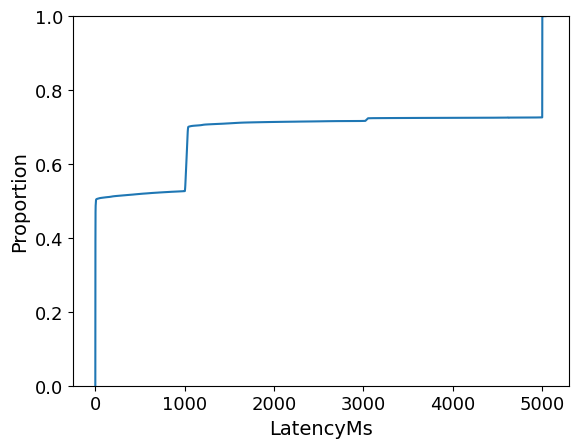

In [72]:
# make a cdf of the dropped requests
sns.ecdfplot(x=hit_df.loc[hit_df["isDropped"] == True]["LatencyMs"], label="Dropped Requests")

hence we see that the requests that are dropped around 0 ms are ones that are dropped immediately by rate limiter

In [73]:
def get_bin_df(curr_df, time):

    bin_df = curr_df.copy()
    
    # display(bin_df)

    max_value = math.ceil(bin_df[time].max())

    discrete_interval = 1
    # print(max_value)
    bins = list(range(0, max_value+discrete_interval, discrete_interval))
    labels = bins[1:]

    bin_df["discrete_time"] = pd.cut(bin_df[time], bins=bins, labels=labels)

    bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count() 

    bin_df = bin_df.loc[(bin_df != 0).any(axis=1)]

    bin_df.to_csv("tmp")
    bin_df = pd.read_csv("tmp")
    os.remove("tmp")

    bin_df["throughput"] = bin_df[time]
    
    # bin_df.loc[bin_df["Run"] == 0, "throughput"] = 0
    
    # print(curr_df.columns)
    
    # get number of unique iterations
    n_unique_iterations = len(curr_df["Iteration"].unique())
    
    bin_df["throughput"] = bin_df["throughput"] / n_unique_iterations
    # print("number of iterations:", curr_df["Iteration"].max())
    
    return bin_df
    
def merge_dfs_for_hue(dfs, df_names):
    merged_df = dfs[0].copy()
    merged_df["hue"] = df_names[0]
    for i in range(1, len(dfs)):
        tmp_df = dfs[i].copy()
        tmp_df["hue"] = df_names[i]
        merged_df = pd.concat([merged_df, tmp_df], ignore_index=True)
        
    return merged_df
    
def plot_throughput(hit_df, ax, fontsizes):
    
    # df = pd.DataFrame()
    
    # for run in hit_df["Run"].unique():
    #     curr_df = hit_df[hit_df["Run"] == run].copy()
    #     curr_merge_df = merge_dfs_for_hue([get_bin_df(curr_df, "StartTime"), get_bin_df(curr_df, "EndTime")], ["StartTime", "EndTime"])
    #     df = pd.concat([df, curr_merge_df], ignore_index=True)
    
    sent_df = get_bin_df(hit_df, "StartTime")
    admitted_df = get_bin_df(hit_df[hit_df["isAdmitted"] == True], "StartTime")
    
    all_completion_df = get_bin_df(hit_df, "EndTime")
    successful_completion_df = get_bin_df(hit_df[(hit_df["isDropped"] == False) & (hit_df["LatencyMs"] < 100000000000)], "EndTime") # 
    
    # df = merge_dfs_for_hue([sent_df, admitted_df, all_completion_df, successful_completion_df], ["StartTime", "Admitted", "AllEndTimes", "EndTime"])
    df = merge_dfs_for_hue([sent_df, successful_completion_df], ["StartTime", "EndTime"])
    
    # display(df)
    
    # plot_barplot(get_bin_df("start_time"), ax, "app", "req_completion_throughput", [0, 80], 10, "Req. Completion Rate (s⁻¹)", fontsizes, sns.color_palette("Set2").as_hex()[-1])

    # plot_barplot(get_bin_df("finish_time"), ax, "app", "req_completion_throughput", [0, 80], 10, "Req. Completion Rate (s⁻¹)", fontsizes, sns.color_palette("Set2").as_hex()[1])
    
    # display(get_bin_df("finish_time"))
    
    ylims, ydiff, y_label, fontsizes = [0, 100], 20, "Throughput (s⁻¹)", fontsizes
    
    sns.barplot(ax=ax, data=df, x="DstSvcNum", y="throughput", hue="hue", errorbar=("pi", 90), estimator="mean",
                edgecolor="black", linewidth=0.75, errwidth=2.25, errcolor="black", capsize=0.05,
                hue_order=["StartTime", "EndTime"],
                # hue_order=["StartTime", "Admitted", "AllEndTimes", "EndTime"],
                palette=sns.color_palette("Set2").as_hex()[3:])

    # hatches = cycle(['//', '--', '..', '\\\\'])
    # num_locations = df["DstSvc"].nunique()
    # for i, patch in enumerate(ax.patches):
    #     if i % num_locations == 0:
    #         hatch = next(hatches)
    #     patch.set_hatch(hatch)
        
    hatches = cycle(['--', '..'])
    num_locations = df["DstSvcNum"].nunique()
    for i, patch in enumerate(ax.patches):
        if i % num_locations == 0:
            hatch = next(hatches)
        patch.set_hatch(hatch)

    ax.grid(axis="y")
    ax.set_axisbelow(True)

    # # ax.set_xticks([1, 2])
    # n_dstsvcs = len(df["DstSvcNum"].unique())
    # ax.set_xticklabels(list(range(1, n_dstsvcs+1)), fontsize=fontsizes[0])

    ax.set_yticks(range(ylims[0], ylims[1]+1, ydiff))
    ax.set_yticklabels(range(ylims[0], ylims[1]+1, ydiff), fontsize=fontsizes[0])
    ax.set_ylim(ylims[0], ylims[1])

    ax.set_xlabel("Service", fontsize=fontsizes[1])
    ax.set_ylabel(y_label, fontsize=fontsizes[1])
    ax.set_title(f"")

    # def change_width(ax, new_value) :
    #     for patch in ax.patches:
    #         current_width = patch.get_width()
    #         diff = current_width - new_value

    #         # we change the bar width
    #         patch.set_width(new_value)

    #         # we recenter the bar
    #         patch.set_x(patch.get_x() + diff * .5)
            
    # change_width(ax, .5) 
    
    # remove legend
    ax.get_legend().remove()
    
    return df

In [74]:
hit_df

,ReqNum,DstSvc,DstSvcNum,DstPod,isDropped,StartTime,EndTime,Latency,LatencyMs,LB,Distribution,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment,isAdmitted
0,5,svc0,1,svc0-0,False,0.099312,0.421083,0.321771,321.771282,mplb_lr++,exponential,2,0.7,1,1,exponential,True,True
1,12,svc0,1,svc0-0,False,0.346821,0.463370,0.116550,116.549592,mplb_lr++,exponential,2,0.7,1,1,exponential,True,True
2,11,svc0,1,svc0-0,False,0.331419,0.536313,0.204894,204.893739,mplb_lr++,exponential,2,0.7,1,1,exponential,True,True
3,20,svc0,1,svc0-0,False,0.516003,0.787797,0.271794,271.794473,mplb_lr++,exponential,2,0.7,1,1,exponential,True,True
4,33,svc0,1,svc0-0,False,0.690684,0.940747,0.250063,250.062911,mplb_lr++,exponential,2,0.7,1,1,exponential,True,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18249993,5495,svc14,15,svc14-1,False,59.570612,60.627995,1.057383,1057.383002,mplb_md,exponential,3,0.9,3,15,exponential,True,True
18249994,5505,svc14,15,svc14-1,False,59.660374,60.816895,1.156521,1156.521017,mplb_md,exponential,3,0.9,3,15,exponential,True,True
18249995,5520,svc14,15,svc14-1,False,59.843439,60.896490,1.053051,1053.051100,mplb_md,exponential,3,0.9,3,15,exponential,True,True
18249996,5529,svc14,15,svc14-1,False,59.987094,61.020390,1.033296,1033.296231,mplb_md,exponential,3,0.9,3,15,exponential,True,True


In [75]:
req_df

,SrcPod,SrcSvc,DstPod,DstSvc,DstSvcNum,StartTime,EndTime,Latency,LatencyMs,LB,Distribution,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment
0,istio-ingressgateway-svc3-59fcb5fcd9-87krm,istio-ingressgateway-svc3,svc3-0,svc3.mplb.com,4,0.018030,0.041030,0.023,23.000002,mplb_lr++,exponential,2,0.7,1,1,exponential,True
1,istio-ingressgateway-svc7-575f8f5bd5-x7bfp,istio-ingressgateway-svc7,svc7-0,svc7.mplb.com,8,0.007030,0.056030,0.049,49.000025,mplb_lr++,exponential,2,0.7,1,1,exponential,True
2,istio-ingressgateway-svc7-575f8f5bd5-x7bfp,istio-ingressgateway-svc7,svc7-1,svc7.mplb.com,8,0.057030,0.079030,0.022,22.000074,mplb_lr++,exponential,2,0.7,1,8,exponential,True
3,istio-ingressgateway-svc5-675d7b5677-q7qnv,istio-ingressgateway-svc5,svc5-1,svc5.mplb.com,6,0.032030,0.082030,0.050,49.999952,mplb_lr++,exponential,2,0.7,1,6,exponential,True
4,istio-ingressgateway-svc10-7877bc5df-t7cxc,istio-ingressgateway-svc10,svc10-1,svc10.mplb.com,11,0.039030,0.085030,0.046,46.000004,mplb_lr++,exponential,2,0.7,1,11,exponential,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18041987,istio-ingressgateway-svc3-5ddc874464-ghs7n,istio-ingressgateway-svc3,svc3-1,svc3.mplb.com,4,61.849606,62.235606,0.386,385.999918,mplb_md,exponential,3,0.9,3,4,exponential,False
18041988,istio-ingressgateway-svc11-74bd4f964b-54st9,istio-ingressgateway-svc11,svc11-1,svc11.mplb.com,12,62.202606,62.238606,0.036,36.000013,mplb_md,exponential,3,0.9,3,12,exponential,False
18041989,istio-ingressgateway-svc14-684fdd8fc6-7kzzg,istio-ingressgateway-svc14,svc14-1,svc14.mplb.com,15,62.177606,62.251606,0.074,74.000120,mplb_md,exponential,3,0.9,3,15,exponential,False
18041990,istio-ingressgateway-svc14-684fdd8fc6-7kzzg,istio-ingressgateway-svc14,svc14-1,svc14.mplb.com,15,62.221606,62.254606,0.033,32.999992,mplb_md,exponential,3,0.9,3,15,exponential,False


In [76]:
def plot_stats(lb, distr, process_distr, run, iteration, rps):

    size = 12
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 4))

    fontsizes = [17, 18]

    tmp_df = plot_throughput(hit_df.loc[hit_df["Distribution"] == distr].loc[hit_df["ProcessDistribution"] == process_distr].loc[hit_df["LB"] == lb].loc[hit_df["Run"] == run].loc[hit_df["Iteration"] == iteration].loc[hit_df["in_experiment"] == True].loc[hit_df["Load"] == rps].copy(), ax1, fontsizes)
    plot_latency(req_df.loc[req_df["Distribution"] == distr].loc[req_df["ProcessDistribution"] == process_distr].loc[req_df["LB"] == lb].loc[req_df["Run"] == run].loc[req_df["Iteration"] == iteration].loc[req_df["in_experiment"] == True].loc[req_df["Load"] == rps].copy(), ax2, fontsizes)
    plot_cpu(cpu_df.loc[cpu_df["Distribution"] == distr].loc[cpu_df["ProcessDistribution"] == process_distr].loc[cpu_df["LB"] == lb].loc[cpu_df["Run"] == run].loc[cpu_df["Iteration"] == iteration].loc[cpu_df["in_experiment"] == True].loc[cpu_df["Load"] == rps].copy(), ax3, fontsizes)


    hatches = ['//', '--', '..', '\\\\']
    handles = []
    colors = [sns.color_palette("Set2").as_hex()[3], sns.color_palette("Set2").as_hex()[4]]
    for i, time in enumerate(["Sending", "Admission", "Completion", "Successful Completion"]):
        handles += [mpatches.Patch(color=colors[i], hatch=hatches[i], label=f"{time}", ec='#141414', lw=1)]

    ax1.legend(handles=handles,
            loc='upper center', bbox_to_anchor=(0.5, 1.30),
            ncol=1, columnspacing=0,
            fontsize=15,
            borderaxespad=0., borderpad=0., frameon=False)

    hatches = ['//', 'xx', '\\\\']
    handles = []
    for app in [1, 2 ,3]:
        handles += [mpatches.Patch(color=sns.color_palette("Set2").as_hex()[app-1], hatch=hatches[app-1], label=f"Service {app}", ec='#141414', lw=1)]

    ax3.legend(handles=handles,
            loc='upper center', bbox_to_anchor=(0.4, 1.30),
            ncol=2, columnspacing=1,
            fontsize=15,
            borderaxespad=0., borderpad=0., frameon=False)

    plt.tight_layout(pad=0.5)
    plt.subplots_adjust(wspace=0.4, hspace=0.)
    
    ax2.text(0.5, 1.2, f"Run {run} with {lb.upper()}", fontsize=fontsizes[1], ha='center', va='center', transform=ax2.transAxes)

    savefig(f"stats_{lb}_run")
    
    return tmp_df

In [77]:
def get_iters(df, lb, distr, process_distr, run, in_experiment, scale_factor, iteration_lims):
    try:
        df = df.loc[df["DstSvc"] != "svc2"]
        # df = df.loc[df["StartTime"] > 20]
    except:
        pass
    
    return df.loc[df["Distribution"] == distr]\
            .loc[df["ProcessDistribution"] == process_distr]\
            .loc[df["LB"] == lb]\
            .loc[df["Run"] == run]\
            .loc[df["in_experiment"] == in_experiment]\
            .loc[df["ScaleFactor"] == scale_factor]\
            .loc[df["Iteration"] >= iteration_lims[0]]\
            .loc[df["Iteration"] <= iteration_lims[1]]\
            .loc[df["Node"] <= 15].copy()

LB = {
    "mplb_lrrpsb": "Least Request",
    "mplb_wrrpsb": "MPLB w/\nWeighted Random",
    "mplb_mdrpsb": "MPLB w/\nCorrected Weighted Random",
    "mplb_lr": "Least Request",
    "mplb_wr": "MPLB w/\nWeighted Random",
    "mplb_md": "MPLB w/\nCorrected Weighted Random",
    "mplb_nlr": "MPLB w/ Nodal LR",
    "mplb_tnlr": "MPLB w\n[Fixed] Nodal LR",
    "mplb_lr++": "Least Request ++",
    "mplb_lr++_rl": "Least Request ++ [w/ AC]",
    "mplb_onlr": "MPLB w\n[Fixed] Nodal LR",
}
LB = {
    "mplb_lr": "LR",
    "mplb_lr++": "LR++",
    "mplb_lr_rl": "<LR>",
    "mplb_lr++_rl": "<LR++>",
    "mplb_onlr": "NLR",
    "mplb_nlr": "<NLR>",
    "mplb_md": "<CWR>",
}
LBNAMES = {
    "mplb_lr++": "LR",
    "mplb_lr++_rlpb": "LR + Perf. Based Rate Limiting",
    "mplb_lr++_rl": "LR + MPLB-RL",
    "mplb_onlr": "NLR",
    "mplb_nlr_rlpb": "NLR + Perf. Based Rate Limiting",
    "mplb_nlr": "Rabbit",
    "mplb_md": "MPLB [CWR]"
    }
    
LB_ALIASES = {
    "mplb_lr++": "LR",
    "mplb_nlr_rlpb": "NLR+PBRL",
    "mplb_lr++_rlpb": "LR+PBRL",
    "mplb_onlr": "NLR",
    "mplb_nlr": "NLR+AC",
    "mplb_md": "CWR+AC",
}

def plot_stats(axes, lb, distr, process_distr, run, scale_factor, iteration_lims=(float("-inf"), float("inf")), start_time=0):

    (ax1, ax2, ax3) = axes

    fontsizes = [16, 17]   

    tmp_df = plot_throughput(get_iters(hit_df.loc[hit_df["StartTime"] > start_time], lb, distr, process_distr, run, True, scale_factor, iteration_lims), ax1, fontsizes)
    plot_latency(get_iters(req_df.loc[req_df["StartTime"] > start_time], lb, distr, process_distr, run, True, scale_factor, iteration_lims), ax2, fontsizes)
    plot_cpu(get_iters(cpu_df.loc[cpu_df["Time"] > start_time], lb, distr, process_distr, run, True, scale_factor, iteration_lims), ax3, fontsizes)


    # hatches = ['//', '--', '..', '\\\\']
    # handles = []
    # colors = sns.color_palette("Set2").as_hex()[3:]
    # for i, time in enumerate(["Sending Rate", "Admission Rate", "Completion Rate", "Success Rate"]):
    #     handles += [mpatches.Patch(color=colors[i], hatch=hatches[i], label=f"{time}", ec='#141414', lw=1)]
    # ax1.legend(handles=handles,
    #         loc='upper center', bbox_to_anchor=(0.5, 1.3),
    #         ncol=2, columnspacing=1,
    #         fontsize=fontsizes[0]-1-4,
    #         borderaxespad=0., borderpad=0., frameon=False)
    
    hatches = ['--', '..']
    handles = []
    colors = [sns.color_palette("Set2").as_hex()[3], sns.color_palette("Set2").as_hex()[4]]
    for i, time in enumerate(["Sending Rate", "Completion Rate"]):
        handles += [mpatches.Patch(color=colors[i], hatch=hatches[i], label=f"{time}", ec='#141414', lw=1)]
    ax1.legend(handles=handles,
            loc='upper center', bbox_to_anchor=(0.5, 1.35),
            ncol=1, columnspacing=0,
            fontsize=fontsizes[0]-1,
            borderaxespad=0., borderpad=0., frameon=False)


    # hatches = ['//', 'xx', '\\\\']
    # handles = []
    # for app in [1, 2]:
    #     handles += [mpatches.Patch(color=sns.color_palette("Set2").as_hex()[app-1], hatch=hatches[app-1], label=f"Service {app}", ec='#141414', lw=1)]

    # ax3.legend(handles=handles,
    #         loc='upper center', bbox_to_anchor=(0.5, 1.35),
    #         ncol=1, columnspacing=1,
    #         fontsize=fontsizes[0]-1,
    #         borderaxespad=0., borderpad=0., frameon=False)
    
    if lb == "mplb_lr++":
        lbp = "Least Request"
    elif lb == "mplb_lr++_rl":
        lbp = "Least Request [w/ RL]"
    elif lb == "mplb_nlr":
        lbp = "MPLB [w/ RL]"
    else:
        lbp = "Rabbit"
        
    lbp = LBNAMES[lb]
    
    # ax2.text(0.5, 1.2, f"State: {run} [{iteration_lims[0]}-{iteration_lims[1]}]\nSF:{scale_factor}\n{LB[lb]}", fontsize=fontsizes[1]-2, ha='center', va='center', transform=ax2.transAxes)
    ax2.text(0.5, 1.2, f"Run {run} | SF {scale_factor}\n{lbp}", fontsize=fontsizes[1]-2, ha='center', va='center', transform=ax2.transAxes)
    
    return tmp_df

BAR_WIDTH_SHIFT = 0.4

/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.7 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.7 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.7 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.75 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.75 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.75 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.8 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.8 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.8 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.85 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.85 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.85 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.9 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.9 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.9 mplb_nlr 


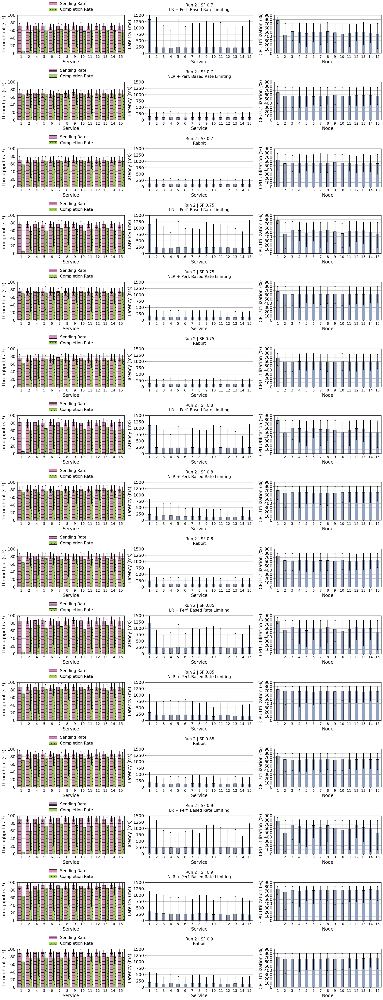

In [80]:
runs = [2]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    # "mplb_lr++",
    "mplb_lr++_rlpb",
    # "mplb_onlr",
    "mplb_nlr_rlpb",
    "mplb_nlr",
    # "mplb_md",
    ]
if runs[0] == 5:
    lbs = [
        # "mplb_lr++",
        "mplb_lr++_rlpb",
        # "mplb_onlr",
        "mplb_nlr_rlpb",
        "mplb_nlr",
    ]

scale_factors = [0.7, 0.75, 0.8, 0.85, 0.9]

fig, axes = plt.subplots(len(lbs) * len(scale_factors), 3, figsize=(20, 3.5 * len(lbs) * len(scale_factors)), gridspec_kw={'width_ratios': [1, 1, 1]})

# if len(axes) == 1:
#     axes = [axes]

# plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)
# plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)

plot_i = 0

distr, process_distr = ("exponential", "exponential")
iterations = (1, 3)
for scale_factor in scale_factors:
    for n_lb, lb in enumerate(lbs):
        for n_state, state in enumerate(runs):
            tmp_df = plot_stats(axes[plot_i], lb, distr, process_distr, state, scale_factor, iterations, start_time=0)
            print(f"Plotted [{state}] {scale_factor} {lb} ")
            plot_i += 1

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
savefig(f"exp_canonical_0.8_all")


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.7 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.7 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.7 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.75 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.75 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.75 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.8 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.8 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.8 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.85 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.85 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.85 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.9 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.9 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.9 mplb_nlr 


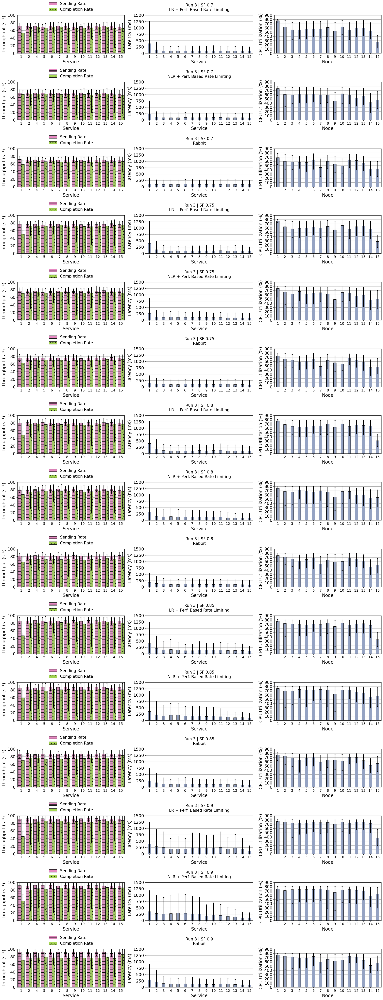

In [81]:
runs = [3]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    # "mplb_lr++",
    "mplb_lr++_rlpb",
    # "mplb_onlr",
    "mplb_nlr_rlpb",
    "mplb_nlr",
    # "mplb_md",
    ]
if runs[0] == 5:
    lbs = [
        # "mplb_lr++",
        "mplb_lr++_rlpb",
        # "mplb_onlr",
        "mplb_nlr_rlpb",
        "mplb_nlr",
    ]

scale_factors = [0.7, 0.75, 0.8, 0.85, 0.9]

fig, axes = plt.subplots(len(lbs) * len(scale_factors), 3, figsize=(20, 3.5 * len(lbs) * len(scale_factors)), gridspec_kw={'width_ratios': [1, 1, 1]})

# if len(axes) == 1:
#     axes = [axes]

# plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)
# plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)

plot_i = 0

distr, process_distr = ("exponential", "exponential")
iterations = (1, 3)
for scale_factor in scale_factors:
    for n_lb, lb in enumerate(lbs):
        for n_state, state in enumerate(runs):
            tmp_df = plot_stats(axes[plot_i], lb, distr, process_distr, state, scale_factor, iterations, start_time=0)
            print(f"Plotted [{state}] {scale_factor} {lb} ")
            plot_i += 1

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
savefig(f"run_3")


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.7 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.7 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.7 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.75 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.75 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.75 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.8 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.8 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.8 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.85 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.85 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.85 mplb_nlr 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.9 mplb_lr++_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.9 mplb_nlr_rlpb 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [5] 0.9 mplb_nlr 


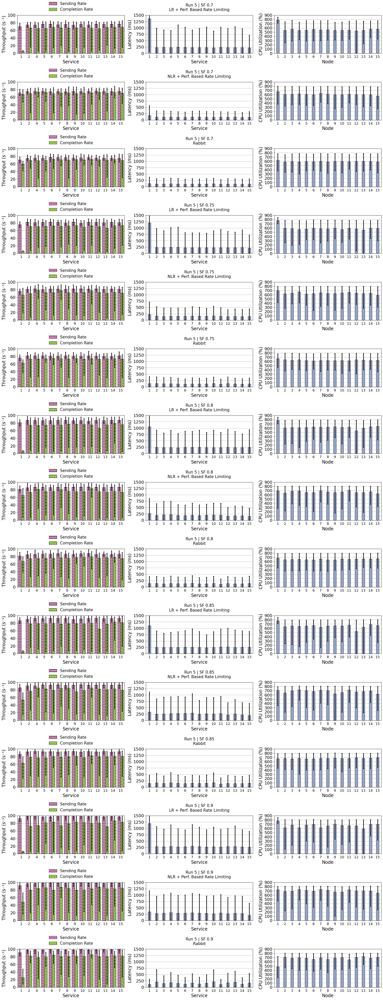

In [82]:
runs = [5]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    # "mplb_lr++",
    "mplb_lr++_rlpb",
    # "mplb_onlr",
    "mplb_nlr_rlpb",
    "mplb_nlr",
    # "mplb_md",
    ]
if runs[0] == 5:
    lbs = [
        # "mplb_lr++",
        "mplb_lr++_rlpb",
        # "mplb_onlr",
        "mplb_nlr_rlpb",
        "mplb_nlr",
    ]

scale_factors = [0.7, 0.75, 0.8, 0.85, 0.9]

fig, axes = plt.subplots(len(lbs) * len(scale_factors), 3, figsize=(20, 3.5 * len(lbs) * len(scale_factors)), gridspec_kw={'width_ratios': [1, 1, 1]})

# if len(axes) == 1:
#     axes = [axes]

# plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)
# plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)

plot_i = 0

distr, process_distr = ("exponential", "exponential")
iterations = (1, 3)
for scale_factor in scale_factors:
    for n_lb, lb in enumerate(lbs):
        for n_state, state in enumerate(runs):
            tmp_df = plot_stats(axes[plot_i], lb, distr, process_distr, state, scale_factor, iterations, start_time=0)
            print(f"Plotted [{state}] {scale_factor} {lb} ")
            plot_i += 1

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
savefig(f"run_5")


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.7 mplb_md 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.75 mplb_md 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.8 mplb_md 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.85 mplb_md 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [2] 0.9 mplb_md 


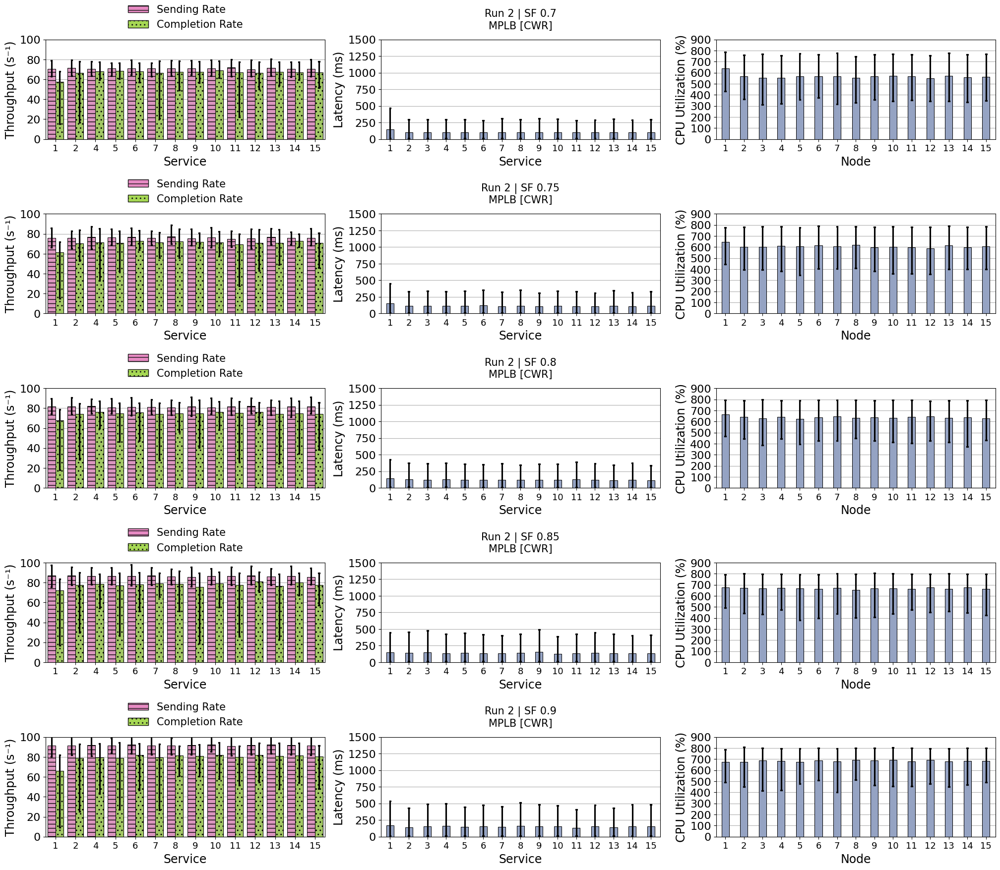

In [83]:
runs = [2]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    # "mplb_lr++",
    # "mplb_lr++_rlpb",
    # # "mplb_onlr",
    # "mplb_nlr_rlpb",
    # "mplb_nlr",
    "mplb_md",
    ]
if runs[0] == 5:
    lbs = [
        # "mplb_lr++",
        "mplb_lr++_rlpb",
        # "mplb_onlr",
        "mplb_nlr_rlpb",
        "mplb_nlr",
    ]

scale_factors = [0.7, 0.75, 0.8, 0.85, 0.9]

fig, axes = plt.subplots(len(lbs) * len(scale_factors), 3, figsize=(20, 3.5 * len(lbs) * len(scale_factors)), gridspec_kw={'width_ratios': [1, 1, 1]})

# if len(axes) == 1:
#     axes = [axes]

# plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)
# plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)

plot_i = 0

distr, process_distr = ("exponential", "exponential")
iterations = (1, 3)
for scale_factor in scale_factors:
    for n_lb, lb in enumerate(lbs):
        for n_state, state in enumerate(runs):
            tmp_df = plot_stats(axes[plot_i], lb, distr, process_distr, state, scale_factor, iterations, start_time=0)
            print(f"Plotted [{state}] {scale_factor} {lb} ")
            plot_i += 1

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
savefig(f"run_2_md")


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.7 mplb_md 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.75 mplb_md 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.8 mplb_md 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.85 mplb_md 


/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(["Run", "DstSvcNum", "discrete_time"]).count()
/tmp/ipykernel_907565/1711697801.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_df = bin_df.groupby(

Plotted [3] 0.9 mplb_md 


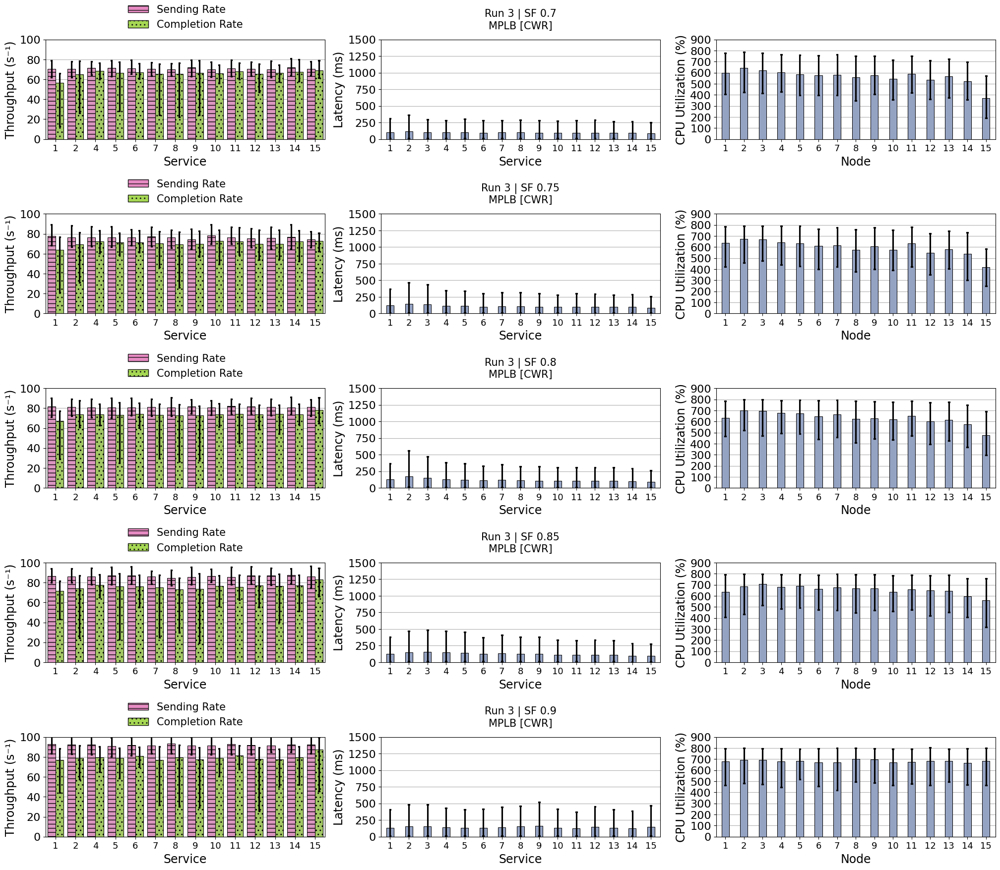

In [84]:
runs = [3]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    # "mplb_lr++",
    # "mplb_lr++_rlpb",
    # # "mplb_onlr",
    # "mplb_nlr_rlpb",
    # "mplb_nlr",
    "mplb_md",
    ]
if runs[0] == 5:
    lbs = [
        # "mplb_lr++",
        "mplb_lr++_rlpb",
        # "mplb_onlr",
        "mplb_nlr_rlpb",
        "mplb_nlr",
    ]

scale_factors = [0.7, 0.75, 0.8, 0.85, 0.9]

fig, axes = plt.subplots(len(lbs) * len(scale_factors), 3, figsize=(20, 3.5 * len(lbs) * len(scale_factors)), gridspec_kw={'width_ratios': [1, 1, 1]})

# if len(axes) == 1:
#     axes = [axes]

# plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)
# plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)

plot_i = 0

distr, process_distr = ("exponential", "exponential")
iterations = (1, 3)
for scale_factor in scale_factors:
    for n_lb, lb in enumerate(lbs):
        for n_state, state in enumerate(runs):
            tmp_df = plot_stats(axes[plot_i], lb, distr, process_distr, state, scale_factor, iterations, start_time=0)
            print(f"Plotted [{state}] {scale_factor} {lb} ")
            plot_i += 1

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
savefig(f"run_3_md")


Plotted
Plotted
Plotted
Plotted
Plotted
Plotted


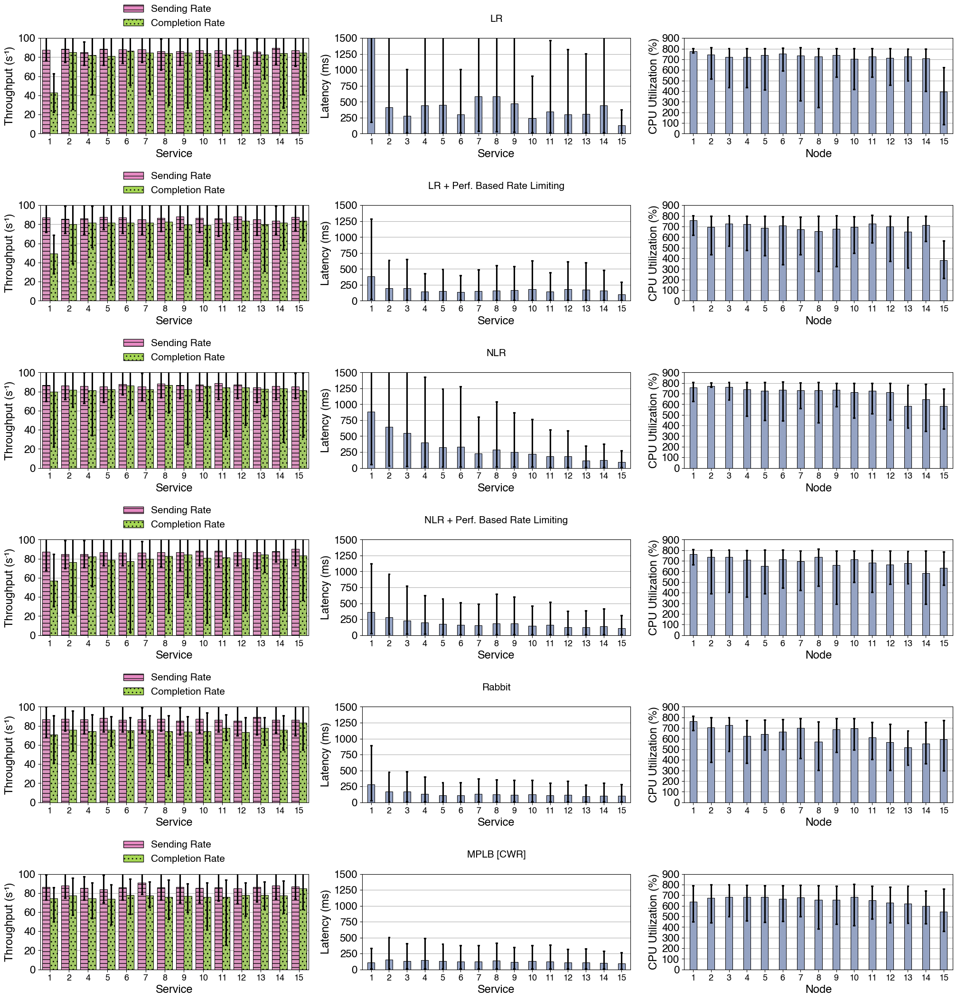

In [54]:
runs = [3]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    "mplb_lr++",
    "mplb_lr++_rlpb",
    "mplb_onlr",
    "mplb_nlr_rlpb",
    "mplb_nlr",
    "mplb_md",
    ]

fig, axes = plt.subplots(len(lbs), 3, figsize=(20, 3.5 * len(lbs)), gridspec_kw={'width_ratios': [1, 1, 1]})

# if len(axes) == 1:
#     axes = [axes]

# plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)
# plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)

distr, process_distr = ("exponential", "exponential")
iterations = (1, 1)
for scale_factor in [0.85]:
    for n_lb, lb in enumerate(lbs):
        for n_state, state in enumerate(runs):
            tmp_df = plot_stats(axes[n_lb], lb, distr, process_distr, state, scale_factor, iterations, start_time=0)
            print("Plotted")

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
# savefig(f"exp_canonical_0.8_all")


Plotted
Plotted
Plotted
Plotted
Plotted
Plotted


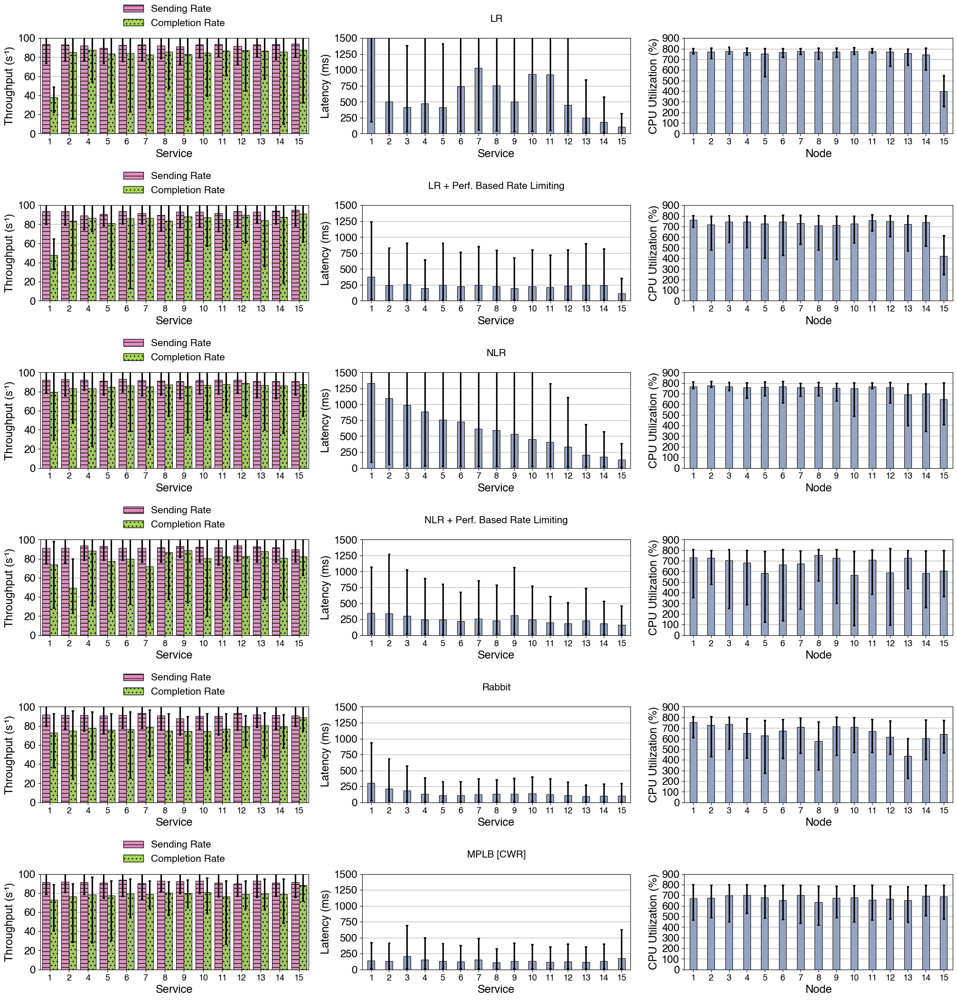

In [55]:
runs = [3]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    "mplb_lr++",
    "mplb_lr++_rlpb",
    "mplb_onlr",
    "mplb_nlr_rlpb",
    "mplb_nlr",
    "mplb_md",
    ]

fig, axes = plt.subplots(len(lbs), 3, figsize=(20, 3.5 * len(lbs)), gridspec_kw={'width_ratios': [1, 1, 1]})

# if len(axes) == 1:
#     axes = [axes]

# plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)
# plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)

distr, process_distr = ("exponential", "exponential")
iterations = (1, 1)
for scale_factor in [0.9]:
    for n_lb, lb in enumerate(lbs):
        for n_state, state in enumerate(runs):
            tmp_df = plot_stats(axes[n_lb], lb, distr, process_distr, state, scale_factor, iterations, start_time=0)
            print("Plotted")

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
# savefig(f"exp_canonical_0.8_all")


Plotted
Plotted
Plotted
Plotted
Plotted


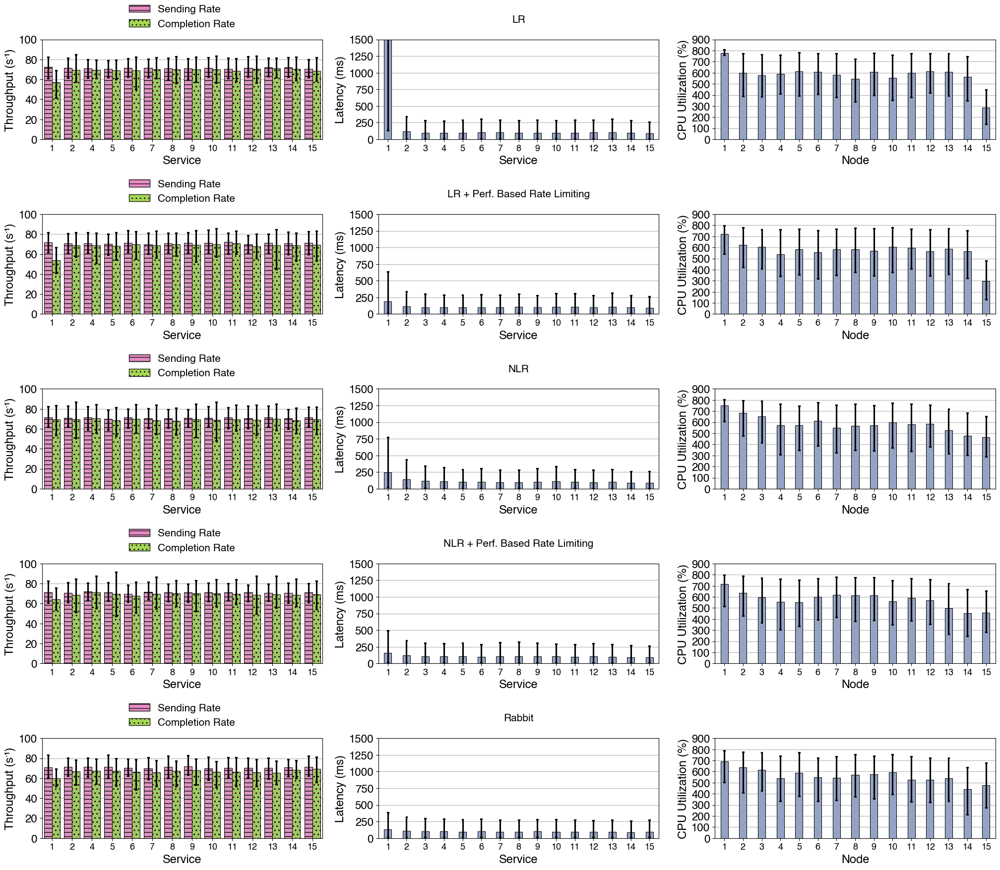

In [ ]:
runs = [2]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    "mplb_lr++",
    "mplb_lr++_rlpb",
    "mplb_onlr",
    "mplb_nlr_rlpb",
    "mplb_nlr",
    # "mplb_md",
    ]

fig, axes = plt.subplots(len(lbs), 3, figsize=(20, 3.5 * len(lbs)), gridspec_kw={'width_ratios': [1, 1, 1]})

# if len(axes) == 1:
#     axes = [axes]

# plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)
# plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)

distr, process_distr = ("exponential", "exponential")
iterations = (1, 2)
for scale_factor in [.8]:
    for n_lb, lb in enumerate(lbs):
        for n_state, state in enumerate(runs):
            tmp_df = plot_stats(axes[n_lb], lb, distr, process_distr, state, scale_factor, iterations, start_time=0)
            print("Plotted")

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
# savefig(f"exp_canonical_0.8_all")


Plotted
Plotted
Plotted
Plotted
Plotted


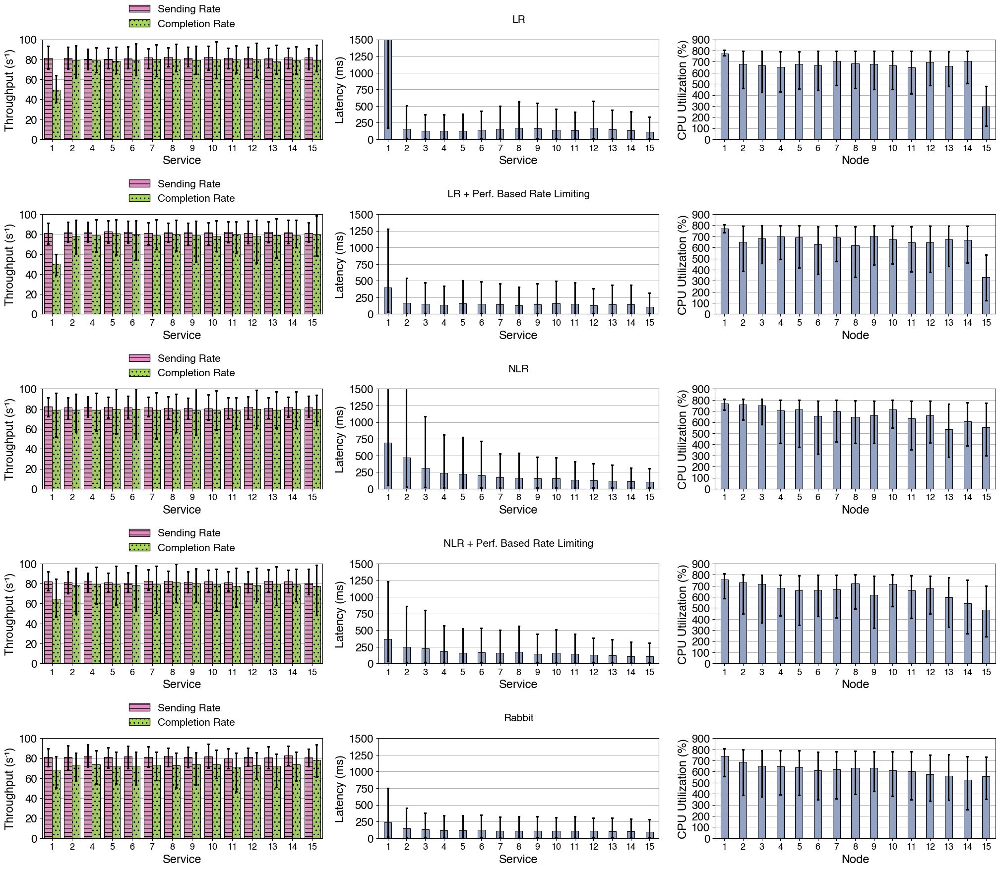

In [1245]:
runs = [3]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    "mplb_lr++",
    "mplb_lr++_rlpb",
    "mplb_onlr",
    "mplb_nlr_rlpb",
    "mplb_nlr",
    # "mplb_md",
    ]

fig, axes = plt.subplots(len(lbs), 3, figsize=(20, 3.5 * len(lbs)), gridspec_kw={'width_ratios': [1, 1, 1]})

# if len(axes) == 1:
#     axes = [axes]

# plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)
# plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)

distr, process_distr = ("exponential", "exponential")
iterations = (1, 2)
for scale_factor in [.8]:
    for n_lb, lb in enumerate(lbs):
        for n_state, state in enumerate(runs):
            tmp_df = plot_stats(axes[n_lb], lb, distr, process_distr, state, scale_factor, iterations, start_time=0)
            print("Plotted")

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
# savefig(f"exp_canonical_0.8_all")


Plotted
Plotted
Plotted
Plotted
Plotted


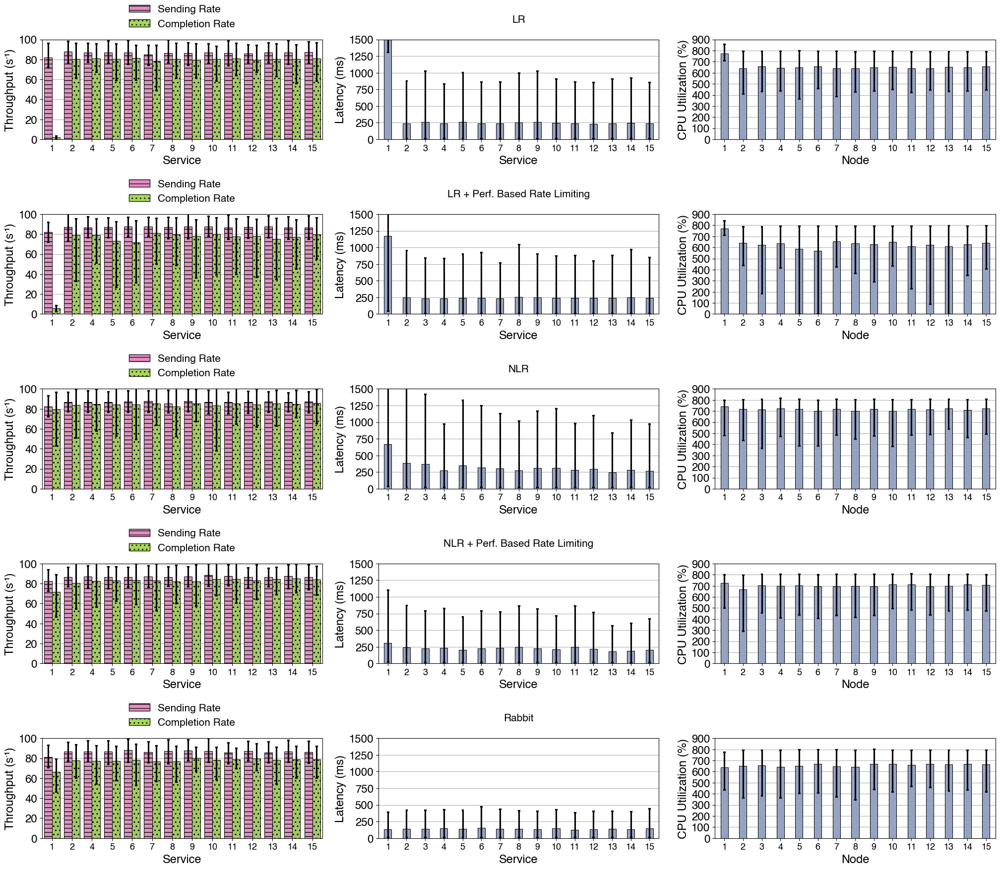

In [1246]:
runs = [5]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    "mplb_lr++",
    "mplb_lr++_rlpb",
    "mplb_onlr",
    "mplb_nlr_rlpb",
    "mplb_nlr",
    # "mplb_md",
    ]

fig, axes = plt.subplots(len(lbs), 3, figsize=(20, 3.5 * len(lbs)), gridspec_kw={'width_ratios': [1, 1, 1]})

# if len(axes) == 1:
#     axes = [axes]

# plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)
# plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)

distr, process_distr = ("exponential", "exponential")
iterations = (1, 2)
for scale_factor in [.8]:
    for n_lb, lb in enumerate(lbs):
        for n_state, state in enumerate(runs):
            tmp_df = plot_stats(axes[n_lb], lb, distr, process_distr, state, scale_factor, iterations, start_time=0)
            print("Plotted")

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
# savefig(f"exp_canonical_0.8_all")


Plotted
Plotted
Plotted
Plotted
Plotted
Plotted


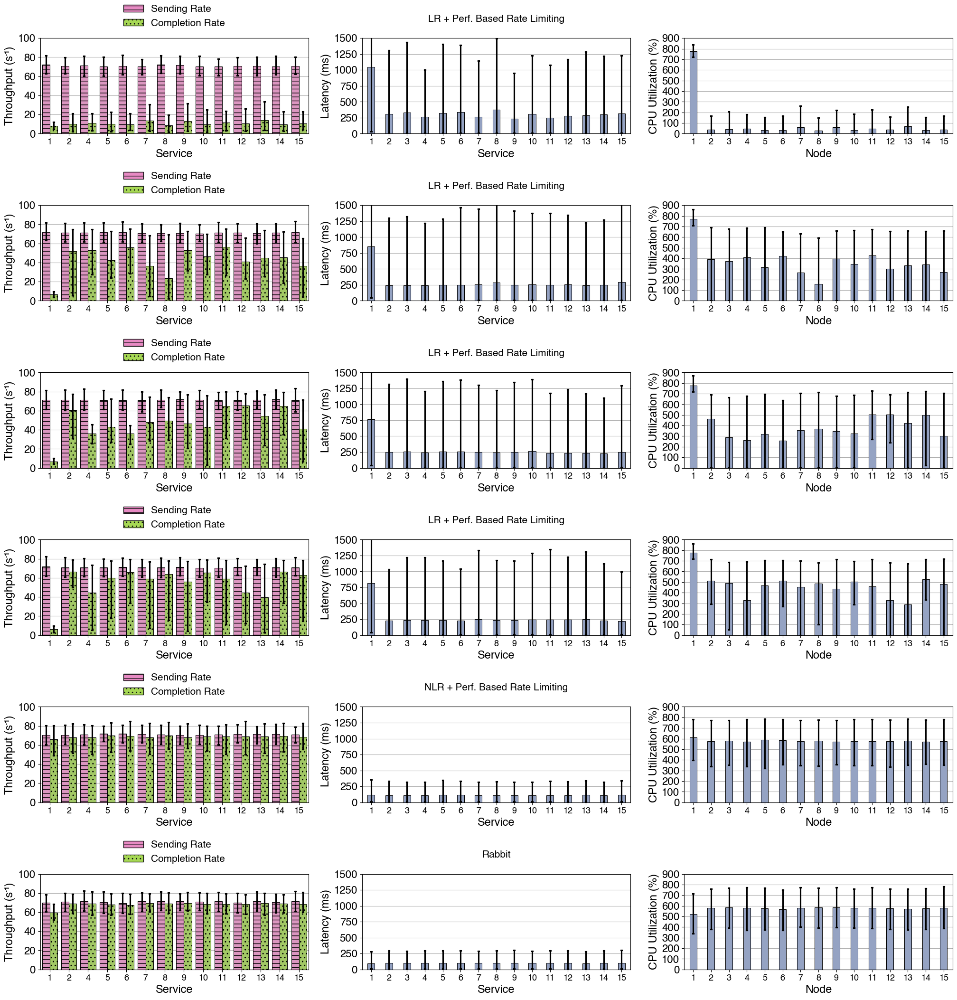

In [ ]:
runs = [2]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    # "mplb_lr++",
    # "mplb_lr++_rlpb",
    # "mplb_onlr",
    "mplb_lr++_rlpb",
    "mplb_lr++_rlpb",
    "mplb_lr++_rlpb",
    "mplb_lr++_rlpb",
    # "mplb_nlr_rlpb",
    # "mplb_nlr",
    "mplb_nlr_rlpb",
    "mplb_nlr",
    # "mplb_nlr_rlpb",
    # "mplb_md",
    ]

fig, axes = plt.subplots(len(lbs), 3, figsize=(20, 3.5 * len(lbs)), gridspec_kw={'width_ratios': [1, 1, 1]})

# if len(axes) == 1:
#     axes = [axes]

# plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)
# plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=0)

distr, process_distr = ("exponential", "exponential")
iterations = (11, 12)
for scale_factor in [.7]:
    for n_lb, lb in enumerate(lbs):
        for n_state, state in enumerate(runs):
            its = (15, 16) if lb == "mplb_lr++_rlpb" else (11, 12)
            if n_lb == 0:
                its = (11, 12)
            if n_lb == 1:
                its = (13, 14)
            if n_lb == 2:
                its = (15, 16)
            if n_lb == 3:
                its = (17, 18)
            tmp_df = plot_stats(axes[n_lb], lb, distr, process_distr, state, scale_factor, its, start_time=0)
            print("Plotted")

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
# savefig(f"exp_canonical_0.8_all")


In [332]:
get_iters(hit_df.loc[hit_df["StartTime"] > 0], "mplb_lr++", "none", "none", 4, True, 0.7, (1, 1))["LatencyMs"].describe()

count    3422.000000
mean      803.458408
std       515.696812
min         4.088503
25%       206.502582
50%      1211.707321
75%      1225.884588
max      3255.871082
Name: LatencyMs, dtype: float64

In [338]:
get_iters(req_df.loc[req_df["StartTime"] > 10], "mplb_lr++", "none", "none", 4, True, 0.7, (1, 1))["LatencyMs"].describe()

count    3149.000000
mean      201.234677
std        26.531267
min         1.999855
25%       203.999996
50%       204.999924
75%       205.000162
max       211.000204
Name: LatencyMs, dtype: float64

In [364]:
get_iters(hit_df.loc[hit_df["StartTime"] > 0], "mplb_lr++", "exponential", "exponential", 4, True, 0.7, (1, 1))["LatencyMs"].describe()

count    8590.000000
mean      499.952469
std       540.253727
min         2.768595
25%        46.699013
50%       147.535253
75%      1059.275337
max      5000.635692
Name: LatencyMs, dtype: float64

In [365]:
get_iters(req_df.loc[req_df["StartTime"] > 10], "mplb_lr++", "exponential", "exponential", 4, True, 0.7, (1, 1))["LatencyMs"].describe()

count    7930.000000
mean       82.091678
std        79.500265
min         0.999928
25%        23.999989
50%        57.000160
75%       114.000022
max       863.999844
Name: LatencyMs, dtype: float64

In [ ]:
get_iters(hit_df.loc[hit_df["StartTime"] > 0], "mplb_lr++", "exponential", "exponential", 4, True, 0.7, (1, 5))["LatencyMs"].describe()

count    42890.000000
mean       499.210620
std        541.141316
min          2.544436
25%         46.603033
50%        144.288650
75%       1059.743235
max       5001.036251
Name: LatencyMs, dtype: float64

In [ ]:
runs = [2]

# lbs = ["mplb_lr++", "mplb_onlr", "mplb_nlr", "mplb_lr++_rl"]
lbs = [
    "mplb_lr++",
    "mplb_lr++_rlpb",
    # "mplb_onlr",
    "mplb_nlr",
    "mplb_nlr_rlpb",
    # "mplb_md",
    ]

fig, axes = plt.subplots(len(lbs), 3, figsize=(20, 3.5 * len(lbs)), gridspec_kw={'width_ratios': [1, 1, 1]})

plot_stats(axes[0], "mplb_nlr", "exponential", "exponential", 2, 0.7, (1, 3), start_time=60)
plot_stats(axes[1], "mplb_nlr_rlpb", "exponential", "exponential", 2, 0.7, (1, 3), start_time=60)

# distr, process_distr = ("exponential", "exponential")
# iterations = (1, 10)
# for scale_factor in [.7]:
#     for n_lb, lb in enumerate(lbs):
#         for n_state, state in enumerate(runs):
            
#             tmp_df = plot_stats(axes[n_lb], lb, distr, process_distr, state, scale_factor, iterations, start_time=0)
#             print("Plotted")

plt.tight_layout(pad=0.1)
plt.subplots_adjust(wspace=.2, hspace=0.75)
# savefig(f"exp_canonical_0.8_all")


In [ ]:
def get_custom_bin_df(curr_df, time, bin_size, hue):

    bin_df = curr_df.copy()
    
    # display(bin_df)
    try:
        max_value = math.ceil(bin_df[time].max())
    except Exception as e:
        print(e)
        display(bin_df[time])
        raise

    discrete_interval = bin_size
    # print(max_value)
    bins = list(np.arange(0, max_value+discrete_interval, discrete_interval))
    labels = bins[1:]

    bin_df["discrete_time"] = pd.cut(bin_df[time], bins=bins, labels=labels)

    bin_df = bin_df.groupby(["Run", hue, "discrete_time"]).count() 

    bin_df = bin_df.loc[(bin_df != 0).any(axis=1)]

    bin_df.to_csv("tmp")
    bin_df = pd.read_csv("tmp")
    os.remove("tmp")

    bin_df["throughput"] = bin_df[time]
    
    # bin_df.loc[bin_df["Run"] == 0, "throughput"] = 0
    
    # print(curr_df.columns)
    
    # get number of unique iterations
    n_unique_iterations = len(curr_df["Iteration"].unique())
    
    bin_df["throughput"] = bin_df["throughput"] / n_unique_iterations
    # print("number of iterations:", curr_df["Iteration"].max())
    
    return bin_df
    
def merge_dfs_for_hue(dfs, df_names):
    merged_df = dfs[0].copy()
    merged_df["hue"] = df_names[0]
    for i in range(1, len(dfs)):
        tmp_df = dfs[i].copy()
        tmp_df["hue"] = df_names[i]
        merged_df = pd.concat([merged_df, tmp_df], ignore_index=True)
        
    return merged_df

In [592]:
# plot the cpu utilization and lbweights for run 15 for mplb on the same plot, with different y-axes
def plot_comparison(stats):

    TIME_LIMIT = 130 # seconds
    
    from matplotlib.ticker import MultipleLocator

    n_row = 15
    n_col = len(stats)
    
    fig, axes = plt.subplots(n_row, n_col, figsize=((27.5/4)*n_col, (20/8)*n_row))

    if n_col == 1:
        for i in range(n_row):
            axes[i] = [axes[i]]

    for i, stat in enumerate(stats):
        
        run, rps, iteration, variation, variation_name, distr, proc_distr = stat

        print(i, variation)
        
        row_number = 0
        
        tmp_df = cpu_df.loc[cpu_df["Run"] == run].loc[cpu_df["ScaleFactor"] == rps].loc[cpu_df["LB"] == variation].loc[cpu_df["Distribution"] == distr].loc[cpu_df["ProcessDistribution"] == proc_distr].loc[cpu_df["Run"] == run].loc[cpu_df["Iteration"] == iteration] # .loc[cpu_df["in_experiment"] == True].copy()
        tmp_df = tmp_df.loc[(tmp_df["Node"] >= 1) & (tmp_df["Node"] <= 3)]
        tmp_df = tmp_df.loc[tmp_df["Svc"].isin(["svc0", "svc1", "svc2"])]

        tmp_node_df = tmp_df.copy()
        tmp_sum_df = tmp_node_df.groupby(["Time", "Node"]).sum(numeric_only=True).reset_index().copy() # .loc[(tmp_df["Svc"] == "app1") | (tmp_df["Svc"] == "app2") | (tmp_df["Svc"] == "app3")]
        sns.lineplot(ax=axes[row_number][i], data=tmp_sum_df, x="Time", y="CPUUtil", hue="Node", markers=True, dashes=False, style="Node")
        
        axes[row_number][i].set_ylabel('CPU Utilization (%)')
        axes[row_number][i].set_title(f"CPU Utilization with {variation_name}")
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].set_ylim(0, 900)
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        tmp_df = cpu_df.loc[cpu_df["Run"] == run].loc[cpu_df["ScaleFactor"] == rps].loc[cpu_df["LB"] == variation].loc[cpu_df["Distribution"] == distr].loc[cpu_df["ProcessDistribution"] == proc_distr].loc[cpu_df["Run"] == run].loc[cpu_df["Iteration"] == iteration] # .loc[cpu_df["in_experiment"] == True].copy()

        tmp_df["is_hostagent"] = tmp_df["Pod"].apply(lambda x: "hostagent" in x)
        tmp_df = tmp_df.loc[tmp_df["is_hostagent"] == False]
        tmp_df = tmp_df.loc[tmp_df["Svc"].isin(["svc0", "svc1", "svc2"])]

        
        tmp_cpu_df = tmp_df.copy()
        
        row_number += 1
        
        axes[row_number][i].set_ylabel('CPU Utilization (%)')
        sns.lineplot(ax=axes[row_number][i], data=tmp_df, x="Time", y="CPUUtil", hue="Pod")
        axes[row_number][i].set_title(f"CPU Utilization with {variation_name}")
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].set_ylim(0, 900)
        axes[row_number][i].set_yticks(range(0, 176, 25))
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        row_number += 1
        
        axes[row_number][i].set_ylabel('CPU Utilization (%)')
        tmp_sum_df = tmp_df.loc[(tmp_df["Svc"] == "svc1") | (tmp_df["Svc"] == "svc2") | (tmp_df["Svc"] == "svc0")].groupby(["Svc", "Time"]).sum(numeric_only=True).reset_index().copy()
        sns.lineplot(ax=axes[row_number][i], data=tmp_sum_df, x="Time", y="CPUUtil", hue="Svc")
        axes[row_number][i].set_title(f"CPU Utilization with {variation_name}")
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].set_ylim(0, 900)
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        row_number += 1
        
        axes[row_number][i].set_ylabel('CPU Allocated (%)')
        sns.lineplot(ax=axes[row_number][i], data=tmp_df, x="Time", y="CPUAllocated", hue="Svc")
        axes[row_number][i].set_title(f"CPU Allocation with {variation_name}")
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].set_ylim(0, 900)
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        row_number += 1
        
        axes[row_number][i].set_ylabel('CPU Consumption per request (%s/req)')
        sns.lineplot(ax=axes[row_number][i], data=tmp_df, x="Time", y="CPUConsumptionPerReq", hue="Svc")
        axes[row_number][i].set_title(f"CPU Consumption per request (%s/req) with {variation_name}")
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].set_ylim(0, 10)
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        row_number += 1

        axes[row_number][i].set_ylabel('Perf Based RPS Allowed (1/s)')
        sns.lineplot(ax=axes[row_number][i], data=tmp_df, x="Time", y="PerfBasedRPSAllowed", hue="Svc")
        axes[row_number][i].set_title(f"Perf Based RPS Allowed (1/s) with {variation_name}")
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].set_ylim(0, 25)
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        row_number += 1
        
        axes[row_number][i].set_ylabel('Max RPS Allowed')
        sns.lineplot(ax=axes[row_number][i], data=tmp_df, x="Time", y="MaxRPSAllowed", hue="Svc")
        axes[row_number][i].set_title(f"Max RPS Allowed with {variation_name}")
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].set_ylim(0, 300)
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        
        row_number += 1

        axes[row_number][i].set_ylabel('LB Weight')
        sns.lineplot(ax=axes[row_number][i], data=tmp_df, x="Time", y="LBWeight", hue="Pod")
        axes[row_number][i].set_title(f"LB Weight with {variation_name}")
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].set_ylim(0, 100)
        axes[row_number][i].set_yticks(range(0, 101, 10))
        axes[row_number][i].grid(True, which="both", linestyle="--")
        # print the values on top of the bars
        # for p in axes[row_number][i].patches:
        #     axes[row_number][i].annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
            
        # make a lineplot for latency from hit_df
        
        
        tmp_df = hit_df.loc[hit_df["Run"] == run].loc[hit_df["ScaleFactor"] == rps].loc[hit_df["LB"] == variation].loc[hit_df["Distribution"] == distr].loc[hit_df["ProcessDistribution"] == proc_distr].loc[hit_df["Run"] == run].loc[hit_df["Iteration"] == iteration].loc[hit_df["DstPod"] != "as"]
        tmp_df = tmp_df.loc[tmp_df["DstSvc"].isin(["svc0", "svc1", "svc2"])]

        
        interval = 0.5
        
        row_number += 1
        df = merge_dfs_for_hue([get_custom_bin_df(tmp_df, "StartTime", interval, "DstSvc"), get_custom_bin_df(tmp_df, "EndTime", interval, "DstSvc")], ["StartTime", "EndTime"])
        df["StartTime"] = df["StartTime"] * (1/interval) # divide by 2 to convert request per 0.5s to request per second
        sns.lineplot(ax=axes[row_number][i], data=df.loc[df["hue"] == "StartTime"], x="discrete_time", y="StartTime", hue="DstSvc", estimator="mean")
        
        axes[row_number][i].set_ylabel('RPS (s^-1)')
        axes[row_number][i].set_title(f"Req Sending Rate with {variation_name}")
        axes[row_number][i].set_xlabel('Time (s)')
        axes[row_number][i].set_ylim(0, 150)
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        row_number += 1
        df = merge_dfs_for_hue([get_custom_bin_df(tmp_df, "StartTime", interval, "DstPod"), get_custom_bin_df(tmp_df, "EndTime", interval, "DstPod")], ["StartTime", "EndTime"])
        df["StartTime"] = df["StartTime"] * (1/interval) # divide by 2 to convert request per 0.5s to request per second
        sns.lineplot(ax=axes[row_number][i], data=df.loc[df["hue"] == "StartTime"], x="discrete_time", y="StartTime", hue="DstPod", estimator="mean")
        
        
        axes[row_number][i].set_ylabel('RPS (s^-1)')
        axes[row_number][i].set_title(f"Sending RPS with {variation_name}")
        axes[row_number][i].set_xlabel('Time (s)')
        axes[row_number][i].set_ylim(0, 150)
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        row_number += 1
        df = merge_dfs_for_hue([get_custom_bin_df(tmp_df, "StartTime", interval, "Node"), get_custom_bin_df(tmp_df, "EndTime", interval, "Node")], ["StartTime", "EndTime"])
        df["StartTime"] = df["StartTime"] * (1/interval) # divide by 2 to convert request per 0.5s to request per second
        sns.lineplot(ax=axes[row_number][i], data=df.loc[df["hue"] == "StartTime"], x="discrete_time", y="StartTime", hue="Node", estimator="mean")
        
        axes[row_number][i].set_ylabel('RPS (s^-1)')
        axes[row_number][i].set_title(f"Sending RPS with {variation_name}")
        axes[row_number][i].set_xlabel('Time (s)')
        axes[row_number][i].set_ylim(0, 150)
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].grid(True, which="both", linestyle="--")

        row_number += 1
        
        tmp_cpu_df["MaxRPSAllowed_pod"] = tmp_cpu_df["MaxRPSAllowed"] * tmp_cpu_df["LBWeight"]/100.0
        
        axes[row_number][i].set_ylabel('Max RPS Allowed per Node (req/s)')
        tmp_sum_df = tmp_cpu_df.groupby(["Node", "Time"]).sum(numeric_only=True).reset_index().copy() # .loc[(tmp_cpu_df["Svc"] == "app1") | (tmp_cpu_df["Svc"] == "app2") | (tmp_cpu_df["Svc"] == "app3")]
        sns.lineplot(ax=axes[row_number][i], data=tmp_cpu_df, x="Time", y="MaxRPSAllowed_pod", hue="Node", markers=True, dashes=False, style="Node")
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].set_ylim(0, 100)
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        row_number += 1
        df = merge_dfs_for_hue([get_custom_bin_df(tmp_df, "StartTime", interval, "DstSvc"), get_custom_bin_df(tmp_df, "EndTime", interval, "DstSvc")], ["StartTime", "EndTime"])
        df["StartTime"] = df["StartTime"] * (1/interval) # divide by 2 to convert request per 0.5s to request per second
        sns.lineplot(ax=axes[row_number][i], data=df.loc[df["hue"] == "EndTime"], x="discrete_time", y="StartTime", hue="DstSvc", estimator="mean")
        
        axes[row_number][i].set_ylabel('RPS (s^-1)')
        axes[row_number][i].set_title(f"Req Processing Rate with {variation_name}")
        axes[row_number][i].set_xlabel('Time (s)')
        axes[row_number][i].set_ylim(0, 150)
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        row_number += 1
        axes[row_number][i].set_ylabel('.95 Latency (ms)')
        # Bucket latency by 500ms instead of per second
        tmp_df["StartTimeHalfSec"] = ((tmp_df['StartTime'] / interval).astype(int) * interval).astype(float)
        
        tmp_grouped_df = tmp_df.groupby(["DstSvc", "StartTimeHalfSec"]).quantile(0.95, numeric_only=True).reset_index()
        
        sns.lineplot(ax=axes[row_number][i], data=tmp_grouped_df, x="StartTimeHalfSec", y="LatencyMs", hue="DstSvc", estimator="mean", markers=True, dashes=False, style="DstSvc")
        
        axes[row_number][i].set_title(f"95p Latency with {variation_name}")
        axes[row_number][i].set_xlabel('Time (s)')
        axes[row_number][i].set_ylim(0, 2000)
        axes[row_number][i].set_yticks(range(0, 2001, 200))
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        # axes[row_number][i].xaxis.set_major_locator(MultipleLocator(interval))
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
        row_number += 1
        axes[row_number][i].set_ylabel('Mean Latency (ms)')
        # Bucket latency by 500ms instead of per second
        tmp_df["StartTimeHalfSec"] = ((tmp_df['StartTime'] / interval).astype(int) * interval).astype(float)
        
        tmp_grouped_df = tmp_df.groupby(["DstSvc", "StartTimeHalfSec"]).mean(numeric_only=True).reset_index()
        
        sns.lineplot(ax=axes[row_number][i], data=tmp_grouped_df, x="StartTimeHalfSec", y="LatencyMs", hue="DstSvc", estimator="mean", markers=True, dashes=False, style="DstSvc")
        
        axes[row_number][i].set_title(f"Mean Latency with {variation_name}")
        axes[row_number][i].set_xlabel('Time (s)')
        axes[row_number][i].set_ylim(0, 800)
        axes[row_number][i].set_yticks(range(0, 801, 100))
        axes[row_number][i].set_xlim(0, TIME_LIMIT)
        # axes[row_number][i].xaxis.set_major_locator(MultipleLocator(interval))
        axes[row_number][i].grid(True, which="both", linestyle="--")
        
    fig.tight_layout()
    savefig(f"cpu_util_lbweights_latency_run_{run}_{iteration}")

0 mplb_lr++_rlpb
1 mplb_lr++_rlpb
2 mplb_nlr_rlpb
3 mplb_nlr_rlpb


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


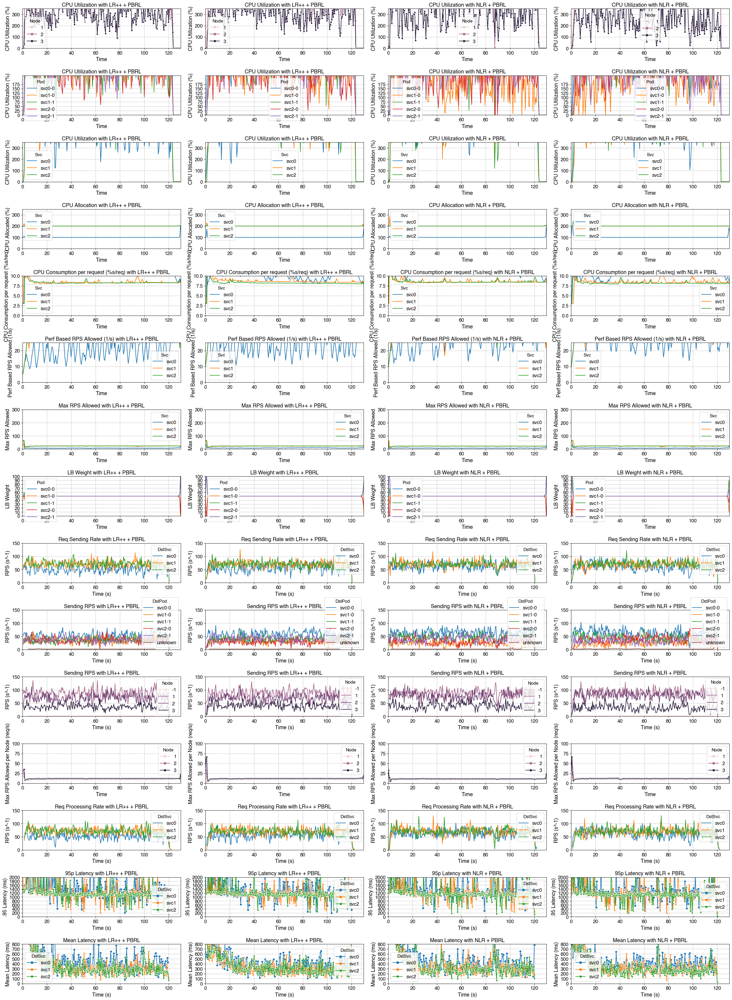

In [591]:
# run, scale_factor, iteration, variation, variation_name, distr, proc_distr
plot_comparison([
    (3, 0.7, 1, "mplb_lr++_rlpb", "LR++ + PBRL", "exponential", "exponential"),
    (3, 0.7, 2, "mplb_lr++_rlpb", "LR++ + PBRL", "exponential", "exponential"),
    (3, 0.7, 1, "mplb_nlr_rlpb", "NLR + PBRL", "exponential", "exponential"),
    (3, 0.7, 2, "mplb_nlr_rlpb", "NLR + PBRL", "exponential", "exponential"),
    # (2, 0.7, 2, "mplb_nlr_rlpb", "NLR + PBRL", "exponential", "exponential"),
    # (2, 0.7, 3, "mplb_nlr_rlpb", "NLR + PBRL", "exponential", "exponential"),
    ])


0 mplb_lr++_rlpb
1 mplb_nlr_rlpb
2 mplb_nlr


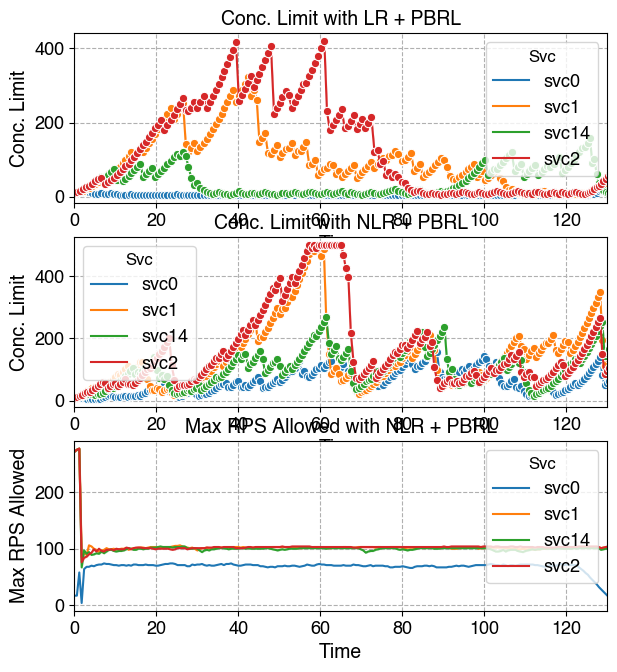

In [1061]:
# plot the cpu utilization and lbweights for run 15 for mplb on the same plot, with different y-axes
def plot_perf_rps(stats):

    TIME_LIMIT = 130 # seconds

    n_row = len(stats)
    n_col = 1
    
    fig, axes = plt.subplots(n_row, n_col, figsize=((27.5/4)*n_col, (20/8)*n_row))

    if n_row == 1:
        axes = [axes]

    for i, stat in enumerate(stats):
        
        run, rps, iteration, variation, variation_name, distr, proc_distr = stat

        print(i, variation)
        
        row_number = i
        
        tmp_df = cpu_df.loc[cpu_df["Run"] == run].loc[cpu_df["ScaleFactor"] == rps].loc[cpu_df["LB"] == variation].loc[cpu_df["Distribution"] == distr].loc[cpu_df["ProcessDistribution"] == proc_distr].loc[cpu_df["Run"] == run].loc[cpu_df["Iteration"] == iteration] # .loc[cpu_df["in_experiment"] == True].copy()

        tmp_df["is_hostagent"] = tmp_df["Pod"].apply(lambda x: "hostagent" in x)
        tmp_df = tmp_df.loc[tmp_df["is_hostagent"] == False]
        tmp_df = tmp_df.loc[tmp_df["Svc"].isin(["svc0", "svc1", "svc2", "svc14"])]

        if variation == "mplb_nlr":
            axes[row_number].set_ylabel('Max RPS Allowed')
            sns.lineplot(ax=axes[row_number], data=tmp_df, x="Time", y="MaxRPSAllowed", hue="Svc")
            axes[row_number].set_title(f"Max RPS Allowed with {variation_name}")
            axes[row_number].set_xlim(0, TIME_LIMIT)
            # axes[row_number].set_ylim(0, 300)
            axes[row_number].grid(True, which="both", linestyle="--")
        else:

            axes[row_number].set_ylabel('Conc. Limit')
            sns.lineplot(ax=axes[row_number], data=tmp_df, x="Time", y="PerfBasedRPSAllowed", hue="Svc", marker='o')
            axes[row_number].set_title(f"Conc. Limit with {variation_name}")
            axes[row_number].set_xlim(0, TIME_LIMIT)
            # axes[row_number].set_ylim(0, 25)
            axes[row_number].grid(True, which="both", linestyle="--")
        
# run, scale_factor, iteration, variation, variation_name, distr, proc_distr
plot_perf_rps([
    (2, 0.7, 15, "mplb_lr++_rlpb", "LR + PBRL", "exponential", "exponential"),
    (2, 0.7, 11, "mplb_nlr_rlpb", "NLR + PBRL", "exponential", "exponential"),
    (2, 0.7, 11, "mplb_nlr", "NLR + PBRL", "exponential", "exponential"),
    ])

In [ ]:
run, rps, iteration, variation, variation_name, distr, proc_distr = (2, 0.7, 1, "mplb_nlr_rlpb", "NLR + PBRL", "exponential", "exponential")

tmp_df = cpu_df.loc[cpu_df["Run"] == run].loc[cpu_df["ScaleFactor"] == rps].loc[cpu_df["LB"] == variation].loc[cpu_df["Distribution"] == distr].loc[cpu_df["ProcessDistribution"] == proc_distr].loc[cpu_df["Run"] == run].loc[cpu_df["Iteration"] == iteration]
display(tmp_df)

,Svc,AppNum,Pod,Time,CPUUtil,LB,Distribution,LBWeight,CPUConsumptionPerReq,CPUAllocated,PerfBasedRPSAllowed,MaxRPSAllowed,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment
0,hostagent-node0,-1,hostagent-node0-0,-0.582855,0.385331,mplb_nlr_rlpb,exponential,0.0,0.000000,0.000000,0.000000,0,2,0.7,1,0,exponential,False
1,hostagent-node1,-1,hostagent-node1-0,-0.582855,2.165248,mplb_nlr_rlpb,exponential,0.0,0.000000,0.000000,0.000000,0,2,0.7,1,1,exponential,False
2,hostagent-node10,-1,hostagent-node10-0,-0.582855,0.805557,mplb_nlr_rlpb,exponential,0.0,0.000000,0.000000,0.000000,0,2,0.7,1,10,exponential,False
3,hostagent-node11,-1,hostagent-node11-0,-0.582855,0.617039,mplb_nlr_rlpb,exponential,0.0,0.000000,0.000000,0.000000,0,2,0.7,1,11,exponential,False
4,hostagent-node12,-1,hostagent-node12-0,-0.582855,0.709162,mplb_nlr_rlpb,exponential,0.0,0.000000,0.000000,0.000000,0,2,0.7,1,12,exponential,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11461,svc7,7,svc7-1,133.797478,0.268097,mplb_nlr_rlpb,exponential,50.0,5.192554,213.333333,7.236068,41,2,0.7,1,8,exponential,False
11462,svc8,8,svc8-0,133.797478,0.417054,mplb_nlr_rlpb,exponential,50.0,5.288269,213.333333,7.236068,40,2,0.7,1,1,exponential,False
11463,svc8,8,svc8-1,133.797478,0.280367,mplb_nlr_rlpb,exponential,50.0,5.288269,213.333333,7.236068,40,2,0.7,1,9,exponential,False
11464,svc9,9,svc9-0,133.797478,0.257141,mplb_nlr_rlpb,exponential,50.0,5.330291,213.333333,7.236068,40,2,0.7,1,1,exponential,False


In [ ]:
5 + math.sqrt(5)

7.23606797749979

In [ ]:
t = hit_df.loc[hit_df["Run"] == 4].loc[hit_df["DstSvc"] == "svc0"].LatencyMs
t.describe()

count    4945.000000
mean      140.341566
std       188.409621
min         2.679515
25%        36.351609
50%        77.532582
75%       165.669829
max      2270.422152
Name: LatencyMs, dtype: float64

In [ ]:
limit = 96
for _ in range(10):
    rtt_no = 140
    rtt_actual = 200
    limit = (rtt_no / rtt_actual) * limit + math.sqrt(limit)
    print(limit)

76.9979589711327
62.67341936800118
51.78804811416707
43.448025005725114
37.00512909132388
31.986774488324386
28.046427289386504
24.92838687417094
22.44270436353851
20.447266204603352


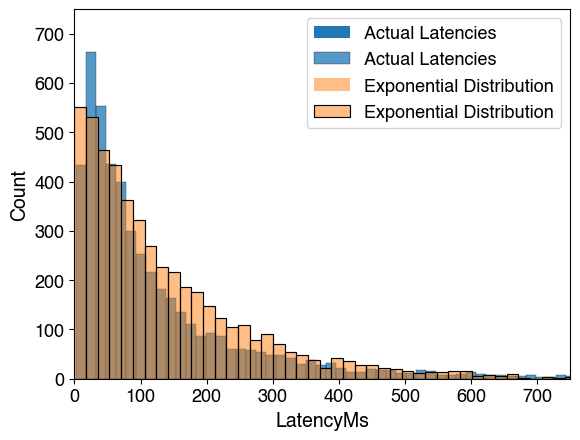

In [ ]:
sns.histplot(t, label="Actual Latencies") #, bins=50)
plt.xlim(0, 750)
plt.ylim(0, 750)
plt.legend()

#plot an exponential distribution with mean 140 as sns histogram
x = np.random.exponential(140, len(t))
sns.histplot(x, label="Exponential Distribution", alpha=0.5) #, bins=50)
plt.xlim(0, 750)
plt.ylim(0, 750)
plt.legend()

plt.show()

(0.0, 750.0)

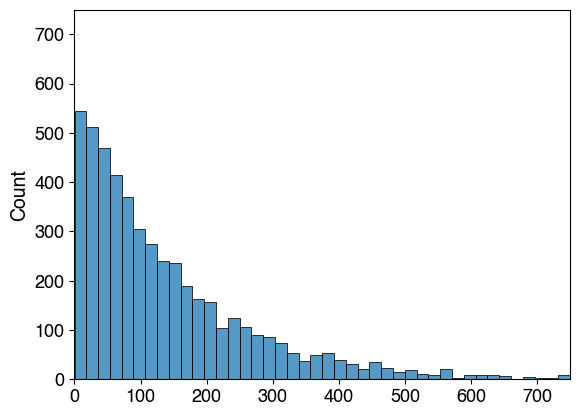

In [ ]:
#plot an exponential distribution with mean 140 as sns histogram
x = np.random.exponential(140, len(t))
sns.histplot(x) #, bins=50)
plt.xlim(0, 750)
plt.ylim(0, 750)

0 mplb_onlr
1 mplb_nlr_rlpb
2 mplb_nlr
3 mplb_md


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


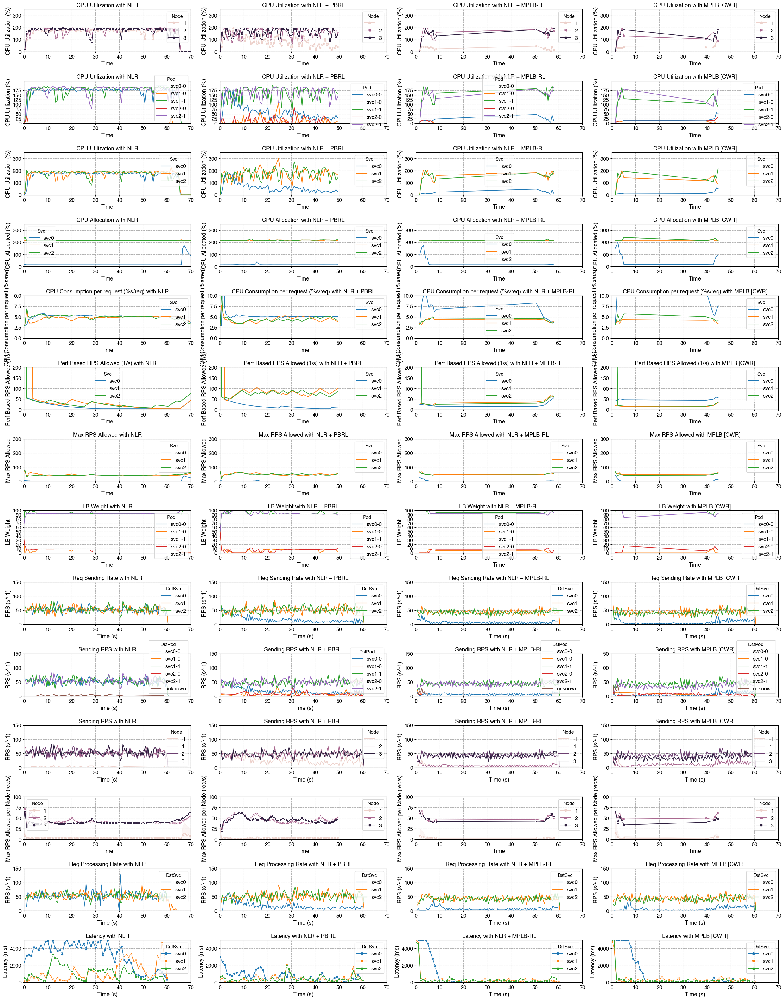

In [ ]:
# run, scale_factor, iteration, variation, variation_name, distr, proc_distr
plot_comparison([
    (2, 0.8, 1, "mplb_onlr", "NLR", "exponential", "exponential"),
    (2, 0.8, 1, "mplb_nlr_rlpb", "NLR + PBRL", "exponential", "exponential"),
    (2, 0.8, 1, "mplb_nlr", "NLR + MPLB-RL", "exponential", "exponential"),
    (2, 0.8, 1, "mplb_md", "MPLB [CWR]", "exponential", "exponential"),
    # (2, 0.7, 1, "mplb_lr++_rlpb", LB["mplb_lr++_rlpb"], "exponential", "exponential"),
    ])

In [ ]:
grep "Done Step 1:" log | awk '{print $(NF-1)}' | \
python3 -c "import sys; 
data=[float(x) for x in sys.stdin]; 
data.sort(); 
n=len(data); 
p99=data[int(0.99*n)-1] if n>0 else 0; 
print(f'Mean: {sum(data)/n:.3f} ms'); 
print(f'99th percentile: {p99:.3f} ms'); 
print(f'Max: {max(data):.3f} ms')"


In [ ]:

for svc in range(15):
    print(f"Service {svc}:")
    all_admitted_reqs_df = hit_df.loc[hit_df["LB"] == "mplb_onlr"].loc[hit_df["Run"] == 2].loc[hit_df["Iteration"] == 1].loc[hit_df["DstSvc"] == f"svc{svc}"].loc[hit_df["isAdmitted"] == True].copy()
    reqs_dropped = all_admitted_reqs_df.loc[all_admitted_reqs_df["isDropped"] == True]
    reqs_node1 = all_admitted_reqs_df.loc[all_admitted_reqs_df["Node"] == 1]
    reqs_node2 = all_admitted_reqs_df.loc[all_admitted_reqs_df["Node"] == svc+1]
    print("Dropped:", len(reqs_dropped))
    print("Node1:", len(reqs_node1))
    print(f"Node{svc+1}:", len(reqs_node2))
    print()

Service 0:
Dropped: 77
Node1: 3115
Node1: 3115

Service 1:
Dropped: 6
Node1: 3
Node2: 3231

Service 2:
Dropped: 2
Node1: 3
Node3: 3221

Service 3:
Dropped: 10
Node1: 3
Node4: 3327

Service 4:
Dropped: 0
Node1: 0
Node5: 3151

Service 5:
Dropped: 1
Node1: 1
Node6: 3247

Service 6:
Dropped: 0
Node1: 3
Node7: 3212

Service 7:
Dropped: 18
Node1: 15
Node8: 3294

Service 8:
Dropped: 0
Node1: 0
Node9: 3214

Service 9:
Dropped: 19
Node1: 24
Node10: 3286

Service 10:
Dropped: 0
Node1: 5
Node11: 3238

Service 11:
Dropped: 1
Node1: 2
Node12: 3264

Service 12:
Dropped: 2
Node1: 6
Node13: 3285

Service 13:
Dropped: 0
Node1: 3
Node14: 3116

Service 14:
Dropped: 0
Node1: 4
Node15: 3214



In [ ]:

for svc in range(15):
    print(f"Service {svc}:")
    all_admitted_reqs_df = hit_df.loc[hit_df["LB"] == "mplb_onlr"].loc[hit_df["Run"] == 2].loc[hit_df["Iteration"] == 1].loc[hit_df["DstSvc"] == f"svc{svc}"].loc[hit_df["isAdmitted"] == True].copy()
    reqs_dropped = all_admitted_reqs_df.loc[all_admitted_reqs_df["isDropped"] == True]
    reqs_node1 = all_admitted_reqs_df.loc[all_admitted_reqs_df["Node"] == 1]
    reqs_node2 = all_admitted_reqs_df.loc[all_admitted_reqs_df["Node"] == svc+1]
    print("Dropped:", len(reqs_dropped))
    print("Node1:", len(reqs_node1))
    print(f"Node{svc+1}:", len(reqs_node2))
    print()

Service 0:
Dropped: 77
Node1: 3115
Node1: 3115

Service 1:
Dropped: 6
Node1: 3
Node2: 3231

Service 2:
Dropped: 2
Node1: 3
Node3: 3221

Service 3:
Dropped: 10
Node1: 3
Node4: 3327

Service 4:
Dropped: 0
Node1: 0
Node5: 3151

Service 5:
Dropped: 1
Node1: 1
Node6: 3247

Service 6:
Dropped: 0
Node1: 3
Node7: 3212

Service 7:
Dropped: 18
Node1: 15
Node8: 3294

Service 8:
Dropped: 0
Node1: 0
Node9: 3214

Service 9:
Dropped: 19
Node1: 24
Node10: 3286

Service 10:
Dropped: 0
Node1: 5
Node11: 3238

Service 11:
Dropped: 1
Node1: 2
Node12: 3264

Service 12:
Dropped: 2
Node1: 6
Node13: 3285

Service 13:
Dropped: 0
Node1: 3
Node14: 3116

Service 14:
Dropped: 0
Node1: 4
Node15: 3214



0 mplb_nlr
1 mplb_nlr
2 mplb_nlr


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


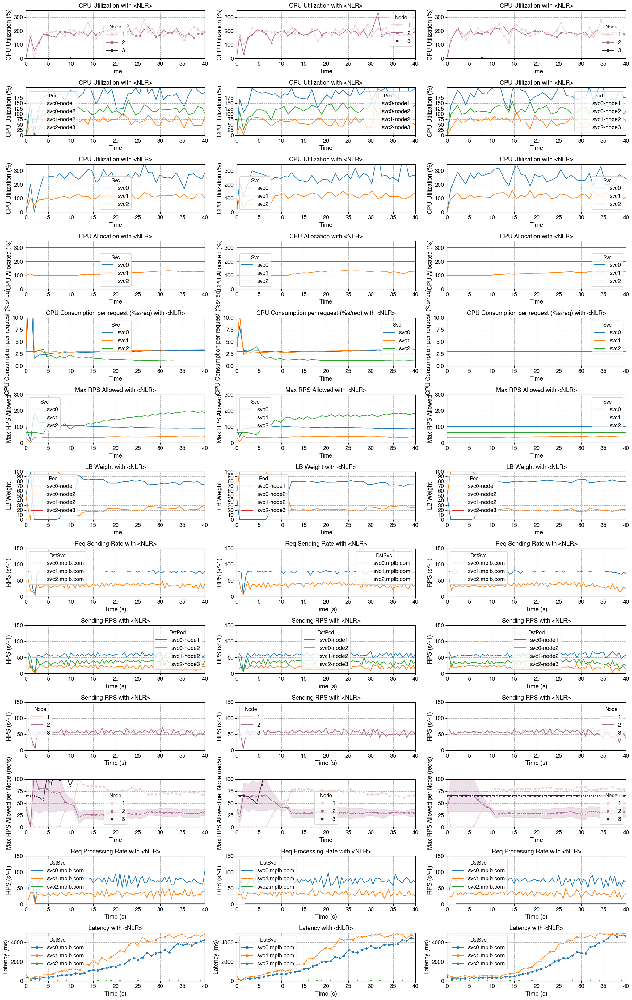

In [ ]:
iteration = 1
plot_comparison([
    (4, 0.8, 11, "mplb_nlr", LB["mplb_nlr"], "none", "none"),
    (4, 0.8, 12, "mplb_nlr", LB["mplb_nlr"], "none", "none"),
    (4, 0.8, 13, "mplb_nlr", LB["mplb_nlr"], "none", "none"),
    ])

In [ ]:
lightly_loaded_states = [84192, 48415, 70217, 55628, 6872, 46194, 17080, 15354, 18239]
high_load_states = [4610, 74759, 122890, 90122, 41100, 69903, 44944, 134551, 93335, 129050, 138139, 31901, 79906, 140196, 64422, 8619, 21677, 130484, 72380, 23740, 66752, 112326, 116683, 3278, 9296, 70096, 99668, 108637, 66915, 73572, 76518]
heavily_loaded_states = [4610, 74759, 122890, 90122, 41100, 69903, 44944, 134551, 93335, 129050, 138139, 31901, 79906, 140196, 64422, 8619, 21677, 130484, 72380, 23740, 66752, 112326, 116683, 3278, 9296, 70096, 99668, 108637, 66915, 73572, 76518]
infeasible_states = [177161, 172969, 150379, 90158, 173166, 167605, 80022, 164440, 80250, 30527]

In [ ]:
# Demand satisfied global: 80.00%
demand_satisfied_global = [4610, 74759, 90122, 41100, 69903, 44944, 31901, 48415, 79906, 64422, 8619, 21677, 17080, 23740, 18239, 70217, 116683, 55628, 3278, 9296, 70096, 99668, 6872, 108637, 84192, 66915, 73572, 76518, 46194, 15354]
# Demand satisfied local: 60.00%
demand_satisfied_local =  [4610, 74759, 90122, 41100, 69903, 44944, 31901, 48415, 79906, 64422, 8619, 21677, 17080, 23740, 18239, 70217, 116683, 55628, 3278, 9296, 70096, 99668, 6872, 108637, 84192, 66915, 73572, 76518, 46194, 15354]
# Demand satisfied both: 60.00%
demand_satisfied_both = [4610, 74759, 90122, 41100, 69903, 44944, 31901, 48415, 79906, 64422, 8619, 21677, 17080, 23740, 18239, 70217, 116683, 55628, 3278, 9296, 70096, 99668, 6872, 108637, 84192, 66915, 73572, 76518, 46194, 15354]
# Demand satisfied neither: 20.00%
demand_satisfied_neither = [177161, 172969, 150379, 90158, 173166, 167605, 80022, 164440, 80250, 30527]
# Demand satisfied only global: 20.00%
demand_satisfied_only_global = [66752, 140196, 112326, 122890, 130484, 134551, 93335, 129050, 138139, 72380]

In [ ]:
hit_df.loc[hit_df["isDropped"] == True].groupby("DstSvc")["isDropped"].count()

DstSvc
svc0    17849
svc1     8752
svc2    13728
Name: isDropped, dtype: int64

# Latency Comparison

In [ ]:
LB = {
    "mplb_lr": "LR--",
    "mplb_lr++": "LR",
    "mplb_lr_rl": "LR-- + AC",
    "mplb_lr++_rl": "MPLB-LR",
    "mplb_onlr": "MPLB-NLR--",
    "mplb_nlr": "MPLB-NLR",
    "mplb_md": "MPLB-CWR",
}
LB

{'mplb_lr': 'LR--',
 'mplb_lr++': 'LR',
 'mplb_lr_rl': 'LR-- + AC',
 'mplb_lr++_rl': 'MPLB-LR',
 'mplb_onlr': 'MPLB-NLR--',
 'mplb_nlr': 'MPLB-NLR',
 'mplb_md': 'MPLB-CWR'}

In [ ]:
imprv_df = hit_df.copy()
tmp_df = imprv_df.loc[imprv_df["Distribution"] == "exponential"].loc[imprv_df["in_experiment"] == True].loc[imprv_df["isDropped"] == False].loc[imprv_df["ProcessDistribution"] == "exponential"].loc[imprv_df["ScaleFactor"] == 0.8].copy() #.loc[imprv_df["State"].isin(high_load_states)].copy()
tmp_df = tmp_df[tmp_df["LB"].isin(LB.keys())]
tmp_df["lb"] = tmp_df["LB"]
tmp_df["LB"] = tmp_df["LB"].apply(lambda x: LB[x])
tmp_df

,ReqNum,DstSvc,DstPod,isDropped,StartTime,EndTime,Latency,LatencyMs,LB,Distribution,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment,lb
597358,1,svc0,svc0-0,False,0.028452,0.079005,0.050553,50.553355,LR,exponential,66752,0.8,1,1,exponential,True,mplb_lr++
597359,4,svc0,svc0-4,False,0.063655,0.112052,0.048397,48.397370,LR,exponential,66752,0.8,1,1,exponential,True,mplb_lr++
597360,2,svc0,svc0-1,False,0.032222,0.114828,0.082606,82.605926,LR,exponential,66752,0.8,1,1,exponential,True,mplb_lr++
597361,3,svc0,svc0-5,False,0.041052,0.119785,0.078734,78.733658,LR,exponential,66752,0.8,1,2,exponential,True,mplb_lr++
597362,5,svc0,svc0-7,False,0.087336,0.133348,0.046012,46.011857,LR,exponential,66752,0.8,1,2,exponential,True,mplb_lr++
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4188452,1945,svc2,svc2-1,False,29.734302,30.004850,0.270548,270.547859,MPLB-CWR,exponential,116683,0.8,3,2,exponential,True,mplb_md
4188453,1944,svc2,svc2-1,False,29.703161,30.005447,0.302287,302.286709,MPLB-CWR,exponential,116683,0.8,3,2,exponential,True,mplb_md
4188454,1960,svc2,svc2-3,False,29.926880,30.008177,0.081297,81.296654,MPLB-CWR,exponential,116683,0.8,3,3,exponential,True,mplb_md
4188455,1963,svc2,svc2-5,False,29.966601,30.024398,0.057797,57.796771,MPLB-CWR,exponential,116683,0.8,3,3,exponential,True,mplb_md


In [ ]:
mplb = "mplb_nlr"
lr = "mplb_lr++"
for load, states in zip(["Light", "Heavy", "Overloaded"], [lightly_loaded_states, heavily_loaded_states, infeasible_states]):
    print(f"{load} Load")
    t = tmp_df.loc[tmp_df["Run"].isin(states)].groupby("lb")
    for q in [.01, .25, .5, .75, .99]:
        Q = t.quantile(q, numeric_only=True)["LatencyMs"]
        print(f"{int(q*100)}p:", f"{(Q[mplb] - Q[lr]) / Q[lr] * 100 * -1:.1f}")
        print(Q[lr], Q[mplb])

Light Load
1p: 64.9
4.23073088 1.48550286
25p: 5.0
17.433032 16.559590999999998
50p: 9.8
37.317305 33.66409
75p: 13.6
73.946134 63.8990285
99p: 23.6
296.0467669999992 226.18745521999995
Heavy Load
1p: 66.8
4.37254209 1.45087422
25p: 14.8
22.02468025 18.77576925
50p: 20.7
51.8158685 41.087477
75p: 29.4
117.4842515 82.93545025
99p: 76.9
1876.6465277499994 433.01782073999993
Overloaded Load
1p: 76.2
5.88067189 1.39979176
25p: 41.8
90.233694 52.515666
50p: 42.8
357.2820285 204.342117
75p: 31.1
1344.1192845 926.217613
99p: 2.3
4719.074902 4609.333637800002


In [ ]:
n_rows = 2tmp_df.loc[tmp_df["Run"].isin(lightly_loaded_states)].groupby("LB").quantile(.50)["LatencyMs"]["LR++"]

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/2017603565.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp_df.loc[tmp_df["Run"].isin(lightly_loaded_states)].groupby("LB").quantile(.50)["LatencyMs"]["LR++"]


37.317305

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


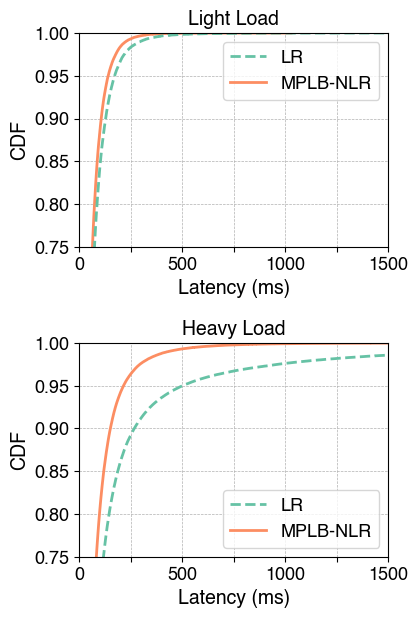

In [ ]:
line_styles = {
    "LR": "--",
    "MPLB-NLR": "-"
}
colors = {
    "LR": sns.color_palette("Set2").as_hex()[0],
    "MPLB-NLR": sns.color_palette("Set2").as_hex()[1]
}

n_rows = 2
_, axes = plt.subplots(n_rows, 1, figsize=(4, 3*n_rows))

# for i, load in enumerate(zip(["Light", "Heavy", "Overloaded"], [lightly_loaded_states, heavily_loaded_states, infeasible_states])):
for i, load in enumerate(zip(["Light", "Heavy"], [lightly_loaded_states, heavily_loaded_states])):
    load, states = load
    
    ax = axes[i]
    
    # plot cdf of latency improvement
    sns.ecdfplot(ax=ax, data=tmp_df.loc[tmp_df["Run"].isin(states)], x="LatencyMs", hue="LB",
                hue_order=["LR", "MPLB-NLR"],
                linewidth=2.0,
                palette=[colors["LR"], colors["MPLB-NLR"]])
    
    # Manually change line styles after plotting
    for line, lb in zip(ax.lines, ["MPLB-NLR", "LR"]):
        line.set_linestyle(line_styles[lb])
    
    # if load == "Heavy":
    ax.set_xlim(0, 1500)
    ax.set_ylim(0.75, 1)
    x_ticks = range(0, 1500+1, 250)
    ax.set_xticks(x_ticks)
    x_ticklabels = [""] * len(x_ticks)
    for i in range(0, 1500+1, 500):
        x_ticklabels[i // 250] = f"{i}"
    ax.set_xticklabels(x_ticklabels)
    #     pass
    # elif load == "Light":
    #     ax.set_xlim(0, 1500)
    #     ax.set_ylim(0.75, 1)
    #     pass
    if load == "Overleaded":
        ax.set_xlim(0, 2000)
        ax.set_ylim(0.4, 1)
        pass

    # Custom legend with styled lines
    handles = [
        matplotlib.lines.Line2D([0], [0], color=colors[lb], linestyle=line_styles[lb], linewidth=2.0, label=lb)
        for lb in ["LR", "MPLB-NLR"]
    ]
    ax.legend(handles=handles, title="")

    ax.set_ylabel("CDF")
    ax.set_xlabel("Latency (ms)")
    ax.set_title(f"{load} Load")

    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax.set_axisbelow(True)

plt.tight_layout(pad=0.05)
plt.subplots_adjust(hspace=0.45)
savefig(f"cdf_latency")

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/1129676043.py:4: UserWarning: The palette list has more values (8) than needed (5), which may not be intended.
  sns.ecdfplot(ax=ax, data=tmp_df.loc[tmp_df["Run"].isin(heavily_loaded_states)], x="LatencyMs", hue="LB",


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


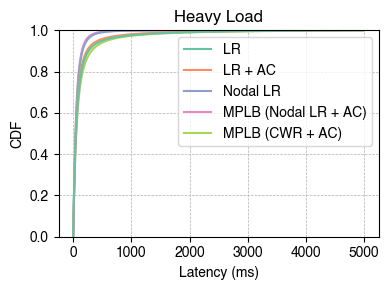

In [ ]:
4_, ax = plt.subplots(1, 1, figsize=(4, 3))

# plot cdf of latency improvement
sns.ecdfplot(ax=ax, data=tmp_df.loc[tmp_df["Run"].isin(heavily_loaded_states)], x="LatencyMs", hue="LB",
            hue_order=LB.values(),
             palette=sns.color_palette("Set2").as_hex())
# ax.set_xlim(-50, 3000)
# ax.set_ylim(0.6, 1)

# ax.set_xscale("log")

ax.legend_.set_title("")

ax.set_ylabel("CDF")
ax.set_xlabel("Latency (ms)")
ax.set_title("Heavy Load")

ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
savefig("cdf_latency_heavy")

In [ ]:
a = tmp_df.loc[tmp_df["Run"].isin(heavily_loaded_states)].groupby("LB").quantile(0.99)["LatencyMs"].sort_index().tolist()
for i in a:
    print(i)

2009.2028976400013
1601.69532036
1914.5007293599913
433.01782073999993
1957.7092166499936
1876.6465277499994
502.03155710000067


/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/1217886081.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  a = tmp_df.loc[tmp_df["Run"].isin(heavily_loaded_states)].groupby("LB").quantile(0.99)["LatencyMs"].sort_index().tolist()


In [ ]:
tmp_df.loc[tmp_df["Run"].isin(heavily_loaded_states)].groupby("LB").quantile(0.95)["LatencyMs"].sort_values()

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/280269049.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp_df.loc[tmp_df["Run"].isin(heavily_loaded_states)].groupby("LB").quantile(0.95)["LatencyMs"].sort_values()


LB
<NLR>     214.803749
NLR       236.650276
<LR++>    425.436409
LR++      501.809228
<LR>      511.558304
LR        531.073517
<CWR>     584.138036
Name: LatencyMs, dtype: float64

In [ ]:
tmp_df.loc[tmp_df["Run"].isin(heavily_loaded_states)].groupby("LB").quantile(0.99)["LatencyMs"].sort_values()

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/3044747931.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp_df.loc[tmp_df["Run"].isin(heavily_loaded_states)].groupby("LB").quantile(0.99)["LatencyMs"].sort_values()


LB
<NLR>      433.017821
NLR        502.031557
<LR++>    1601.695320
LR++      1876.646528
<LR>      1914.500729
LR        1957.709217
<CWR>     2009.202898
Name: LatencyMs, dtype: float64

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/2979533002.py:4: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  sns.ecdfplot(ax=ax, data=tmp_df.loc[tmp_df["Run"].isin(lightly_loaded_states)], x="LatencyMs", hue="LB",
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


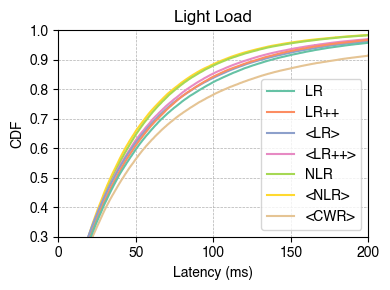

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(4, 3))

# plot cdf of latency improvement
sns.ecdfplot(ax=ax, data=tmp_df.loc[tmp_df["Run"].isin(lightly_loaded_states)], x="LatencyMs", hue="LB",
            hue_order=LB.values(),
             palette=sns.color_palette("Set2").as_hex())
plt.xlim(-0, 200)
ax.set_ylim(0.3, 1)

# # Define "exponential-looking" y-ticks between 0 and 1
# exp_ticks_raw = np.linspace(0, 1, 5)  # e.g., [0.00, 0.25, 0.5, 0.75, 1.0]
# exp_ticks = (np.exp(exp_ticks_raw) - 1) / (np.e - 1)  # normalize to [0,1]

# # Set ticks and labels using ax
# ax.set_yticks(exp_ticks)
# ax.set_yticklabels([f"$e^{{{x:.2f}}}$" for x in exp_ticks_raw])
ax.legend_.set_title("")

ax.set_title("Light Load")

ax.set_ylabel("CDF")
ax.set_xlabel("Latency (ms)")

ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
savefig("cdf_latency_light")

In [ ]:
tmp_df.loc[tmp_df["Run"].isin(lightly_loaded_states)].groupby("LB").quantile(0.95)["LatencyMs"].sort_values()

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/1197395623.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp_df.loc[tmp_df["Run"].isin(lightly_loaded_states)].groupby("LB").quantile(0.95)["LatencyMs"].sort_values()


LB
<NLR>     140.307705
NLR       143.474463
<LR++>    165.965364
LR++      171.851372
<LR>      177.714085
LR        187.003200
<CWR>     301.877713
Name: LatencyMs, dtype: float64

In [ ]:
tmp_df.loc[tmp_df["Run"].isin(lightly_loaded_states)].groupby("LB").quantile(0.99)["LatencyMs"].sort_values()

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/1036778384.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  tmp_df.loc[tmp_df["Run"].isin(lightly_loaded_states)].groupby("LB").quantile(0.99)["LatencyMs"].sort_values()


LB
<NLR>      226.187455
NLR        228.973969
<LR++>     279.314723
LR++       296.046767
<LR>       305.977996
LR         323.962691
<CWR>     1738.131128
Name: LatencyMs, dtype: float64

# Completion Throughput

In [ ]:
def get_throughput_df():
    
    throughput_df = pd.DataFrame()
    
    distr = "exponential"
    sf = 0.8
    
    for state in RUNS:
        
        for lb in LB.keys():
    
            for iteration in range(1, 3):
                
                df = merge_dfs_for_hue([
                    get_bin_df(get_iters(hit_df, lb, distr, distr, state, True, sf, (iteration, iteration)), "StartTime"),
                    get_bin_df(get_iters(hit_df.loc[hit_df["isDropped"] == False], lb, distr, distr, state, True, sf, (iteration, iteration)), "EndTime")
                ], ["StartTime", "EndTime"])
                
                df["LB"] = lb
                df["Distribution"] = distr
                df["ProcessDistribution"] = distr
                df["Run"] = state
                df["ScaleFactor"] = sf
                df["Iteration"] = iteration
                
                throughput_df = pd.concat([throughput_df, df], ignore_index=True)
            
    return throughput_df

throughput_df = get_throughput_df()

In [ ]:
throughput_df.to_csv("parse_sweep_throughput_df.csv")

In [ ]:
mplb = "mplb_nlr"
lr = "mplb_lr++"
for load, states in zip(["Light", "Heavy", "Overloaded"], [lightly_loaded_states, heavily_loaded_states, infeasible_states]):
    print(f"{load} Load")
    t = throughput_df.loc[throughput_df["Run"].isin(states)].groupby("LB")
    for q in [.01, .25, .5, .75, .99]:
        Q = t.quantile(q, numeric_only=True)["throughput"]
        print(f"{int(q*100)}p: {(Q[mplb] - Q[lr]) / Q[lr] * 100:.1f}%\t\tmplb:{Q[mplb]:.1f}\tlr:{Q[lr]:.1f}")

Light Load
1p: 0.0%		mplb:1.0	lr:1.0
25p: -5.9%		mplb:16.0	lr:17.0
50p: -3.1%		mplb:31.0	lr:32.0
75p: 0.0%		mplb:56.0	lr:56.0
99p: -0.2%		mplb:93.0	lr:93.2
Heavy Load
1p: 0.0%		mplb:1.0	lr:1.0
25p: 0.0%		mplb:22.0	lr:22.0
50p: 2.6%		mplb:40.0	lr:39.0
75p: 0.0%		mplb:65.0	lr:65.0
99p: -0.8%		mplb:131.0	lr:132.0
Overloaded Load
1p: 0.0%		mplb:1.0	lr:1.0
25p: 0.0%		mplb:15.0	lr:15.0
50p: 2.2%		mplb:46.0	lr:45.0
75p: 2.4%		mplb:85.0	lr:83.0
99p: 1.4%		mplb:140.0	lr:138.0


/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/3638130549.py:4: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  sns.ecdfplot(ax=ax, data=throughput_df.loc[throughput_df["Run"].isin(high_load_states)].loc[throughput_df["hue"] == "EndTime"], x="throughput", hue="LB",
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


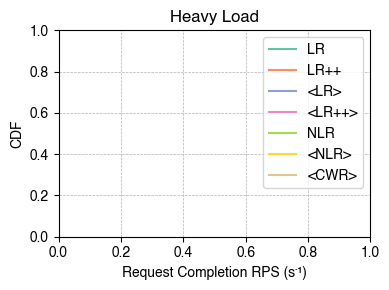

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(4, 3))

# plot cdf of latency improvement
sns.ecdfplot(ax=ax, data=throughput_df.loc[throughput_df["Run"].isin(high_load_states)].loc[throughput_df["hue"] == "EndTime"], x="throughput", hue="LB",
             hue_order=LB.values(),
             palette=sns.color_palette("Set2").as_hex())

# sns.ecdfplot(ax=ax, data=throughput_df.loc[throughput_df["Run"].isin(high_load_states)].loc[throughput_df["hue"] == "StartTime"], x="throughput", hue="LB",
#              hue_order=["MPLB w/ Nodal LR", "Least Request ++", "Least Request ++ [w/ AC]"],
#              palette=sns.color_palette("Set2").as_hex()[3:])
# ax.set_xlim(-50, 3000)
# ax.set_ylim(0.6, 1)

# ax.set_xscale("log")

ax.legend_.set_title("")

ax.set_title("Heavy Load")
ax.set_ylabel("CDF")
ax.set_xlabel("Request Completion RPS (s⁻¹)")
ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)
plt.tight_layout()

savefig("cdf_throughtput_heavy")

In [ ]:
line_styles = {
    "LR": "--",
    "MPLB-NLR": "-"
}
colors = {
    "LR": sns.color_palette("Set2").as_hex()[0],
    "MPLB-NLR": sns.color_palette("Set2").as_hex()[1]
}

n_rows = 2
_, axes = plt.subplots(n_rows, 1, figsize=(4, 3*n_rows))

# for i, load in enumerate(zip(["Light", "Heavy", "Overloaded"], [lightly_loaded_states, heavily_loaded_states, infeasible_states])):
for i, load in enumerate(zip(["Light", "Heavy"], [lightly_loaded_states, heavily_loaded_states])):
    load, states = load
    
    ax = axes[i]
    
    # plot cdf of latency improvement
    sns.ecdfplot(ax=ax, data=tmp_df.loc[tmp_df["Run"].isin(states)], x="LatencyMs", hue="LB",
                hue_order=["LR", "MPLB-NLR"],
                # style="LB",
                palette=[colors["LR"], colors["MPLB-NLR"]])
    
    # Manually change line styles after plotting
    for line, lb in zip(ax.lines, ["MPLB-NLR", "LR"]):
        line.set_linestyle(line_styles[lb])
    
    if load == "Heavy":
        ax.set_xlim(0, 1500)
        ax.set_ylim(0.75, 1)
        pass
    elif load == "Light":
        ax.set_xlim(0, 250)
        ax.set_ylim(0.4, 1)
        ax.set_xlim(0, 1500)
        ax.set_ylim(0.75, 1)
        pass
    elif load == "Overleaded":
        ax.set_xlim(0, 2000)
        ax.set_ylim(0.4, 1)
        pass

    # Custom legend with styled lines
    handles = [
        matplotlib.lines.Line2D([0], [0], color=colors[lb], linestyle=line_styles[lb], label=lb)
        for lb in ["LR", "MPLB-NLR"]
    ]
    ax.legend(handles=handles, title="")

    ax.set_ylabel("CDF")
    ax.set_xlabel("Latency (ms)")
    ax.set_title(f"{load} Load")

    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax.set_axisbelow(True)

plt.tight_layout()
savefig(f"cdf_latency")

In [ ]:
throughput_df["LoadBalancer"] = throughput_df["LB"].apply(lambda lb: LB[lb])

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


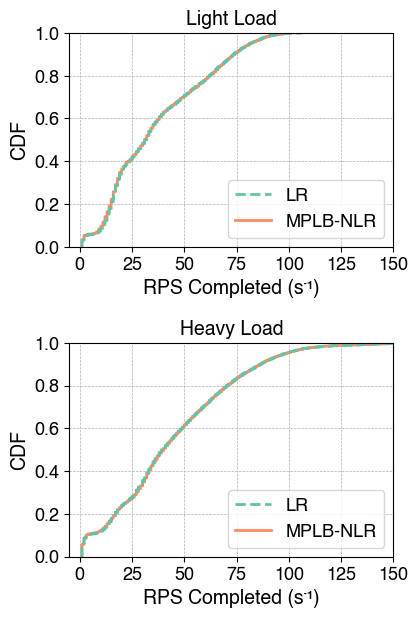

In [ ]:
line_styles = {
    "LR": "--",
    "MPLB-NLR": "-"
}
colors = {
    "LR": sns.color_palette("Set2").as_hex()[0],
    "MPLB-NLR": sns.color_palette("Set2").as_hex()[1]
}

n_rows = 2
_, axes = plt.subplots(n_rows, 1, figsize=(4, 3*n_rows))

# for i, load in enumerate(zip(["Light", "Heavy", "Overloaded"], [lightly_loaded_states, heavily_loaded_states, infeasible_states])):
for i, load in enumerate(zip(["Light", "Heavy"], [lightly_loaded_states, heavily_loaded_states])):
    load, states = load
    
    ax = axes[i]
    
    # plot cdf of latency improvement
    sns.ecdfplot(ax=ax, data=throughput_df.loc[throughput_df["Run"].isin(states)], x="LatencyMs", hue="LoadBalancer",
                hue_order=["LR", "MPLB-NLR"],
                linewidth=2.0,
                palette=[colors["LR"], colors["MPLB-NLR"]])
    
    # Manually change line styles after plotting
    for line, lb in zip(ax.lines, ["MPLB-NLR", "LR"]):
        line.set_linestyle(line_styles[lb])
    
    ax.set_xlim(0, 150)
    x_ticks = range(0, 150+1, 25)
    ax.set_xticks(x_ticks)
    x_ticklabels = [""] * len(x_ticks)
    for i in range(0, 150+1, 25):
        x_ticklabels[i // 25] = f"{i}"
    ax.set_xticklabels(x_ticklabels)
    
    if load == "Heavy":
        ax.set_xlim(-5, 150)
        # ax.set_ylim(0.75, 1)
        pass
    elif load == "Light":
        ax.set_xlim(-5, 150)
        # ax.set_ylim(0.4, 1)
        # ax.set_xlim(0, 1500)
        # ax.set_ylim(0.75, 1)
        pass
    elif load == "Overleaded":
        # ax.set_xlim(0, 2000)
        # ax.set_ylim(0.4, 1)
        pass

    # Custom legend with styled lines
    handles = [
        matplotlib.lines.Line2D([0], [0], color=colors[lb], linestyle=line_styles[lb], linewidth=2.0, label=lb)
        for lb in ["LR", "MPLB-NLR"]
    ]
    ax.legend(handles=handles, title="")

    # ax.set_xscale("log")

    ax.legend_.set_title("")

    ax.set_ylabel("CDF")
    ax.set_xlabel("RPS Completed (s⁻¹)")
    ax.set_title(f"{load} Load")

    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax.set_axisbelow(True)

plt.tight_layout(pad=0.05)
plt.subplots_adjust(hspace=0.45)
savefig(f"cdf_throughput")

In [ ]:
throughput_df.loc[throughput_df["Run"].isin(high_load_states)].loc[throughput_df["hue"] == "EndTime"].groupby("LB").quantile(0.95)["throughput"]

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/3844716962.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  throughput_df.loc[throughput_df["Run"].isin(high_load_states)].loc[throughput_df["hue"] == "EndTime"].groupby("LB").quantile(0.95)["throughput"]


LB
mplb_lr         96.0
mplb_lr++       98.0
mplb_lr++_rl    98.0
mplb_lr_rl      97.0
mplb_md         98.8
mplb_nlr        98.0
mplb_onlr       99.0
Name: throughput, dtype: float64

In [ ]:
for p in [.99]:
    print(p, "quantile")
    a = throughput_df.loc[throughput_df["Run"].isin(high_load_states)].loc[throughput_df["hue"] == "EndTime"].groupby("LB").quantile(p)["throughput"].sort_index().tolist()
    for i in a:
        print(i)

0.99 quantile
130.0
129.83999999999924
128.23999999999978
128.23999999999978
126.0
130.3800000000001
129.0


/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/4189775918.py:3: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  a = throughput_df.loc[throughput_df["Run"].isin(high_load_states)].loc[throughput_df["hue"] == "EndTime"].groupby("LB").quantile(p)["throughput"].sort_index().tolist()


/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/4020122398.py:4: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  sns.ecdfplot(ax=ax, data=throughput_df.loc[throughput_df["Run"].isin(lightly_loaded_states)].loc[throughput_df["hue"] == "EndTime"], x="throughput", hue="LB",
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


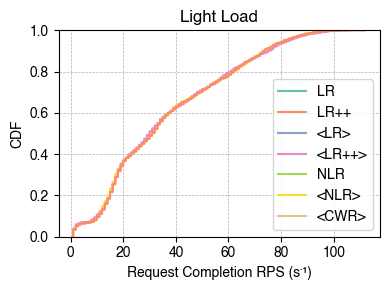

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(4, 3))

# plot cdf of latency improvement
sns.ecdfplot(ax=ax, data=throughput_df.loc[throughput_df["Run"].isin(lightly_loaded_states)].loc[throughput_df["hue"] == "EndTime"], x="throughput", hue="LB",
             hue_order=LB.values(),
             palette=sns.color_palette("Set2").as_hex())

# sns.ecdfplot(ax=ax, data=throughput_df.loc[throughput_df["Run"].isin(high_load_states)].loc[throughput_df["hue"] == "StartTime"], x="throughput", hue="LB",
#              hue_order=["MPLB w/ Nodal LR", "Least Request ++", "Least Request ++ [w/ AC]"],
#              palette=sns.color_palette("Set2").as_hex()[3:])
# ax.set_xlim(-50, 3000)
# ax.set_ylim(0.6, 1)

# ax.set_xscale("log")

ax.legend_.set_title("")

ax.set_title("Light Load")
ax.set_ylabel("CDF")
ax.set_xlabel("Request Completion RPS (s⁻¹)")

ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
savefig("cdf_throughtput_light")

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/793132894.py:4: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  sns.ecdfplot(ax=ax, data=throughput_df.loc[throughput_df["Run"].isin(lightly_loaded_states)].loc[throughput_df["hue"] == "EndTime"], x="throughput", hue="LB",
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


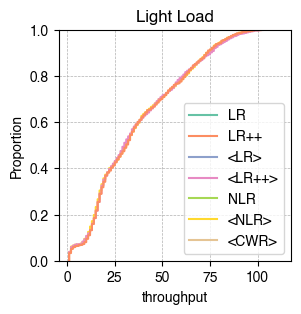

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(3, 3))

# plot cdf of latency improvement
sns.ecdfplot(ax=ax, data=throughput_df.loc[throughput_df["Run"].isin(lightly_loaded_states)].loc[throughput_df["hue"] == "EndTime"], x="throughput", hue="LB",
            hue_order=LB.values(),
             palette=sns.color_palette("Set2").as_hex())
# ax.set_xlim(-50, 3000)
# ax.set_ylim(0.6, 1)

# ax.set_xscale("log")

ax.legend_.set_title("")

ax.set_title("Light Load")

ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)

savefig("cdf_throughtput_light")

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/2257172525.py:4: UserWarning: The palette list has more values (8) than needed (7), which may not be intended.
  sns.ecdfplot(ax=ax, data=throughput_df.loc[throughput_df["Run"].isin(infeasible_states)].loc[throughput_df["hue"] == "EndTime"], x="throughput", hue="LB",
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


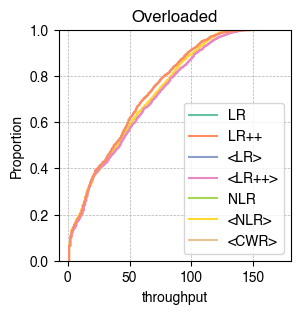

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(3, 3))

# plot cdf of latency improvement
sns.ecdfplot(ax=ax, data=throughput_df.loc[throughput_df["Run"].isin(infeasible_states)].loc[throughput_df["hue"] == "EndTime"], x="throughput", hue="LB",
            hue_order=LB.values(),
             palette=sns.color_palette("Set2").as_hex())
# ax.set_xlim(-50, 3000)
# ax.set_ylim(0.6, 1)

# ax.set_xscale("log")

ax.legend_.set_title("")

ax.set_title("Overloaded")

ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)

savefig("cdf_throughtput_infeasible")

In [ ]:
throughput_df

,Run,DstSvc,discrete_time,ReqNum,DstPod,isDropped,StartTime,EndTime,Latency,LatencyMs,LB,Distribution,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment,throughput,hue
0,66752,svc0,1,61,61,61,61,61,61,61,mplb_lr,exponential,0.8,1,61,exponential,61,61.0,StartTime
1,66752,svc0,2,63,63,63,63,63,63,63,mplb_lr,exponential,0.8,1,63,exponential,63,63.0,StartTime
2,66752,svc0,3,82,82,82,82,82,82,82,mplb_lr,exponential,0.8,1,82,exponential,82,82.0,StartTime
3,66752,svc0,4,62,62,62,62,62,62,62,mplb_lr,exponential,0.8,1,62,exponential,62,62.0,StartTime
4,66752,svc0,5,52,52,52,52,52,52,52,mplb_lr,exponential,0.8,1,52,exponential,52,52.0,StartTime
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
122814,116683,svc2,27,54,54,54,54,54,54,54,mplb_md,exponential,0.8,2,54,exponential,54,54.0,EndTime
122815,116683,svc2,28,60,60,60,60,60,60,60,mplb_md,exponential,0.8,2,60,exponential,60,60.0,EndTime
122816,116683,svc2,29,70,70,70,70,70,70,70,mplb_md,exponential,0.8,2,70,exponential,70,70.0,EndTime
122817,116683,svc2,30,80,80,80,80,80,80,80,mplb_md,exponential,0.8,2,80,exponential,80,80.0,EndTime


In [ ]:
LB_acronyms = {v: k for k, v in LB.items()}
LB_acronyms
throughput_df["lb"] = throughput_df["LB"].apply(lambda x: LB_acronyms[x])
throughput_df

KeyError: 'mplb_lr'

In [ ]:
LB

{'mplb_lr': 'LR',
 'mplb_lr++': 'LR++',
 'mplb_lr_rl': '<LR>',
 'mplb_lr++_rl': '<LR++>',
 'mplb_onlr': 'NLR',
 'mplb_nlr': '<NLR>',
 'mplb_md': '<CWR>'}

# Improvement

In [ ]:
def get_drop_counts(lb_df):
    tmp_df = lb_df.loc[lb_df["isDropped"] == True].copy()
    drop_counts = np.array([0, 0, 0])
    for svc in range(3):
        drop_counts[svc] = len(tmp_df.loc[tmp_df["DstSvc"] == f"svc{svc}"])
    return drop_counts

def get_improvement(df, t_df, lb1, lb2):
    
    lb1_drops = get_drop_counts(df.loc[df["LB"] == lb1])
    lb2_drops = get_drop_counts(df.loc[df["LB"] == lb2])
    drop_rate_improvement_each_dstsvc = ((lb1_drops - lb2_drops) / lb1_drops) * 100
    drop_rate_improvement_each_dstsvc = np.nan_to_num(drop_rate_improvement_each_dstsvc, nan=0.0, posinf=100, neginf=-100)
    # print(f"LR: {lb1_drops}, MPLB: {lb2_drops}; Drops Prevented: {drop_rate_improvement_each_dstsvc}")
    drop_rate_improvement_max = drop_rate_improvement_each_dstsvc.max()
    drop_rate_improvement_min = drop_rate_improvement_each_dstsvc.min()
    
    df["LatencyMs_normalized"] = (
        df["LatencyMs"] - df["LatencyMs"].min()
    ) / (
        df["LatencyMs"].max() - df["LatencyMs"].min()
    )
    lb1_df = df.loc[df["LB"] == lb1].loc[df["isDropped"] == False].copy()
    lb2_df = df.loc[df["LB"] == lb2].loc[df["isDropped"] == False].copy()
    
    latency_improvement_mean_each_dstsvc = (lb1_df.groupby("DstSvc")["LatencyMs"].mean() - lb2_df.groupby("DstSvc")["LatencyMs"].mean()) / lb2_df.groupby("DstSvc")["LatencyMs"].mean() * 100
    latency_improvement_mean_max = latency_improvement_mean_each_dstsvc.max()
    latency_improvement_mean_min = latency_improvement_mean_each_dstsvc.min()
    latency_improvement_mean_each_dstsvc_abs = (lb1_df.groupby("DstSvc")["LatencyMs_normalized"].mean() - lb2_df.groupby("DstSvc")["LatencyMs_normalized"].mean())
    latency_improvement_mean_max_abs = latency_improvement_mean_each_dstsvc_abs.max()
    latency_improvement_mean_min_abs = latency_improvement_mean_each_dstsvc_abs.min()
    latency_improvement_median_each_dstsvc = (lb1_df.groupby("DstSvc")["LatencyMs"].median() - lb2_df.groupby("DstSvc")["LatencyMs"].median()) / lb2_df.groupby("DstSvc")["LatencyMs"].median() * 100
    latency_improvement_median_max = latency_improvement_median_each_dstsvc.max()
    latency_improvement_median_min = latency_improvement_median_each_dstsvc.min()
    
    latency_improvement_tail_each_dstsvc = (lb1_df.groupby(["Iteration", "DstSvc"])[["LatencyMs"]].quantile(0.99).reset_index().groupby("DstSvc")["LatencyMs"].mean() - lb2_df.groupby(["Iteration", "DstSvc"])[["LatencyMs"]].quantile(0.99).reset_index().groupby("DstSvc")["LatencyMs"].mean()) / lb2_df.groupby(["Iteration", "DstSvc"])[["LatencyMs"]].quantile(0.99).reset_index().groupby("DstSvc")["LatencyMs"].mean() * 100
    latency_improvement_tail_max = latency_improvement_tail_each_dstsvc.max()
    latency_improvement_tail_min = latency_improvement_tail_each_dstsvc.min()
    latency_improvement_tail_each_dstsvc_abs = (lb1_df.groupby(["Iteration", "DstSvc"])[["LatencyMs_normalized"]].quantile(0.99).reset_index().groupby("DstSvc")["LatencyMs_normalized"].mean() - lb2_df.groupby(["Iteration", "DstSvc"])[["LatencyMs_normalized"]].quantile(0.99).reset_index().groupby("DstSvc")["LatencyMs_normalized"].mean())
    latency_improvement_tail_max_abs = latency_improvement_tail_each_dstsvc_abs.max()
    latency_improvement_tail_min_abs = latency_improvement_tail_each_dstsvc_abs.min()
    
    t_df["throughput_normalized"] = (
        t_df["throughput"] - t_df["throughput"].min()
    ) / (
        t_df["throughput"].max() - t_df["throughput"].min()
    )
    lb1_t = t_df.loc[t_df["LB"] == lb1]
    lb2_t = t_df.loc[t_df["LB"] == lb2]
    lb1_t
    throughput_improvement_mean_each_dstsvc = (lb2_t.groupby("DstSvc")["throughput_normalized"].mean() - lb1_t.groupby("DstSvc")["throughput_normalized"].mean()) # / lb1_t.groupby("DstSvc")["throughput"].mean() * 100
    # display(lb1_t.groupby("DstSvc")["throughput_normalized"].mean())
    # display(lb2_t.groupby("DstSvc")["throughput_normalized"].mean())
    throughput_improvement_mean_max = throughput_improvement_mean_each_dstsvc.max()
    throughput_improvement_mean_min = throughput_improvement_mean_each_dstsvc.min()
    
    run = df["Run"].iloc[0]
    load_category = "Infeasible"
    if run in high_load_states:
        load_category = "High"
    elif run in lightly_loaded_states:
        load_category = "Light"
        
    demand_satisfied = "neither"
    if run in demand_satisfied_only_global:
        demand_satisfied = "only_global"
    elif run in demand_satisfied_both:
        demand_satisfied = "both"
    
    improvement_df = pd.DataFrame([{
        "Distribution": df["Distribution"].iloc[0],
        "ProcessDistribution": df["ProcessDistribution"].iloc[0],
        "Run": df["Run"].iloc[0],
        "ScaleFactor": df["ScaleFactor"].iloc[0],
        "Iteration": df["Iteration"].iloc[0],
        "LB": lb2,
        "Latency_mean_max": latency_improvement_mean_max,
        "Latency_mean_min": latency_improvement_mean_min,
        "Latency_median_max": latency_improvement_median_max,
        "Latency_median_min": latency_improvement_median_min,
        "Latency_tail_max": latency_improvement_tail_max,
        "Latency_tail_min": latency_improvement_tail_min,
        "Latency_mean_max_abs": latency_improvement_mean_max_abs,
        "Latency_mean_min_abs": latency_improvement_mean_min_abs,
        "Latency_tail_max_abs": latency_improvement_tail_max_abs,
        "Latency_tail_min_abs": latency_improvement_tail_min_abs,
        "CompletionThroughput_mean_max": throughput_improvement_mean_max,
        "CompletionThroughput_mean_min": throughput_improvement_mean_min,
        "LoadCategory": load_category,
        "DemandSatisfied": demand_satisfied,
        "DropsPrevented_max": drop_rate_improvement_max,
        "DropsPrevented_min": drop_rate_improvement_min,
    }])
    
    improvements_df = pd.DataFrame()
    for dst_svc, mean in latency_improvement_mean_each_dstsvc.to_dict().items():
        improvements_df = pd.concat([improvements_df, pd.DataFrame([{
            "Distribution": df["Distribution"].iloc[0],
            "ProcessDistribution": df["ProcessDistribution"].iloc[0],
            "Run": df["Run"].iloc[0],
            "ScaleFactor": df["ScaleFactor"].iloc[0],
            "Iteration": df["Iteration"].iloc[0],
            "LB": lb2,
            "DstSvc": dst_svc,
            "Latency_mean": mean,
            "Latency_median": latency_improvement_median_each_dstsvc.to_dict()[dst_svc],
            "Latency_mean_abs": latency_improvement_mean_each_dstsvc_abs.to_dict()[dst_svc],
            "Latency_tail": latency_improvement_tail_each_dstsvc.to_dict()[dst_svc],
            "Latency_tail_abs": latency_improvement_tail_each_dstsvc_abs.to_dict()[dst_svc],
            "CompletionThroughput_mean": throughput_improvement_mean_each_dstsvc.to_dict()[dst_svc],
            "LoadCategory": load_category,
            "DemandSatisfied": demand_satisfied,
            "DropsPrevented_max": drop_rate_improvement_max,
            "DropsPrevented_min": drop_rate_improvement_min,
        }])])
    
    return improvement_df, improvements_df

improvement_df = pd.DataFrame()
improvements_df = pd.DataFrame()

for distr, proc_distr in [("exponential", "exponential")]:
    for run in RUNS:
        # for iteration in ITERATIONS:
        
        # in experiment, isDropped?
        
        tmp_df = hit_df.loc[hit_df["in_experiment"] == True]\
        .loc[hit_df["ProcessDistribution"] == proc_distr]\
            .loc[hit_df["Distribution"] == distr]\
                .loc[hit_df["Run"] == run]\
                    .loc[hit_df["ScaleFactor"] == 0.8].copy() #\
                        # .loc[req_df["Iteration"] == iteration].copy()
        
        tmp_throughput_df = throughput_df.loc[throughput_df["hue"] == "EndTime"]\
            .loc[throughput_df["ProcessDistribution"] == proc_distr]\
            .loc[throughput_df["Distribution"] == distr]\
            .loc[throughput_df["Run"] == run]\
            .loc[throughput_df["ScaleFactor"] == 0.8].copy()
                    
        for lb in ["mplb_nlr"]:
            _improvement_df, _improvements_df = get_improvement(tmp_df, tmp_throughput_df, "mplb_lr++", lb)
            improvement_df = pd.concat([improvement_df, _improvement_df], ignore_index=True)
            improvements_df = pd.concat([improvements_df, _improvements_df], ignore_index=True)
        
improvement_df

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/441451486.py:12: RuntimeWarning: invalid value encountered in divide
  drop_rate_improvement_each_dstsvc = ((lb1_drops - lb2_drops) / lb1_drops) * 100
/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/441451486.py:12: RuntimeWarning: invalid value encountered in divide
  drop_rate_improvement_each_dstsvc = ((lb1_drops - lb2_drops) / lb1_drops) * 100
/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/441451486.py:12: RuntimeWarning: invalid value encountered in divide
  drop_rate_improvement_each_dstsvc = ((lb1_drops - lb2_drops) / lb1_drops) * 100
/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/441451486.py:12: RuntimeWarning: invalid value encountered in divide
  drop_rate_improvement_each_dstsvc = ((lb1_drops - lb2_drops) / lb1_drops) * 100
/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/441451486.py:12: RuntimeWarning: invalid value encountered in divide
  

,Distribution,ProcessDistribution,Run,ScaleFactor,Iteration,LB,Latency_mean_max,Latency_mean_min,Latency_median_max,Latency_median_min,...,Latency_mean_max_abs,Latency_mean_min_abs,Latency_tail_max_abs,Latency_tail_min_abs,CompletionThroughput_mean_max,CompletionThroughput_mean_min,LoadCategory,DemandSatisfied,DropsPrevented_max,DropsPrevented_min
0,exponential,exponential,66752,0.8,1,mplb_nlr,175.931947,-0.841211,104.002542,-1.824443,...,0.027100,-0.000086,0.197791,-0.000795,0.014165,0.006780,High,only_global,0.000000,0.000000
1,exponential,exponential,73572,0.8,1,mplb_nlr,25.337207,7.881326,18.812944,11.219722,...,0.011596,0.003397,0.065482,0.004967,0.014860,-0.018149,High,both,0.000000,0.000000
2,exponential,exponential,41100,0.8,1,mplb_nlr,155.847953,13.318332,87.524865,7.393598,...,0.017308,0.000277,0.144905,0.000517,0.081159,-0.000206,High,both,0.000000,0.000000
3,exponential,exponential,30527,0.8,1,mplb_nlr,25.830575,-11.048919,50.922046,-9.548659,...,0.075897,-0.000181,0.016052,0.000582,0.023166,-0.001373,Infeasible,neither,11.073516,0.000000
4,exponential,exponential,23740,0.8,1,mplb_nlr,15.064231,-3.871189,10.553167,2.264157,...,0.001219,-0.000069,0.008252,-0.000177,0.002310,-0.005778,High,both,0.000000,0.000000
5,exponential,exponential,3278,0.8,1,mplb_nlr,18.086560,-1.333492,8.036089,-7.933675,...,0.001505,-0.000030,0.011697,0.000834,0.001341,-0.007259,High,both,0.000000,0.000000
6,exponential,exponential,72380,0.8,1,mplb_nlr,893.808232,10.528730,1069.774049,7.094280,...,0.236344,0.000939,0.788304,0.008900,0.178468,-0.001403,High,only_global,100.000000,0.000000
7,exponential,exponential,55628,0.8,1,mplb_nlr,16.760644,-9.936345,9.817349,-6.425189,...,0.003087,-0.000291,0.031868,-0.001521,0.021796,-0.000556,Light,both,0.000000,0.000000
8,exponential,exponential,173166,0.8,1,mplb_nlr,95.613632,-21.803746,233.372275,-9.149110,...,0.185486,-0.004956,0.060041,-0.053558,0.043197,0.022597,Infeasible,neither,26.725404,0.000000
9,exponential,exponential,46194,0.8,1,mplb_nlr,18.639614,5.992834,15.374264,5.168447,...,0.011093,0.003824,0.080131,0.017681,-0.003979,-0.011961,Light,both,0.000000,0.000000


exponential exponential
#4c72b0
exponential exponential
#4c72b0
exponential exponential
#c44e52
exponential exponential
#c44e52


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


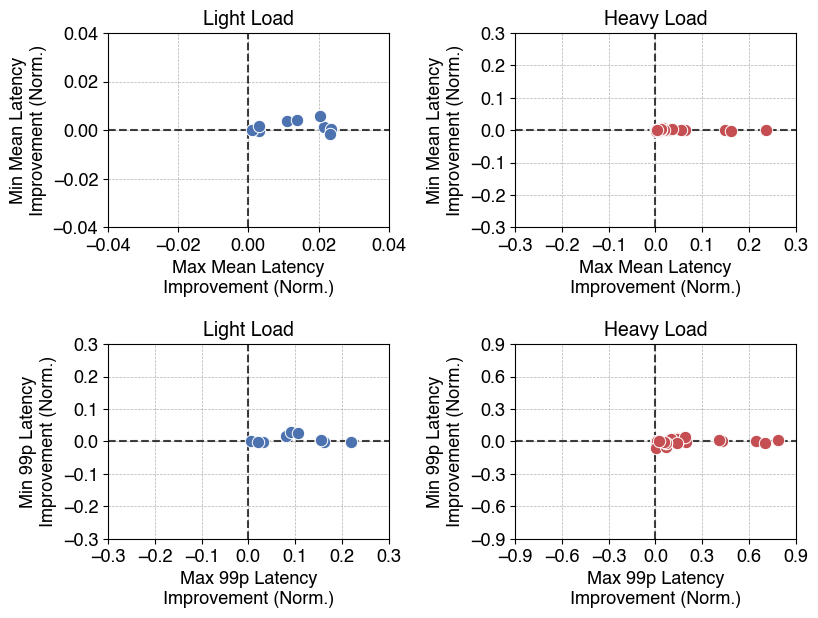

In [ ]:
def get_distr(d):
    if d == "none":
        return "Uniform"
    return "Exponential"

def plot(imprv_df, ax, distr, proc_distr, scale_factor, load_category, q="tail"):
    
    print(proc_distr, distr)
    
    tmp_df = imprv_df.loc[imprv_df["Distribution"] == distr].loc[imprv_df["ProcessDistribution"] == proc_distr].loc[imprv_df["ScaleFactor"] == scale_factor].loc[imprv_df["LoadCategory"] == load_category].copy()
    
    # plot line x = 0
    ax.axvline(x=0, color='black', linestyle='--', zorder=1, alpha=0.75) # plot line x = 0
    # plot line y = 0
    ax.axhline(y=0, color='black', linestyle='--', zorder=1, alpha=0.75) # plot line y = 0

    color = sns.color_palette("deep").as_hex()[3] if load_category == "High" else sns.color_palette("deep").as_hex()[0]
    print(color)

    sns.scatterplot(ax=ax, data=tmp_df.loc[tmp_df["LB"] == "mplb_nlr"], x=f"Latency_{q}_max_abs", y=f"Latency_{q}_min_abs",
                    s=80, label="Nodal Least Request", zorder=2, color=color)
    # sns.scatterplot(ax=axes[1], data=tmp_df.loc[tmp_df["LB"] == "mplb_lawr"], x="Latency_mean_max", y="Latency_mean_min", color=sns.color_palette("Set2").as_hex()[1], label="Locality-Aware Weighted Random")
    
    q_label = "99p" if q == "tail" else "Mean"
    ax.set_xlabel(f"Max {q_label} Latency\nImprovement (Norm.)", fontsize=13)
    ax.set_ylabel(f"Min {q_label} Latency\nImprovement (Norm.)", fontsize=13)

    ax.set_title(f"Heavy Load" if load_category == "High" else f"Light Load")

    if q == "tail":
        # ax.set_title("")
        if load_category == "Light":
            ax.set_xlim(-0.30, 0.30)
            ax.set_ylim(-0.30, 0.30)
            pass
            ax.set_yticks(np.arange(-0.3, 0.31, 0.1), fontsize=10)
            ax.set_xticks(np.arange(-0.3, 0.31, 0.1), fontsize=10)
            
        
        else:
            ax.set_xlim(-0.9, 0.9)
            ax.set_ylim(-0.9, 0.9)
            pass
            ax.set_xticks(np.arange(-0.9, 0.91, 0.3), fontsize=10)
            ax.set_yticks(np.arange(-0.9, 0.91, 0.3), fontsize=10)
    if q == "mean":
        if load_category == "Light":
            ax.set_xlim(-0.040, 0.040)
            ax.set_ylim(-0.040, 0.040)
            pass
            ax.set_yticks(np.arange(-0.04, 0.041, 0.02), fontsize=10)
            ax.set_xticks(np.arange(-0.04, 0.041, 0.02), fontsize=10)
        
        else:
            ax.set_xlim(-0.30, 0.30)
            ax.set_ylim(-0.30, 0.30)
            pass
            ax.set_yticks(np.arange(-0.3, 0.31, 0.1), fontsize=10)
            ax.set_xticks(np.arange(-0.3, 0.31, 0.1), fontsize=10)

    ax.grid(True, which='both', linestyle='--', linewidth=0.5) #, alpha=0.5)
    ax.set_axisbelow(True)
    ax.legend_.remove()
        


distr, proc_distr = ("exponential", "exponential")


_, axes = plt.subplots(2, 2, figsize=(8, 6))

for i, load_category in enumerate(["Light", "High"]):
    for j, q in enumerate(["mean", "tail"]):
        plot(improvement_df, axes[j][i], distr, proc_distr, 0.8, load_category, q)

plt.tight_layout(pad=0.05)
plt.subplots_adjust(wspace=0.45)
plt.subplots_adjust(hspace=0.6)
savefig(f"max_vs_min_latency_improvement")

In [ ]:
sns.color_palette("deep").as_hex()[3]

'#c44e52'

In [ ]:

sns.color_palette("Set2")

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235),
 (1.0, 0.8509803921568627, 0.1843137254901961),
 (0.8980392156862745, 0.7686274509803922, 0.5803921568627451),
 (0.7019607843137254, 0.7019607843137254, 0.7019607843137254)]

1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


exponential exponential
exponential exponential


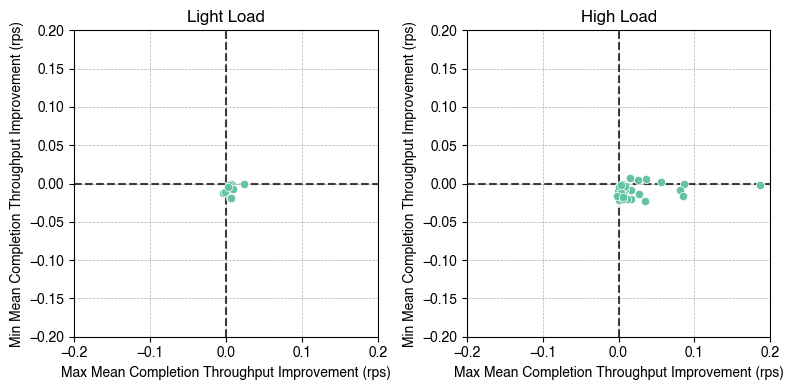

In [ ]:
def get_distr(d):
    if d == "none":
        return "Uniform"
    return "Exponential"

def plot(imprv_df, ax, distr, proc_distr, scale_factor, load_category):
    
    print(proc_distr, distr)
    
    tmp_df = imprv_df.loc[imprv_df["Distribution"] == distr].loc[imprv_df["ProcessDistribution"] == proc_distr].loc[imprv_df["ScaleFactor"] == scale_factor].loc[imprv_df["LoadCategory"] == load_category].copy()    
    
    # plot line x = 0
    ax.axvline(x=0, color='black', linestyle='--', zorder=1, alpha=0.75) # plot line x = 0
    # plot line y = 0
    ax.axhline(y=0, color='black', linestyle='--', zorder=1, alpha=0.75) # plot line y = 0

    sns.scatterplot(ax=ax, data=tmp_df.loc[tmp_df["LB"] == "mplb_nlr"], x="CompletionThroughput_mean_max", y="CompletionThroughput_mean_min", color=sns.color_palette("Set2").as_hex()[0], label="Nodal Least Request", zorder=2)
    # sns.scatterplot(ax=axes[1], data=tmp_df.loc[tmp_df["LB"] == "mplb_lawr"], x="Latency_mean_max", y="Latency_mean_min", color=sns.color_palette("Set2").as_hex()[1], label="Locality-Aware Weighted Random")
    
    ax.set_xlabel("Max Mean Completion Throughput Improvement (rps)")
    ax.set_ylabel("Min Mean Completion Throughput Improvement (rps)")

    if load_category == "Light":
        ax.set_xlim(-0.2, 0.2)
        ax.set_ylim(-0.2, 0.2)

        ax.set_title(f"{load_category} Load")
        # ax.set_xticks(np.arange(-15, 15+1, 5))
        # ax.set_yticks(np.arange(-15, 15+1, 5))
    
    else:
        ax.set_xlim(-0.2, 0.2)
        ax.set_ylim(-0.2, 0.2)

        ax.set_title(f"{load_category} Load")
        # ax.set_xticks(np.arange(-15, 15+1, 5))
        # ax.set_yticks(np.arange(-15, 15+1, 5))

    # ax.set_xscale("log")

    # add a text annotation for the point with the highest max latency improvement
    # max_lat_impr = imprv_df["latency (max)"].idxmax()
    # plt.text(10, 60, f"Run {imprv_df['run'][max_lat_impr]}")

    ax.grid(True, which='both', linestyle='--', linewidth=0.5) #, alpha=0.5)
    ax.set_axisbelow(True)
    ax.legend_.remove()
        
_, axes = plt.subplots(1, 2, figsize=(8, 4))

distr, proc_distr = ("exponential", "exponential")

i = 0
for load_category in ["Light", "High"]:
    plot(improvement_df, axes[i], distr, proc_distr, 0.8, load_category)
    i += 1

plt.tight_layout()
savefig("max_vs_min_normalized_throughput_improvement")

# Fairness

# Node Utilization Balance

In [ ]:
cpu_df

,Svc,AppNum,Pod,Time,CPUUtil,LB,Distribution,LBWeight,CPUConsumptionPerReq,CPUAllocated,MaxRPSAllowed,Run,ScaleFactor,Iteration,Node,ProcessDistribution,in_experiment
0,hostagent-node0,0,hostagent-node0-node0,-3.641588,0.523806,mplb_nlr,exponential,0.000000,0.000000,0.0,0,66752,0.8,1,0,exponential,False
1,hostagent-node1,1,hostagent-node1-node1,-3.641588,1.935394,mplb_nlr,exponential,0.000000,0.000000,0.0,0,66752,0.8,1,1,exponential,False
2,hostagent-node2,2,hostagent-node2-node2,-3.641588,1.843379,mplb_nlr,exponential,0.000000,0.000000,0.0,0,66752,0.8,1,2,exponential,False
3,hostagent-node3,3,hostagent-node3-node3,-3.641588,1.749515,mplb_nlr,exponential,0.000000,0.000000,0.0,0,66752,0.8,1,3,exponential,False
4,hostagent-node4,4,hostagent-node4-node4,-3.641588,1.237476,mplb_nlr,exponential,0.000000,0.000000,0.0,0,66752,0.8,1,4,exponential,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
547955,svc2,2,svc2-node2,40.340367,0.746501,mplb_lr++_rl,exponential,16.666667,2.334552,0.0,0,116683,0.8,3,2,exponential,False
547956,svc2,2,svc2-node3,40.340367,0.484299,mplb_lr++_rl,exponential,16.666667,2.334552,0.0,0,116683,0.8,3,3,exponential,False
547957,svc2,2,svc2-node3,40.340367,0.417325,mplb_lr++_rl,exponential,16.666667,2.334552,0.0,0,116683,0.8,3,3,exponential,False
547958,svc2,2,svc2-node3,40.340367,0.532155,mplb_lr++_rl,exponential,16.666667,2.334552,0.0,0,116683,0.8,3,3,exponential,False


In [ ]:
# get a df with mean cpu utilization for each node grouped over lb, distr, process_distr, run, iteration, sf, node
# before that get node_cpu_df with all the above but summed and grouped over time too
# in_experiment == True 

node_cpu_df = cpu_df.loc[cpu_df["in_experiment"] == True].loc[cpu_df["Svc"].str.contains("svc")].groupby(["ScaleFactor", "LB", "Distribution", "ProcessDistribution", "Run", "Iteration", "Node", "Time"]).sum(numeric_only=True).reset_index()
node_cpu_df = node_cpu_df.loc[(node_cpu_df["Node"] >= 1) & (node_cpu_df["Node"] <= 3)]

In [ ]:
node_mean_cpu_df = node_cpu_df.groupby(["ScaleFactor", "LB", "Distribution", "ProcessDistribution", "Run", "Node"]).mean(numeric_only=True).reset_index()
node_mean_cpu_df

,ScaleFactor,LB,Distribution,ProcessDistribution,Run,Node,Iteration,Time,AppNum,CPUUtil,LBWeight,CPUConsumptionPerReq,CPUAllocated,MaxRPSAllowed,in_experiment
0,0.8,mplb_lr,exponential,exponential,3278,1,2.014599,15.351372,3.0,131.976721,61.981949,14.809207,482.259005,169.656934,5.0
1,0.8,mplb_lr,exponential,exponential,3278,2,2.014599,15.351372,5.0,101.469509,107.613120,15.473196,347.905757,123.773723,5.0
2,0.8,mplb_lr,exponential,exponential,3278,3,2.014599,15.351372,7.0,68.659068,130.404931,16.069812,215.127937,75.328467,5.0
3,0.8,mplb_lr,exponential,exponential,4610,1,1.992308,14.943294,0.0,138.315794,84.070709,13.733884,723.389263,267.307692,5.0
4,0.8,mplb_lr,exponential,exponential,4610,2,1.992308,14.943294,3.0,64.333857,68.621600,19.920705,300.870891,109.323077,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1045,0.8,mplb_onlr,exponential,exponential,173166,2,1.875000,13.685451,8.0,201.180325,156.649707,14.727962,524.939877,221.000000,5.0
1046,0.8,mplb_onlr,exponential,exponential,173166,3,1.875000,13.685451,9.0,198.154089,43.350293,14.992552,599.793208,249.125000,5.0
1047,0.8,mplb_onlr,exponential,exponential,177161,1,1.918367,14.293377,5.0,194.598713,117.901833,13.347810,561.614132,224.142857,5.0
1048,0.8,mplb_onlr,exponential,exponential,177161,2,1.918367,14.293377,6.0,202.863027,112.820009,13.407218,608.499865,244.469388,5.0


In [ ]:
max_node_cpu_df = node_mean_cpu_df.groupby(["ScaleFactor", "LB", "Distribution", "ProcessDistribution", "Run"]).max(numeric_only=True).reset_index()
max_node_cpu_df

,ScaleFactor,LB,Distribution,ProcessDistribution,Run,Node,Iteration,Time,AppNum,CPUUtil,LBWeight,CPUConsumptionPerReq,CPUAllocated,MaxRPSAllowed,in_experiment
0,0.8,mplb_lr,exponential,exponential,3278,3,2.014599,15.351372,7.0,131.976721,130.404931,16.069812,482.259005,169.656934,5.0
1,0.8,mplb_lr,exponential,exponential,4610,3,1.992308,14.943294,7.0,138.315794,147.307693,20.213704,723.389263,267.307692,5.0
2,0.8,mplb_lr,exponential,exponential,6872,3,2.028571,15.270386,4.0,106.243156,176.502662,15.143510,426.738528,150.928571,5.0
3,0.8,mplb_lr,exponential,exponential,8619,3,2.015038,15.626003,9.0,137.437710,187.074066,16.201643,388.440830,134.578947,5.0
4,0.8,mplb_lr,exponential,exponential,9296,3,2.017241,14.887439,9.0,140.752906,119.297787,17.256105,399.746385,136.750000,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
345,0.8,mplb_onlr,exponential,exponential,164440,3,1.944444,14.450372,3.0,215.456208,122.126727,20.104046,989.209737,387.916667,5.0
346,0.8,mplb_onlr,exponential,exponential,167605,3,1.979592,14.931430,7.0,211.336083,146.256107,14.274784,790.619245,313.979592,5.0
347,0.8,mplb_onlr,exponential,exponential,172969,3,1.756098,13.939541,6.0,212.995049,119.662744,17.410718,531.593859,204.170732,5.0
348,0.8,mplb_onlr,exponential,exponential,173166,3,1.875000,13.685451,9.0,201.180325,156.649707,15.914519,599.793208,249.125000,5.0


In [ ]:
df = node_mean_cpu_df
max_node_cpu_df_lr = df.loc[df["LB"] == "mplb_lr++"].groupby("Run").max(numeric_only=True)
max_node_cpu_df_mplb = df.loc[df["LB"] == "mplb_nlr"].groupby("Run").max(numeric_only=True)
max_node_cpu_ratio = (max_node_cpu_df_lr / max_node_cpu_df_mplb).reset_index()
max_node_cpu_decrease = ((max_node_cpu_df_lr - max_node_cpu_df_mplb) / max_node_cpu_df_lr * 100).reset_index()
max_node_cpu_decrease

,Run,ScaleFactor,Node,Iteration,Time,AppNum,CPUUtil,LBWeight,CPUConsumptionPerReq,CPUAllocated,MaxRPSAllowed,in_experiment
0,3278,0.0,0.0,-1.013967,0.165410,0.0,12.722580,5.629964,4.693025,-3.353327,5.624440,0.0
1,4610,0.0,0.0,0.361011,1.660330,0.0,22.154998,0.613673,11.752496,-9.280577,-3.792064,0.0
2,6872,0.0,0.0,1.351351,0.494617,0.0,6.510593,4.840510,-4.016017,-3.599995,-0.269035,0.0
3,8619,0.0,0.0,1.092011,0.993907,0.0,17.253881,9.497106,-2.402270,-2.776047,3.464851,0.0
4,9296,0.0,0.0,1.825853,3.024224,0.0,1.122996,1.092983,-6.856839,-8.750929,-8.679380,0.0
5,15354,0.0,0.0,0.335570,2.068460,0.0,5.640132,-0.399608,1.944735,-1.774900,-5.130743,0.0
6,17080,0.0,0.0,-0.303249,-0.333855,0.0,20.393981,13.545426,-0.180248,-13.143887,-10.035573,0.0
7,18239,0.0,0.0,-0.295767,-0.425524,0.0,5.366719,9.631083,-4.056901,-19.425942,-7.837642,0.0
8,21677,0.0,0.0,0.736485,1.857823,0.0,2.447940,-0.479964,-8.448332,1.038966,8.414709,0.0
9,23740,0.0,0.0,-0.662904,2.373669,0.0,12.177235,-6.894816,-8.226683,7.680921,9.771145,0.0


/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/2359262813.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.ecdfplot(ax=ax, data=max_node_cpu_ratio.loc[max_node_cpu_ratio["Run"].isin(heavily_loaded_states)], x="CPUUtil",
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


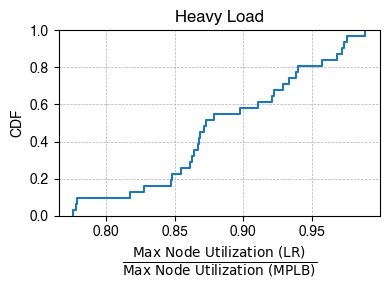

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(4, 3))

# plot cdf of latency improvement
sns.ecdfplot(ax=ax, data=max_node_cpu_ratio.loc[max_node_cpu_ratio["Run"].isin(heavily_loaded_states)], x="CPUUtil",
             palette=sns.color_palette("Set2").as_hex())
# ax.set_xlim(.95, 1.3)
# ax.set_xticks(np.arange(.95, 1.31, 0.05))

# ax.set_ylim(0.3, 1)

# # Define "exponential-looking" y-ticks between 0 and 1
# exp_ticks_raw = np.linspace(0, 1, 5)  # e.g., [0.00, 0.25, 0.5, 0.75, 1.0]
# exp_ticks = (np.exp(exp_ticks_raw) - 1) / (np.e - 1)  # normalize to [0,1]

# # Set ticks and labels using ax
# ax.set_yticks(exp_ticks)
# ax.set_yticklabels([f"$e^{{{x:.2f}}}$" for x in exp_ticks_raw])
# ax.legend_.set_title("")

ax.set_title("Heavy Load")

ax.set_ylabel("CDF")
ax.set_xlabel(r'$\frac{\mathrm{Max\ Node\ Utilization\ (MPLB)}}{\mathrm{Max\ Node\ Utilization\ (LR)}}$', fontsize=14)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
savefig("cdf_max_util_heavy")

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/1799710953.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.ecdfplot(ax=ax, data=max_node_cpu_decrease.loc[max_node_cpu_decrease["Run"].isin(states)], x="CPUUtil",
/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/1799710953.py:8: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.ecdfplot(ax=ax, data=max_node_cpu_decrease.loc[max_node_cpu_decrease["Run"].isin(states)], x="CPUUtil",
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


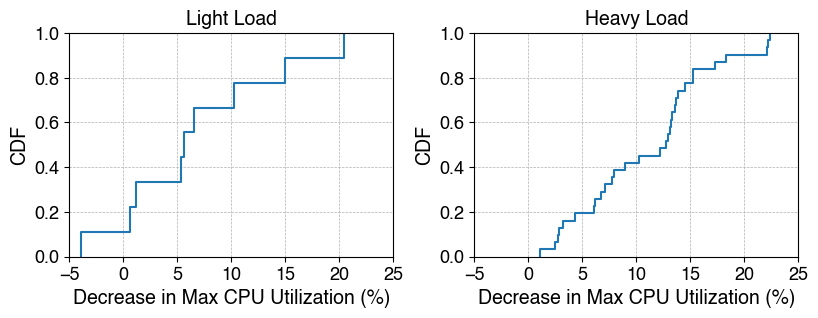

In [ ]:
n_cols = 2
_, axes = plt.subplots(1, n_cols, figsize=(4*n_cols, 3*1))

# for ax, load, states in zip(axes, ["Light", "Heavy", "Overloaded"], [lightly_loaded_states, heavily_loaded_states, infeasible_states]):
for ax, load, states in zip(axes, ["Light", "Heavy"], [lightly_loaded_states, heavily_loaded_states]):
    
    # plot cdf of latency improvement
    sns.ecdfplot(ax=ax, data=max_node_cpu_decrease.loc[max_node_cpu_decrease["Run"].isin(states)], x="CPUUtil",
                palette=sns.color_palette("Set2").as_hex())
    ax.set_xlim(-5, 25)
    ax.set_xticks(range(-5, 25+1, 5))

    # ax.set_ylim(0.3, 1)

    # # Define "exponential-looking" y-ticks between 0 and 1
    # exp_ticks_raw = np.linspace(0, 1, 5)  # e.g., [0.00, 0.25, 0.5, 0.75, 1.0]
    # exp_ticks = (np.exp(exp_ticks_raw) - 1) / (np.e - 1)  # normalize to [0,1]

    # # Set ticks and labels using ax
    # ax.set_yticks(exp_ticks)
    # ax.set_yticklabels([f"$e^{{{x:.2f}}}$" for x in exp_ticks_raw])
    # ax.legend_.set_title("")

    ax.set_title(f"{load} Load")

    ax.set_ylabel("CDF")
    ax.set_xlabel("Decrease in Max CPU Utilization (%)")

    ax.grid(True, which='both', linestyle='--', linewidth=0.5)
    ax.set_axisbelow(True)

plt.tight_layout(pad=0.05)
plt.subplots_adjust(wspace=0.25)
savefig("cdf_max_util_decrease")

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/2413121349.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.ecdfplot(ax=ax, data=max_node_cpu_decrease.loc[max_node_cpu_decrease["Run"].isin(lightly_loaded_states)], x="CPUUtil",
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


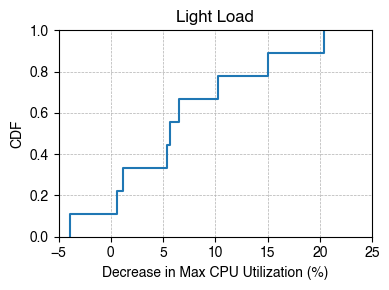

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(4, 3))

# plot cdf of latency improvement
sns.ecdfplot(ax=ax, data=max_node_cpu_decrease.loc[max_node_cpu_decrease["Run"].isin(lightly_loaded_states)], x="CPUUtil",
             palette=sns.color_palette("Set2").as_hex())
# ax.set_xlim(.95, 1.3)
# ax.set_xticks(np.arange(.95, 1.31, 0.05))
ax.set_xlim(-5, 25)
# ax.set_ylim(0.3, 1)

# # Define "exponential-looking" y-ticks between 0 and 1
# exp_ticks_raw = np.linspace(0, 1, 5)  # e.g., [0.00, 0.25, 0.5, 0.75, 1.0]
# exp_ticks = (np.exp(exp_ticks_raw) - 1) / (np.e - 1)  # normalize to [0,1]

# # Set ticks and labels using ax
# ax.set_yticks(exp_ticks)
# ax.set_yticklabels([f"$e^{{{x:.2f}}}$" for x in exp_ticks_raw])
# ax.legend_.set_title("")

ax.set_title("Light Load")

ax.set_ylabel("CDF")
ax.set_xlabel("Decrease in Max CPU Utilization (%)")

ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
savefig("cdf_max_util_decrease_light")

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/4017257241.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.ecdfplot(ax=ax, data=max_node_cpu_decrease.loc[max_node_cpu_decrease["Run"].isin(infeasible_states)], x="CPUUtil",
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


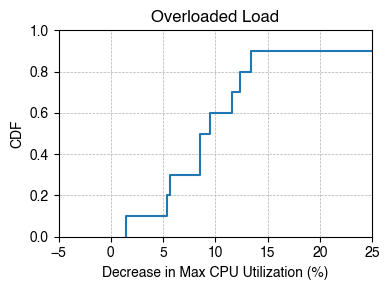

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(4, 3))

# plot cdf of latency improvement
sns.ecdfplot(ax=ax, data=max_node_cpu_decrease.loc[max_node_cpu_decrease["Run"].isin(infeasible_states)], x="CPUUtil",
             palette=sns.color_palette("Set2").as_hex())
# ax.set_xlim(.95, 1.3)
# ax.set_xticks(np.arange(.95, 1.31, 0.05))
ax.set_xlim(-5, 25)
# ax.set_ylim(0.3, 1)

# # Define "exponential-looking" y-ticks between 0 and 1
# exp_ticks_raw = np.linspace(0, 1, 5)  # e.g., [0.00, 0.25, 0.5, 0.75, 1.0]
# exp_ticks = (np.exp(exp_ticks_raw) - 1) / (np.e - 1)  # normalize to [0,1]

# # Set ticks and labels using ax
# ax.set_yticks(exp_ticks)
# ax.set_yticklabels([f"$e^{{{x:.2f}}}$" for x in exp_ticks_raw])
# ax.legend_.set_title("")

ax.set_title("Overloaded Load")

ax.set_ylabel("CDF")
ax.set_xlabel("Decrease in Max CPU Utilization (%)")

ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
savefig("cdf_max_util_decrease_overload")

In [ ]:
max_node_cpu_decrease.loc[max_node_cpu_decrease["Run"].isin(lightly_loaded_states)].quantile

/var/folders/35/6xjjlvhn18q8lhz533ycffnr0000gp/T/ipykernel_23193/413383991.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.ecdfplot(ax=ax, data=max_node_cpu_ratio.loc[max_node_cpu_ratio["Run"].isin(lightly_loaded_states)], x="CPUUtil",
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
Zapf NOT subset; don't know how to subset; dropped
feat NOT subset; don't know how to subset; dropped
meta NOT subset; don't know how to subset; dropped
morx NOT subset; don't know how to subset; dropped


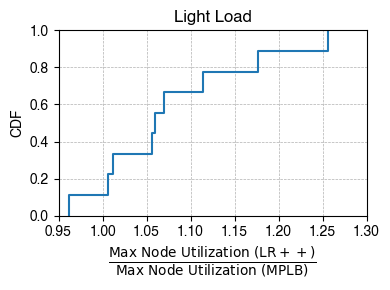

In [ ]:
_, ax = plt.subplots(1, 1, figsize=(4, 3))

# plot cdf of latency improvement
sns.ecdfplot(ax=ax, data=max_node_cpu_ratio.loc[max_node_cpu_ratio["Run"].isin(lightly_loaded_states)], x="CPUUtil",
             palette=sns.color_palette("Set2").as_hex())
ax.set_xlim(.95, 1.3)
ax.set_xticks(np.arange(.95, 1.31, 0.05))
# ax.set_ylim(0.3, 1)

# # Define "exponential-looking" y-ticks between 0 and 1
# exp_ticks_raw = np.linspace(0, 1, 5)  # e.g., [0.00, 0.25, 0.5, 0.75, 1.0]
# exp_ticks = (np.exp(exp_ticks_raw) - 1) / (np.e - 1)  # normalize to [0,1]

# # Set ticks and labels using ax
# ax.set_yticks(exp_ticks)
# ax.set_yticklabels([f"$e^{{{x:.2f}}}$" for x in exp_ticks_raw])
# ax.legend_.set_title("")

ax.set_title("Light Load")

ax.set_ylabel("CDF")
ax.set_xlabel(r'$\frac{\mathrm{Max\ Node\ Utilization\ (LR++)}}{\mathrm{Max\ Node\ Utilization\ (MPLB)}}$', fontsize=14)

ax.grid(True, which='both', linestyle='--', linewidth=0.5)
ax.set_axisbelow(True)

plt.tight_layout()
savefig("cdf_max_util_light")

In [ ]:
imprv_df = node_cpu_df.copy()
tmp_cpu_df = imprv_df.loc[imprv_df["Distribution"] == "exponential"].loc[imprv_df["ProcessDistribution"] == "exponential"].loc[imprv_df["ScaleFactor"] == 0.8].copy()
tmp_cpu_df.groupby(["Run", "LB", "Time"]).max(numeric_only=True).reset_index()

df = tmp_cpu_df
max_node_cpu_df_lr = df.loc[df["LB"] == "mplb_lr++"].groupby("Time").max(numeric_only=True)
max_node_cpu_df_mplb = df.loc[df["LB"] == "mplb_nlr"].groupby("Time").max(numeric_only=True)
max_node_cpu_ratio = (max_node_cpu_df_lr / max_node_cpu_df_mplb).reset_index()
max_node_cpu_decrease = ((max_node_cpu_df_lr - max_node_cpu_df_mplb) / max_node_cpu_df_lr * 100).reset_index()
max_node_cpu_decrease

,Run,LB,Time,ScaleFactor,Iteration,Node,AppNum,CPUUtil,LBWeight,CPUConsumptionPerReq,CPUAllocated,MaxRPSAllowed,in_experiment
0,3278,mplb_lr,0.535518,0.8,3,3,7,138.930224,126.666666,42.947171,680.036099,88,5
1,3278,mplb_lr,0.612697,0.8,1,3,7,145.666360,126.666666,94.563139,1088.757662,37,5
2,3278,mplb_lr,0.690674,0.8,2,3,7,126.065316,114.790734,56.954777,874.739440,115,5
3,3278,mplb_lr,1.103389,0.8,3,3,7,140.072993,115.157496,44.253444,719.790259,170,5
4,3278,mplb_lr,1.374123,0.8,1,3,7,108.175135,114.851372,57.125900,647.847115,167,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
35436,177161,mplb_onlr,26.341250,0.8,1,3,9,179.958233,116.480045,12.280469,833.944089,343,5
35437,177161,mplb_onlr,27.603655,0.8,3,3,9,258.950512,116.133987,11.522188,1033.377425,447,5
35438,177161,mplb_onlr,27.783566,0.8,2,3,9,247.391772,115.702919,11.755613,881.416265,373,5
35439,177161,mplb_onlr,28.726061,0.8,1,3,9,344.223386,114.774384,12.856081,1190.213055,473,5


<AxesSubplot: xlabel='CPUUtil', ylabel='Proportion'>

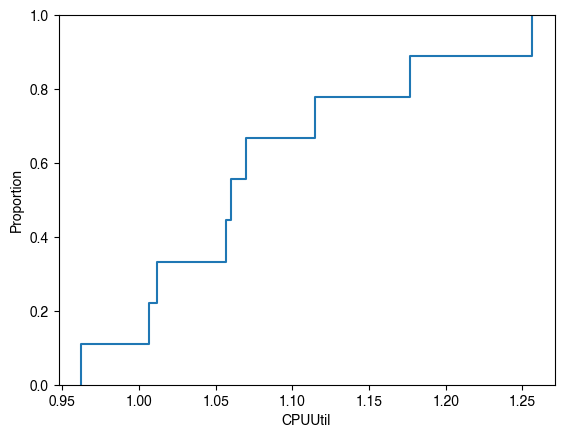

In [ ]:
sns.ecdfplot(data=max_node_cpu_ratio.loc[max_node_cpu_ratio["Run"].isin(lightly_loaded_states)], x="CPUUtil")

<AxesSubplot: xlabel='CPUUtil', ylabel='Proportion'>

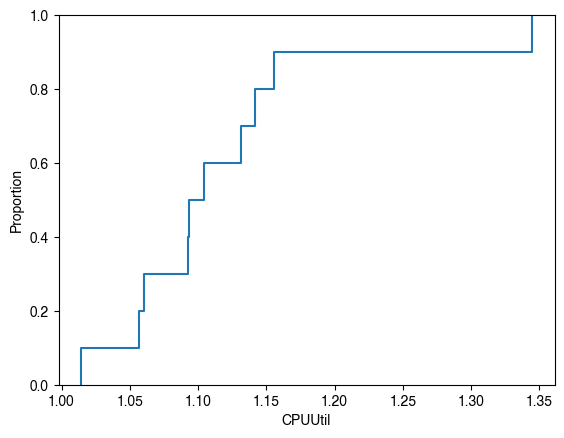

In [ ]:
sns.ecdfplot(data=max_node_cpu_ratio.loc[max_node_cpu_ratio["Run"].isin(infeasible_states)], x="CPUUtil")


In [ ]:
imprv_df = node_cpu_df.copy()
tmp_cpu_df = imprv_df.loc[imprv_df["Distribution"] == "exponential"].loc[imprv_df["ProcessDistribution"] == "exponential"].loc[imprv_df["ScaleFactor"] == 0.8].copy()
#.loc[imprv_df["State"].isin(high_load_states)].copy()
# tmp_cpu_df["LB"] = tmp_cpu_df["LB"].apply(lambda x: LB[x])
tmp_cpu_df


,ScaleFactor,LB,Distribution,ProcessDistribution,Run,Iteration,Node,Time,AppNum,CPUUtil,LBWeight,CPUConsumptionPerReq,CPUAllocated,MaxRPSAllowed,in_experiment
0,0.8,mplb_lr,exponential,exponential,3278,1,1,0.612697,3,89.009685,66.666666,94.563139,1088.757662,37,5
1,0.8,mplb_lr,exponential,exponential,3278,1,1,1.374123,3,108.175135,70.297258,23.149045,647.847115,167,5
2,0.8,mplb_lr,exponential,exponential,3278,1,1,2.188931,3,160.394214,69.087716,17.795279,783.950729,224,5
3,0.8,mplb_lr,exponential,exponential,3278,1,1,2.761146,3,132.371731,67.278009,15.286356,463.850444,177,5
4,0.8,mplb_lr,exponential,exponential,3278,1,1,3.433572,3,121.431701,66.786129,14.276914,467.031329,163,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106318,0.8,mplb_onlr,exponential,exponential,177161,3,3,19.030185,9,171.980232,66.930884,11.238811,774.969310,346,5
106319,0.8,mplb_onlr,exponential,exponential,177161,3,3,21.295734,9,201.400055,68.163165,11.205982,752.508914,336,5
106320,0.8,mplb_onlr,exponential,exponential,177161,3,3,22.994148,9,196.746407,67.806544,10.988318,841.246291,381,5
106321,0.8,mplb_onlr,exponential,exponential,177161,3,3,25.461317,9,273.601624,70.466891,11.518400,1106.889271,477,5


Light Load
1p: 30.1 %		mplb:64.0	lr:91.5
25p: 8.9 %		mplb:115.8	lr:127.1
50p: 7.1 %		mplb:133.1	lr:143.3
75p: 5.6 %		mplb:150.2	lr:159.0
99p: 4.2 %		mplb:192.2	lr:200.6
Heavy Load
1p: 30.7 %		mplb:62.4	lr:90.0
25p: 8.5 %		mplb:130.0	lr:142.1
50p: 5.8 %		mplb:151.7	lr:160.9
75p: 6.7 %		mplb:170.9	lr:183.0
99p: 13.0 %		mplb:245.1	lr:281.7
Overloaded Load
1p: 60.8 %		mplb:46.2	lr:117.7
25p: 13.5 %		mplb:173.1	lr:200.2
50p: 7.7 %		mplb:204.4	lr:221.4
75p: 7.0 %		mplb:230.1	lr:247.5
99p: 7.5 %		mplb:305.8	lr:330.6


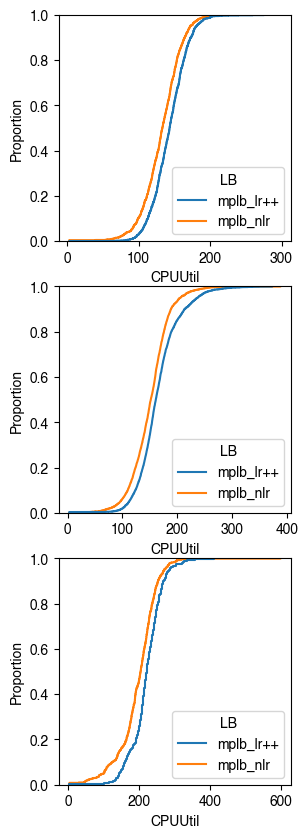

In [ ]:
_, axes = plt.subplots(3, 1, figsize=(3, 10))
mplb = "mplb_nlr"
lr = "mplb_lr++"
for i, load in enumerate(zip(["Light", "Heavy", "Overloaded"], [lightly_loaded_states, heavily_loaded_states, infeasible_states])):
    load, states = load
    print(f"{load} Load")
    t = tmp_cpu_df.loc[tmp_cpu_df["Run"].isin(states)].groupby(["Run", "LB", "Time"]).max(numeric_only=True).reset_index()
    sns.ecdfplot(ax=axes[i], data=t, x="CPUUtil", hue="LB", hue_order=[lr, mplb])
    t = t[["LB", "CPUUtil"]].groupby("LB")
    for q in [.01, .25, .5, .75, .99]:
        Q = t.quantile(q, numeric_only=True)["CPUUtil"]
        print(f"{int(q*100)}p: {(Q[mplb] - Q[lr]) / Q[lr] * 100 * -1:.1f} %\t\tmplb:{Q[mplb]:.1f}\tlr:{Q[lr]:.1f}")

In [ ]:
t

,LB,CPUUtil
0,mplb_lr,138.930224
1,mplb_lr,145.666360
2,mplb_lr,126.065316
3,mplb_lr,140.072993
4,mplb_lr,108.175135
...,...,...
23520,mplb_onlr,193.678326
23521,mplb_onlr,153.675212
23522,mplb_onlr,167.668040
23523,mplb_onlr,183.546207


# Svc Utilization

In [ ]:
svc_cpu_df = cpu_df.loc[cpu_df["in_experiment"] == True].loc[cpu_df["Svc"].str.contains("svc")].groupby(["ScaleFactor", "LB", "Distribution", "ProcessDistribution", "Run", "Iteration", "Svc", "Time"]).sum(numeric_only=True).reset_index()

svc_mean_cpu_df_lr = svc_cpu_df.loc[svc_cpu_df["LB"] == "mplb_lr++"].groupby(["ScaleFactor", "Distribution", "ProcessDistribution", "Run", "Svc"]).mean(numeric_only=True)
svc_mean_cpu_df_mplb = svc_cpu_df.loc[svc_cpu_df["LB"] == "mplb_nlr"].groupby(["ScaleFactor", "Distribution", "ProcessDistribution", "Run", "Svc"]).mean(numeric_only=True)

svc_mean_imprv_cpu_df = (((svc_mean_cpu_df_mplb - svc_mean_cpu_df_lr) / svc_mean_cpu_df_lr * 100)).reset_index()
svc_mean_imprv_cpu_df

# max_svc_cpu_df = svc_mean_cpu_df.groupby(["ScaleFactor", "LB", "Distribution", "ProcessDistribution", "Run"]).max(numeric_only=True).reset_index()
# max_svc_cpu_df

# df = svc_mean_cpu_df
# max_svc_cpu_df_lr = df.loc[df["LB"] == "mplb_lr++"].groupby("Run").max(numeric_only=True)
# max_svc_cpu_df_mplb = df.loc[df["LB"] == "mplb_nlr"].groupby("Run").max(numeric_only=True)

# max_svc_cpu_ratio = (max_svc_cpu_df_lr / max_svc_cpu_df_mplb).reset_index()
# max_svc_cpu_ratio

,ScaleFactor,Distribution,ProcessDistribution,Run,Svc,Iteration,Time,AppNum,CPUUtil,LBWeight,CPUConsumptionPerReq,CPUAllocated,MaxRPSAllowed,Node,in_experiment
0,0.8,exponential,exponential,3278,svc0,1.013967,-0.165410,NaN,-0.882740,-1.000400e-08,5.682308,-3.215118,-5.631880,0.0,0.0
1,0.8,exponential,exponential,3278,svc1,1.013967,-0.165410,0.0,4.247250,-4.401761e-08,29.422994,12.100524,-5.614699,0.0,0.0
2,0.8,exponential,exponential,3278,svc2,1.013967,-0.165410,0.0,-5.563067,0.000000e+00,-22.056428,4.375337,13.907419,0.0,0.0
3,0.8,exponential,exponential,4610,svc0,-0.361011,-1.660330,NaN,0.714519,1.449276e-08,4.764639,9.280577,3.792064,0.0,0.0
4,0.8,exponential,exponential,4610,svc1,-0.361011,-1.660330,0.0,-5.000836,-6.795928e-08,-18.068984,10.540467,29.443561,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,0.8,exponential,exponential,173166,svc1,1.973684,-9.654774,0.0,-6.349719,0.000000e+00,2.964615,24.581760,2.787456,0.0,0.0
146,0.8,exponential,exponential,173166,svc2,1.973684,-9.654774,0.0,-9.323076,0.000000e+00,-54.121245,-5.250655,-6.499430,0.0,0.0
147,0.8,exponential,exponential,177161,svc0,-0.925926,-17.033483,NaN,0.735266,0.000000e+00,-1.292689,0.729439,-1.132120,0.0,0.0
148,0.8,exponential,exponential,177161,svc1,-0.925926,-17.033483,0.0,-10.624030,1.399656e-07,33.866091,40.760459,8.318798,0.0,0.0


<AxesSubplot: xlabel='CPUUtil', ylabel='Proportion'>

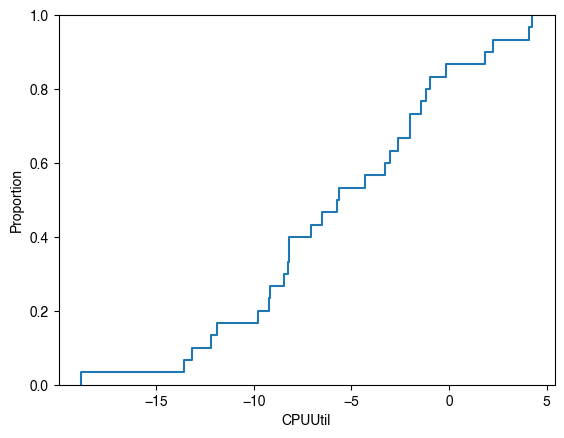

In [ ]:
sns.ecdfplot(data=svc_mean_imprv_cpu_df.loc[svc_mean_imprv_cpu_df["Run"].isin(demand_satisfied_only_global)], x="CPUUtil")

In [ ]:
svc_mean_imprv_cpu_df.loc[svc_mean_imprv_cpu_df["Run"].isin(demand_satisfied_only_global)]

,ScaleFactor,Distribution,ProcessDistribution,Run,Svc,Iteration,Time,AppNum,CPUUtil,LBWeight,CPUConsumptionPerReq,CPUAllocated,MaxRPSAllowed,Node,in_experiment
54,0.8,exponential,exponential,66752,svc0,0.769231,-5.684229,NaN,-5.627082,-7.692307e-09,-5.078848,20.902598,9.636990,0.0,0.0
55,0.8,exponential,exponential,66752,svc1,0.769231,-5.684229,0.0,-3.259484,0.000000e+00,-6.581816,13.250132,13.289887,0.0,0.0
56,0.8,exponential,exponential,66752,svc2,0.769231,-5.684229,0.0,4.109544,0.000000e+00,9.048455,32.460996,18.482724,0.0,0.0
69,0.8,exponential,exponential,72380,svc0,0.551950,-1.461158,NaN,-1.990582,0.000000e+00,-17.887079,2.450434,-1.526403,0.0,0.0
70,0.8,exponential,exponential,72380,svc1,0.551950,-1.461158,0.0,2.254985,0.000000e+00,0.959896,4.967507,-5.652156,0.0,0.0
71,0.8,exponential,exponential,72380,svc2,0.551950,-1.461158,0.0,-2.622576,0.000000e+00,-2.666589,24.308833,8.874646,0.0,0.0
99,0.8,exponential,exponential,93335,svc0,-1.820290,0.030614,NaN,-8.183754,0.000000e+00,0.787503,9.269550,2.155650,0.0,0.0
100,0.8,exponential,exponential,93335,svc1,-1.820290,0.030614,0.0,1.846653,5.110184e-08,22.323593,20.679923,4.794964,0.0,0.0
101,0.8,exponential,exponential,93335,svc2,-1.820290,0.030614,0.0,-13.590418,0.000000e+00,-4.610007,-4.115817,-0.177323,0.0,0.0
108,0.8,exponential,exponential,112326,svc0,4.081633,-2.179842,NaN,-5.718493,0.000000e+00,-6.833240,-7.324751,-3.691520,0.0,0.0


In [ ]:
svc_mean_imprv_cpu_df.loc[svc_mean_imprv_cpu_df["Run"].isin(demand_satisfied_both)].head(50)

,ScaleFactor,Distribution,ProcessDistribution,Run,Svc,Iteration,Time,AppNum,CPUUtil,LBWeight,CPUConsumptionPerReq,CPUAllocated,MaxRPSAllowed,Node,in_experiment
0,0.8,exponential,exponential,3278,svc0,1.013967,-0.165410,NaN,-0.882740,-1.000400e-08,5.682308,-3.215118,-5.631880,0.0,0.0
1,0.8,exponential,exponential,3278,svc1,1.013967,-0.165410,0.0,4.247250,-4.401761e-08,29.422994,12.100524,-5.614699,0.0,0.0
2,0.8,exponential,exponential,3278,svc2,1.013967,-0.165410,0.0,-5.563067,0.000000e+00,-22.056428,4.375337,13.907419,0.0,0.0
3,0.8,exponential,exponential,4610,svc0,-0.361011,-1.660330,NaN,0.714519,1.449276e-08,4.764639,9.280577,3.792064,0.0,0.0
4,0.8,exponential,exponential,4610,svc1,-0.361011,-1.660330,0.0,-5.000836,-6.795928e-08,-18.068984,10.540467,29.443561,0.0,0.0
5,0.8,exponential,exponential,4610,svc2,-0.361011,-1.660330,0.0,-3.560656,0.000000e+00,5.662702,2.064164,-1.065015,0.0,0.0
6,0.8,exponential,exponential,6872,svc0,-1.351351,-0.494617,NaN,-0.626068,-6.038192e-09,2.739351,3.645282,0.335597,0.0,0.0
7,0.8,exponential,exponential,6872,svc1,-1.351351,-0.494617,0.0,-5.154035,0.000000e+00,4.774712,3.336413,-0.152250,0.0,0.0
8,0.8,exponential,exponential,6872,svc2,-1.351351,-0.494617,0.0,-11.633084,0.000000e+00,-4.727720,-3.290840,5.506631,0.0,0.0
9,0.8,exponential,exponential,8619,svc0,-1.092011,-0.993907,NaN,-0.683766,0.000000e+00,7.180141,2.841678,-4.453127,0.0,0.0


In [ ]:
41100, 122890

41100

In [ ]:
# Example: Creating subplots in a row with 1:1:5 width ratios
import matplotlib.pyplot as plt
import numpy as np

# Create figure with subplots - 1 row, 3 columns with width ratios 1:1:5
fig, axes = plt.subplots(1, 3, figsize=(12, 4), gridspec_kw={'width_ratios': [1, 1, 5]})

# Sample data for demonstration
x = np.linspace(0, 10, 100)
y1 = np.sin(x)
y2 = np.cos(x)
y3 = np.sin(x) * np.cos(x)

# Plot on each subplot
axes[0].plot(x, y1)
axes[0].set_title('Plot 1 (width=1)')

axes[1].plot(x, y2)
axes[1].set_title('Plot 2 (width=1)')

axes[2].plot(x, y3)
axes[2].set_title('Plot 3 (width=5)')

plt.tight_layout()
plt.show()